In [7]:
import math

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, random_split, Subset
from pytorch_msssim import ms_ssim

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.ndimage import zoom
from sklearn.model_selection import KFold

In [8]:
col = pd.read_pickle('/Volumes/easystore/proton-deuteron/col&ind/chi-col.pkl')
ind = pd.read_pickle('/Volumes/easystore/proton-deuteron/col&ind/chi-ind.pkl')

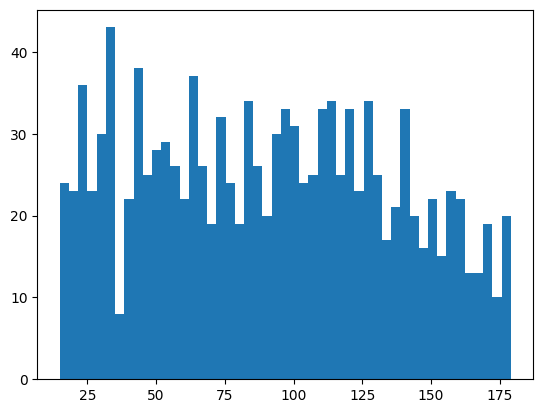

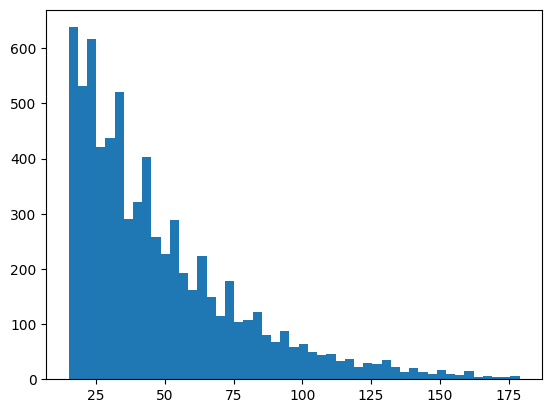

In [9]:
bins = np.linspace(15, 179, 50)
plt.hist(col[col['particle_type'] == 'kaon']['height'], bins=bins); plt.show()
plt.hist(col[col['particle_type'] == 'proton']['height'], bins=bins); plt.show()

In [10]:
removed_indices_col = col[~((col['height'] > 15) & (col['height'] < 179) & (col['width'] < 1500))].index            # remove long and wide images
removed_indices_ind = ind[~((ind['height'] > 15) & (ind['height'] < 179) & (ind['width'] < 1500))].index


removed_indices = removed_indices_col.union(removed_indices_ind)

col = col[~col.index.isin(removed_indices)]; print(col.shape)
ind = ind[~ind.index.isin(removed_indices)]; print(ind.shape)

(7877, 43)
(7877, 43)


In [11]:
def cut_start(image, target=50):
    """
    Selects only the last {target} no. of rows (wires) of an image.
    """
    return image[-target:, :]

In [12]:
def pad_image(image, target_wh=(1502, 179)):
    """
    Place a 2D image block in the centre of a zero canvas.

    image: 2D np.ndarray, shape (h, w)
    target_wh: (target_width, target_height)
    """
    target_w, target_h = target_wh
    canvas = np.zeros((target_h, target_w), dtype=image.dtype)

    h, w = image.shape
    
    v = int(np.argmax(image[0]))

    a = 751 - v
    
    # Compute top-left corner so image is centred, clamped to fit within canvas
    y0 = 0
    x0 = max(0, min(a, target_w - w))  # Clamp to valid range [0, target_w - w]
    y1 = y0 + h
    x1 = x0 + w

    # Place the image block
    canvas[y0:y1, x0:x1] = image

    return canvas

def pad_image_batch_gpu(images_list, target_wh=(1502, 51), device='cuda', batch_size=32, cut_rows=None):
    """
    GPU-accelerated batch padding of images.
    
    images_list: list of 2D np.ndarrays
    target_wh: (target_width, target_height)
    device: 'cuda' or 'cpu'
    batch_size: number of images to process at once
    """
    target_w, target_h = target_wh
    results = []
    
    for batch_start in range(0, len(images_list), batch_size):
        batch_end = min(batch_start + batch_size, len(images_list))
        batch_images = images_list[batch_start:batch_end]

        if cut_rows is not None:
            batch_images = [cut_start(img, target=cut_rows) for img in batch_images]
        
        # Find max dimensions in batch
        max_h = max(img.shape[0] for img in batch_images)
        max_w = max(img.shape[1] for img in batch_images)
        
        # Create padded batch on GPU
        padded_batch = torch.zeros(
            len(batch_images), target_h, target_w,
            dtype=torch.float32, device=device
        )
        
        for i, img in enumerate(batch_images):
            img_tensor = torch.from_numpy(img).float().to(device)
            h, w = img.shape
            
            # Find peak position
            v = torch.argmax(img_tensor[0]).item()
            a = 751 - v
            
            # Compute placement
            y0 = 0
            x0 = max(0, min(a, target_w - w))
            y1 = y0 + h
            x1 = x0 + w
            
            # Place on canvas
            padded_batch[i, y0:y1, x0:x1] = img_tensor
        
        # Move back to CPU and convert to numpy
        results.extend(padded_batch.cpu().numpy())
    
    return results


def downsample_image(image, target_shape=(512, 40)):
    '''
    Reduce an image from original to target shape.
    '''
    scale_y = target_shape[1] / image.shape[0]
    scale_x = target_shape[0] / image.shape[1]
    return zoom(image, (scale_y, scale_x), order=1)  # order=1 for bilinear interpolation


In [13]:
# making the images for the VAE model (GPU-accelerated)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Separate by particle type
p_c_list = col[col['particle_type'] == 'proton']['image_intensity'].tolist()
p_i_list = ind[ind['particle_type'] == 'proton']['image_intensity'].tolist()
k_c_list = col[col['particle_type'] == 'kaon']['image_intensity'].tolist()
k_i_list = ind[ind['particle_type'] == 'kaon']['image_intensity'].tolist()

print(f"Processing {len(p_c_list)} proton collection, {len(p_i_list)} proton induction, "
      f"{len(k_c_list)} kaon collection, {len(k_i_list)} kaon induction images...")

# GPU batch padding
p_c = np.array(pad_image_batch_gpu(p_c_list, device=device, batch_size=64, cut_rows=50))
p_i = np.array(pad_image_batch_gpu(p_i_list, device=device, batch_size=64, cut_rows=50))
k_c = np.array(pad_image_batch_gpu(k_c_list, device=device, batch_size=64, cut_rows=50))
k_i = np.array(pad_image_batch_gpu(k_i_list, device=device, batch_size=64, cut_rows=50))

print(f"Padded shapes: p_c={p_c.shape}, p_i={p_i.shape}, k_c={k_c.shape}, k_i={k_i.shape}")

# Downsample on GPU using PyTorch
p_c_tensor = torch.from_numpy(p_c).float().to(device)
p_i_tensor = torch.from_numpy(p_i).float().to(device)
k_c_tensor = torch.from_numpy(k_c).float().to(device)
k_i_tensor = torch.from_numpy(k_i).float().to(device)

# Use F.interpolate for GPU-accelerated downsampling
p_c_d = F.interpolate(p_c_tensor.unsqueeze(1), size=(48, 48), mode='bilinear', align_corners=False).squeeze(1).cpu().numpy()
p_i_d = F.interpolate(p_i_tensor.unsqueeze(1), size=(48, 48), mode='bilinear', align_corners=False).squeeze(1).cpu().numpy()
k_c_d = F.interpolate(k_c_tensor.unsqueeze(1), size=(48, 48), mode='bilinear', align_corners=False).squeeze(1).cpu().numpy()
k_i_d = F.interpolate(k_i_tensor.unsqueeze(1), size=(48, 48), mode='bilinear', align_corners=False).squeeze(1).cpu().numpy()

print(f"Downsampled shapes: p_c_d={p_c_d.shape}, p_i_d={p_i_d.shape}, k_c_d={k_c_d.shape}, k_i_d={k_i_d.shape}")


Using device: cpu
Processing 6777 proton collection, 6777 proton induction, 1100 kaon collection, 1100 kaon induction images...
Padded shapes: p_c=(6777, 51, 1502), p_i=(6777, 51, 1502), k_c=(1100, 51, 1502), k_i=(1100, 51, 1502)
Downsampled shapes: p_c_d=(6777, 48, 48), p_i_d=(6777, 48, 48), k_c_d=(1100, 48, 48), k_i_d=(1100, 48, 48)


In [14]:
p_i_d.shape, p_c_d.shape, k_i_d.shape, k_c_d.shape

((6777, 48, 48), (6777, 48, 48), (1100, 48, 48), (1100, 48, 48))

In [15]:
protimages = np.stack([p_c, p_i], axis=1)
kaonimages = np.stack([k_c, k_i], axis=1)       

In [16]:
p = np.stack([p_c_d, p_i_d], axis=1)            # shape: (N, 2, H, W)
k = np.stack([k_c_d, k_i_d], axis=1)            # shape: (N, 2, H, W)

p = torch.from_numpy(p).float()
k = torch.from_numpy(k).float()

In [17]:
p = torch.log1p(p)
k = torch.log1p(k)

<Axes: >

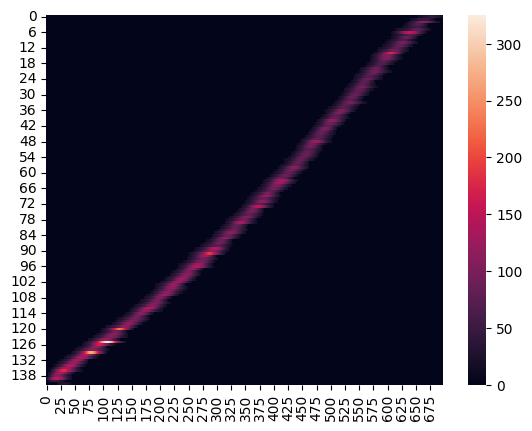

In [18]:
sns.heatmap(col[col['particle_type'] == 'kaon']['image_intensity'].iloc[1099])
# plt.xlabel('Time Ticks')
# plt.ylabel('Wires')


<Axes: >

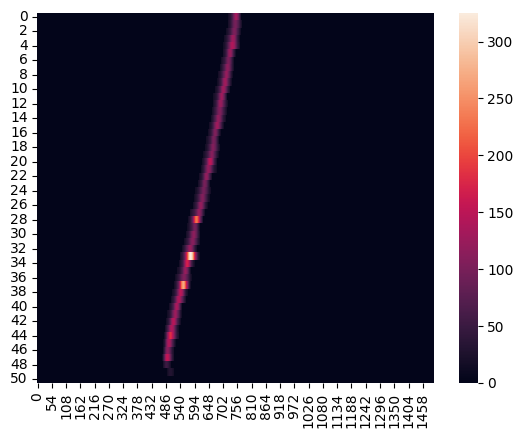

In [19]:
sns.heatmap(kaonimages[1099, 0])

<Axes: >

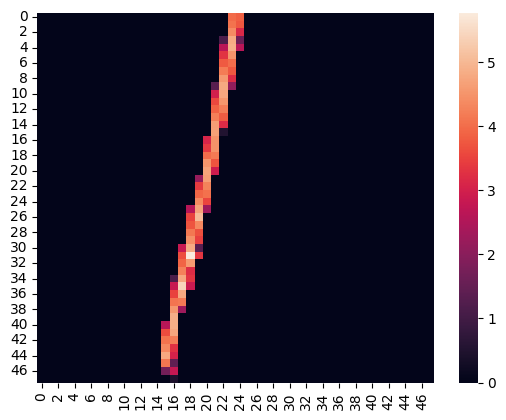

In [20]:
sns.heatmap(k[1099, 0])

In [21]:
class VAE(nn.Module):
    def __init__(self, input_hw=(240, 240), latent=8, p_enc=0.2):
        super(VAE, self).__init__()
        in_h, in_w = input_hw
        assert in_h % 16 == 0 and in_w % 16 == 0, "input spatial dims must be divisible by 16"

        self.encoder = nn.Sequential(
            nn.Conv2d(2, 32, 5, stride=2, padding=2), nn.BatchNorm2d(32), nn.Softplus(), nn.Dropout2d(p_enc),
            nn.Conv2d(32, 64, 5, stride=2, padding=2), nn.BatchNorm2d(64), nn.Softplus(), nn.Dropout2d(p_enc),
            nn.Conv2d(64, 128, 5, stride=2, padding=2), nn.BatchNorm2d(128), nn.Softplus(), nn.Dropout2d(p_enc),
            nn.Conv2d(128, 256, 5, stride=2, padding=2), nn.BatchNorm2d(256), nn.Softplus(), nn.Dropout2d(p_enc)
        )

        self.h_enc = in_h // 16
        self.w_enc = in_w // 16
        flat_size = 256 * self.h_enc * self.w_enc

        self.fc_mu = nn.Linear(flat_size, latent)
        self.fc_logvar = nn.Linear(flat_size, latent)

        self.fc_dec = nn.Linear(latent, flat_size)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(128), nn.Softplus(),
            nn.ConvTranspose2d(128, 64, 5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(64), nn.Softplus(),
            nn.ConvTranspose2d(64, 32, 5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(32), nn.Softplus(),
            nn.ConvTranspose2d(32, 2, 5, stride=2, padding=2, output_padding=1),
            nn.Softplus()
        )
    
    def encode(self, x):
        h = self.encoder(x)
        h = h.flatten(1)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar
    
    def reparameterise(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def decode(self, z):
        h = self.fc_dec(z)
        h = h.view(z.size(0), 256, self.h_enc, self.w_enc)
        return self.decoder(h)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterise(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar, z

In [22]:
def recon_loss_mse(recon, x):
    return F.mse_loss(recon, x, reduction="sum")

def weighted_mse_loss(recon, target, weight=10.0):
    # Create a mask: 1.0 where there is signal, 0.0 where background
    mask = (target > 0.01).float() 
    
    # Calculate squared error
    loss = (recon - target) ** 2
    
    # Multiply error by 'weight' where mask is 1, else keep as is
    weighted_loss = loss * (1 + (weight - 1) * mask)
    
    return weighted_loss.view(recon.size(0), -1).sum(dim=1).mean()

def kl_divergence(mu, logvar):
    # returns mean KL per batch (scalar)
    kl = 0.5 * torch.sum(torch.exp(logvar) + mu**2 - 1.0 - logvar, dim=1)
    return kl.mean()

def vae_loss(recon, x, mu, logvar, beta=1.0):
    r = weighted_mse_loss(recon, x)
    kl = kl_divergence(mu, logvar)
    return r + beta * kl, r, kl

In [23]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Training device:", device)

X = torch.tensor(p, dtype=torch.float32)  # shape (N, 2, H, W)

epochs = 200
batch_size = 32
beta = 10.0

fold_train_losses, fold_val_losses = [], []
fold_REs = []
fold_REs_k = []

Training device: mps


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_28403/2670421361.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X = torch.tensor(p, dtype=torch.float32)  # shape (N, 2, H, W)


In [24]:
# 80/20 split training (alternative to k-fold)
from sklearn.model_selection import train_test_split

# Split indices
all_indices = np.arange(len(p))
train_idx, val_idx = train_test_split(all_indices, test_size=0.2, random_state=42)

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Training device:", device)

train_subset = Subset(p, train_idx)
val_subset = Subset(p, val_idx)

train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

Training device: mps


In [25]:
# # Initialize model, optimizer, loss
# model = VAE(input_hw=(48, 48), latent=4).to(device)

# # Load model 
# # loaded_model = VAE(input_hw=(48, 48), latent=4).to(device)
# # loaded_model.load_state_dict(torch.load("model_vae.pt"))
# # loaded_model.eval()
# # print("Model loaded successfully")
# # model = loaded_model

# optim = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
# # loss_fn = vae_loss()

# train_losses = []
# val_losses = []
# train_recon, train_kl = [], []
# val_recon, val_kl = [], []


# # Training
# print("===== Training (80/20 split) =====")
# for epoch in range(epochs):
#     model.train()
#     total_train, tot_r, tot_kl = 0.0, 0.0, 0.0

#     for xb in train_loader:
#         xb = xb.to(device)
#         optim.zero_grad()

#         recon, mu, logvar, _ = model(xb)
#         loss, r, kl = vae_loss(recon, xb, mu, logvar, beta=beta)
        
#         loss.backward()
#         optim.step()
        
#         total_train += loss.item()
#         tot_r += r.item()
#         tot_kl += kl.item()

#     train_losses.append(total_train / len(train_loader))
#     train_recon.append(tot_r / len(train_loader))
#     train_kl.append(tot_kl / len(train_loader))

#     model.eval()
#     total_val, tot_r, tot_kl = 0.0, 0.0, 0.0
#     with torch.no_grad():
#         for xb in val_loader:
#             xb = xb.to(device)
#             recon, mu, logvar, _ = model(xb)
#             loss, r, kl = vae_loss(recon, xb, mu, logvar, beta=beta)
#             total_val += loss.item()
#             tot_r += r.item()
#             tot_kl += kl.item()

#     val_losses.append(total_val / len(val_loader))
#     val_recon.append(tot_r / len(val_loader))
#     val_kl.append(tot_kl / len(val_loader))

#     if (epoch + 1) % 10 == 0:
#         print(
#             f"Epoch {epoch+1}/{epochs} | "
#             f"Train loss={train_losses[-1]:.6f} (recon={train_recon[-1]:.6f}, kl={train_kl[-1]:.6f}) | "
#             f"Val loss={val_losses[-1]:.6f} (recon={val_recon[-1]:.6f}, kl={val_kl[-1]:.6f})"
#         )

# # Save model
# torch.save(model.state_dict(), "model_vae_ends50.pt")
# print("\nModel saved as model_vae_ends50.pt")


In [26]:
# # Load model
# loaded_model = VAE(input_hw=(48, 48), latent=4).to(device)
# loaded_model.load_state_dict(torch.load("model_vae_ends50.pt"))
# loaded_model.eval()
# print("Model loaded successfully")
# model = loaded_model

# # ===== Inference on validation set =====
# print("\nComputing validation REs...")

# device_inf = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device_inf)

# X_val_np = torch.stack([val_subset[i] for i in range(len(val_subset))]).cpu().numpy()
# N, C, H, W = X_val_np.shape
# recon_all = np.empty((N, C, H, W), dtype=np.float32)


# model.eval()
# latent_dim = model.fc_mu.out_features
# latent_vectors = np.empty((N, latent_dim), dtype=np.float32)

# with torch.no_grad():
#     for i in range(0, N, 8):
#         j = min(i + 8, N)
#         xb = torch.tensor(X_val_np[i:j], dtype=torch.float32).to(device_inf)

#         recon, mu, logvar, z = model(xb)
#         recon_all[i:j] = recon.cpu().numpy()
#         latent_vectors[i:j] = mu.cpu().numpy()
        
#         if device_inf.type == "mps":
#             try:
#                 torch.mps.empty_cache()
#             except Exception:
#                 pass

# mse_per_pixel = (recon_all - X_val_np) ** 2
# RE_per_sample = mse_per_pixel.mean(axis=(1, 2, 3))

# # Wrap in lists to maintain compatibility with downstream code
# fold_train_losses = [train_losses]
# fold_val_losses = [val_losses]
# fold_REs = [RE_per_sample]

# plt.figure(figsize=(8, 5))
# plt.hist(RE_per_sample, bins=100, color='steelblue', alpha=0.8)
# plt.xlabel("Reconstruction Error")
# plt.ylabel("Number of Samples")
# plt.title("Validation RE Distribution (80/20 split)")
# plt.yscale('log')
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()

# # ===== Inference on kaon data =====
# print("Computing RE on kaon dataset...")

# Xk_np = k.cpu().numpy() if torch.is_tensor(k) else np.array(k, dtype=np.float32)
# N, C, H, W = Xk_np.shape

# recon_all_k = np.empty((N, C, H, W), dtype=np.float32)
# latent_vectors_k = np.empty((N, latent_dim), dtype=np.float32)

# with torch.no_grad():
#     for i in range(0, N, 8):
#         j = min(i + 8, N)
#         xb = torch.tensor(Xk_np[i:j], dtype=torch.float32).to(device_inf)

#         recon, mu, logvar, z = model(xb)
#         recon_all_k[i:j] = recon.cpu().numpy()
#         latent_vectors_k[i:j] = mu.cpu().numpy()

#         if device_inf.type == "mps":
#             try:
#                 torch.mps.empty_cache()
#             except Exception:
#                 pass

# RE_k = ((recon_all_k - Xk_np) ** 2).mean(axis=(1, 2, 3))
# fold_REs_k = [RE_k]

# plt.figure(figsize=(8, 5))
# plt.hist(RE_k, bins=100, color='darkorange', alpha=0.8)
# plt.yscale('log')
# plt.xlabel("Reconstruction Error")
# plt.ylabel("Samples")
# plt.title("Kaon RE Distribution")
# plt.tight_layout()
# plt.show()

# # Plot training curves
# plt.figure(figsize=(10, 6))
# plt.plot(train_losses, label='Training Loss')
# plt.plot(val_losses, label='Validation Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.title('Training and Validation Loss Curves (80/20 split)')
# plt.legend()
# plt.grid(True)
# plt.tight_layout()
# plt.show()

# # Plot combined RE distributions
# all_RE_val = np.concatenate(fold_REs)
# all_RE_k = np.concatenate(fold_REs_k)

# plt.figure(figsize=(8, 5))
# plt.hist(all_RE_val, bins=100, density=True, alpha=0.6, color='steelblue', label='Validation')
# plt.hist(all_RE_k, bins=100, density=True, alpha=0.6, color='darkorange', label='Kaons')
# plt.xlabel("Reconstruction Error")
# plt.ylabel("Probability Density")
# plt.title("Normalised Reconstruction Error Distributions (80/20 split)")
# plt.yscale('log')
# plt.grid(True, alpha=0.3)
# plt.legend()
# plt.tight_layout()
# plt.show()

# print(f"Validation mean RE: {all_RE_val.mean():.10f} ± {all_RE_val.std():.10f}")
# print(f"Kaons mean RE: {all_RE_k.mean():.10f} ± {all_RE_k.std():.10f}")

In [27]:
# plt.figure(figsize=(10, 6))
# plt.plot(torch.tensor(fold_train_losses).mean(dim=0), label='Avg Training Loss')
# plt.plot(torch.tensor(fold_val_losses).mean(dim=0), label='Avg Validation Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.title(f'Average Loss Curves')
# plt.legend()
# plt.grid(True)
# # plt.savefig('Loss.png', dpi=1000)
# plt.show()

In [28]:
# all_RE_val = np.concatenate(fold_REs)
# all_RE_k  = np.concatenate(fold_REs_k)

# plt.figure(figsize=(8, 5))
# plt.hist(all_RE_val, bins=100, density=True, alpha=0.6, color='steelblue', label='Validation (p_d)')
# plt.hist(all_RE_k, bins=100, density=True, alpha=0.6, color='darkorange', label='Unseen (k)')
# plt.xlabel("Reconstruction Error")
# plt.ylabel("Probability Density")
# plt.title("Normalised Reconstruction Error Distributions")
# plt.yscale('log')
# plt.grid(True, alpha=0.3)
# plt.legend()
# plt.tight_layout()
# plt.show()

# print(f"Validation mean RE: {all_RE_val.mean():.10f} ± {all_RE_val.std():.10f}")
# print(f"Unseen (d_d) mean RE: {all_RE_k.mean():.10f} ± {all_RE_k.std():.10f}")

In [29]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

loaded_model = VAE(input_hw=(48, 48), latent=4).to(device)

state_dict = torch.load("model_vae_ends50.pt", map_location=device)
loaded_model.load_state_dict(state_dict)

loaded_model.eval()
model = loaded_model
print("Model loaded successfully on", device)

Model loaded successfully on mps


Inference device: mps
recon_all.shape: (5421, 2, 48, 48)
latent_vectors.shape: (5421, 4)
RE_per_sample.shape: (5421,)


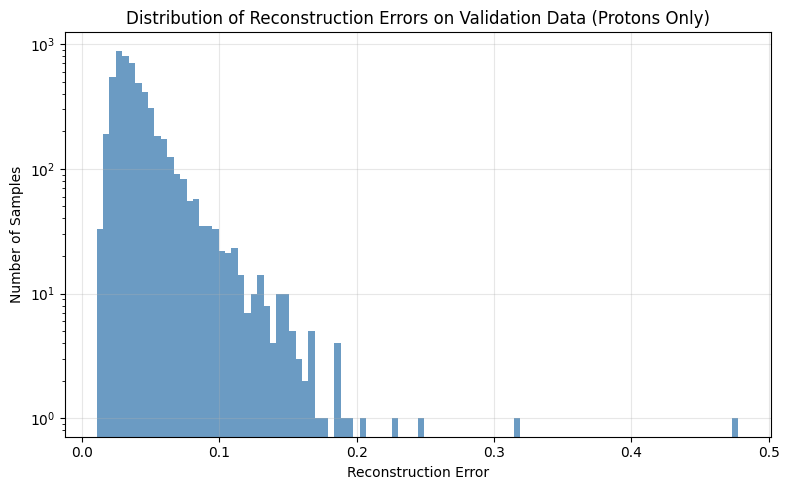

In [30]:
model.eval()

device_inf = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Inference device:", device_inf)

model.to(device_inf)

X_np = torch.stack([train_subset[i] for i in range(len(train_subset))]).cpu().numpy()        # (N, 2, H, W)
N, C, H, W = X_np.shape

batch_size = 8   
recon_all = np.empty((N, C, H, W), dtype=np.float32)

latent_dim = model.fc_mu.out_features
latent_vectors = np.empty((N, latent_dim), dtype=np.float32)

with torch.no_grad():
    for i in range(0, N, batch_size):
        j = min(i + batch_size, N)
        xb_np = X_np[i:j]                                 # (b, 2, H, W)
        xb = torch.tensor(xb_np, dtype=torch.float32).to(device_inf)

        recon, mu, logvar, z = model(xb)
        recon_all[i:j] = recon.cpu().numpy()
        latent_vectors[i:j] = mu.cpu().numpy()

        if device_inf.type == "mps":
            try:
                torch.mps.empty_cache()
            except Exception:
                pass

# per-sample MSE (RE) 
mse_per_pixel = (recon_all - X_np) ** 2
RE_per_sample = mse_per_pixel.mean(axis=(1, 2, 3))        # (N,)

print("recon_all.shape:", recon_all.shape)
print("latent_vectors.shape:", latent_vectors.shape)
print("RE_per_sample.shape:", RE_per_sample.shape)

plt.figure(figsize=(8, 5))
plt.hist(RE_per_sample, bins=100, color='steelblue', alpha=0.8)
plt.xlabel("Reconstruction Error")
plt.ylabel("Number of Samples")
plt.title("Distribution of Reconstruction Errors on Validation Data (Protons Only)")
plt.grid(True, alpha=0.3)
plt.yscale('log')
# plt.xlim(0, 300)
plt.tight_layout()
plt.show()

Inference device: mps
recon_all.shape: (1356, 2, 48, 48)
latent_vectors.shape: (1356, 4)
RE_per_sample.shape: (1356,)


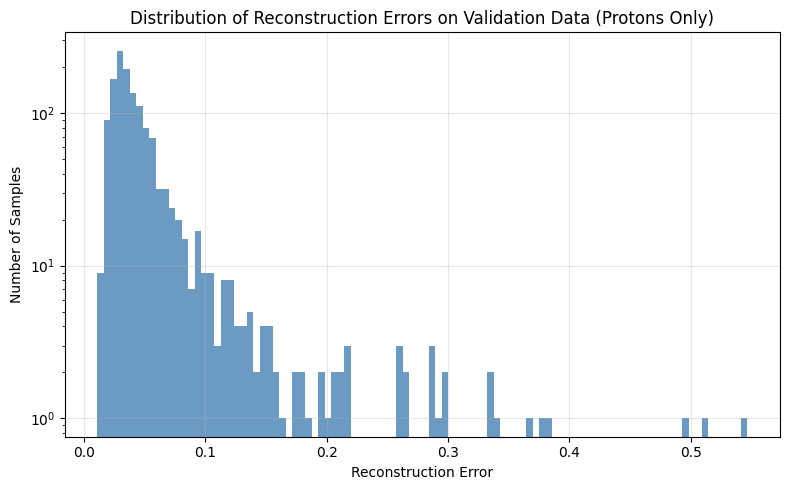

In [31]:
model.eval()

device_inf = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Inference device:", device_inf)

model.to(device_inf)

X_nval = torch.stack([val_subset[i] for i in range(len(val_subset))]).cpu().numpy()        # (N, H, W)
N, C, H, W = X_nval.shape

batch_size = 8   
recon_all_val = np.empty((N, C, H, W), dtype=np.float32)

latent_dim = model.fc_mu.out_features
latent_vectors_val = np.empty((N, latent_dim), dtype=np.float32)

with torch.no_grad():
    for i in range(0, N, batch_size):
        j = min(i + batch_size, N)
        xb_np = X_nval[i:j]                                 # (b, H, W)
        xb = torch.tensor(xb_np, dtype=torch.float32).to(device_inf)

        recon, mu, logvar, z = model(xb)
        recon_all_val[i:j] = recon.cpu().numpy()
        latent_vectors_val[i:j] = mu.cpu().numpy()

        if device_inf.type == "mps":
            try:
                torch.mps.empty_cache()
            except Exception:
                pass

# per-sample MSE (RE) 
mse_per_pixel = (recon_all_val - X_nval) ** 2
RE_per_sample_val = mse_per_pixel.mean(axis=(1, 2, 3))        # (N,)

print("recon_all.shape:", recon_all_val.shape)
print("latent_vectors.shape:", latent_vectors_val.shape)
print("RE_per_sample.shape:", RE_per_sample_val.shape)

plt.figure(figsize=(8, 5))
plt.hist(RE_per_sample_val, bins=100, color='steelblue', alpha=0.8)
plt.xlabel("Reconstruction Error")
plt.ylabel("Number of Samples")
plt.title("Distribution of Reconstruction Errors on Validation Data (Protons Only)")
plt.grid(True, alpha=0.3)
plt.yscale('log')
# plt.xlim(0, 300)
plt.tight_layout()
plt.show()

recon_all_k.shape: (1100, 2, 48, 48)
latent_vectors.shape: (1100, 4)
RE_per_sample_k.shape: (1100,)


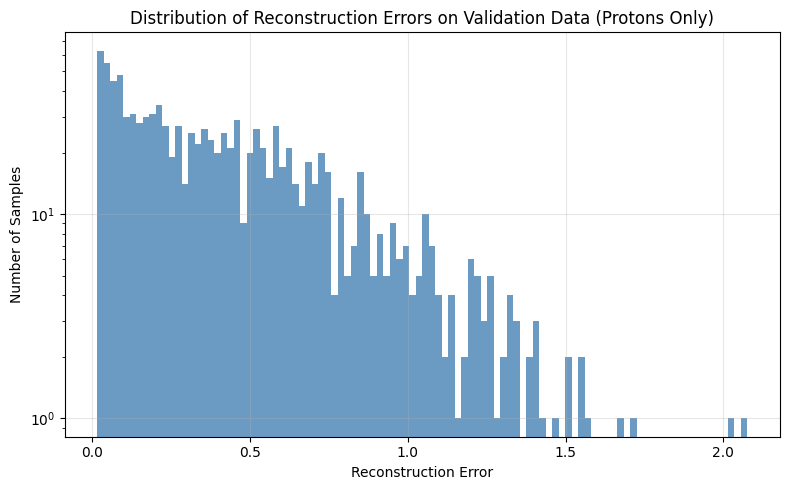

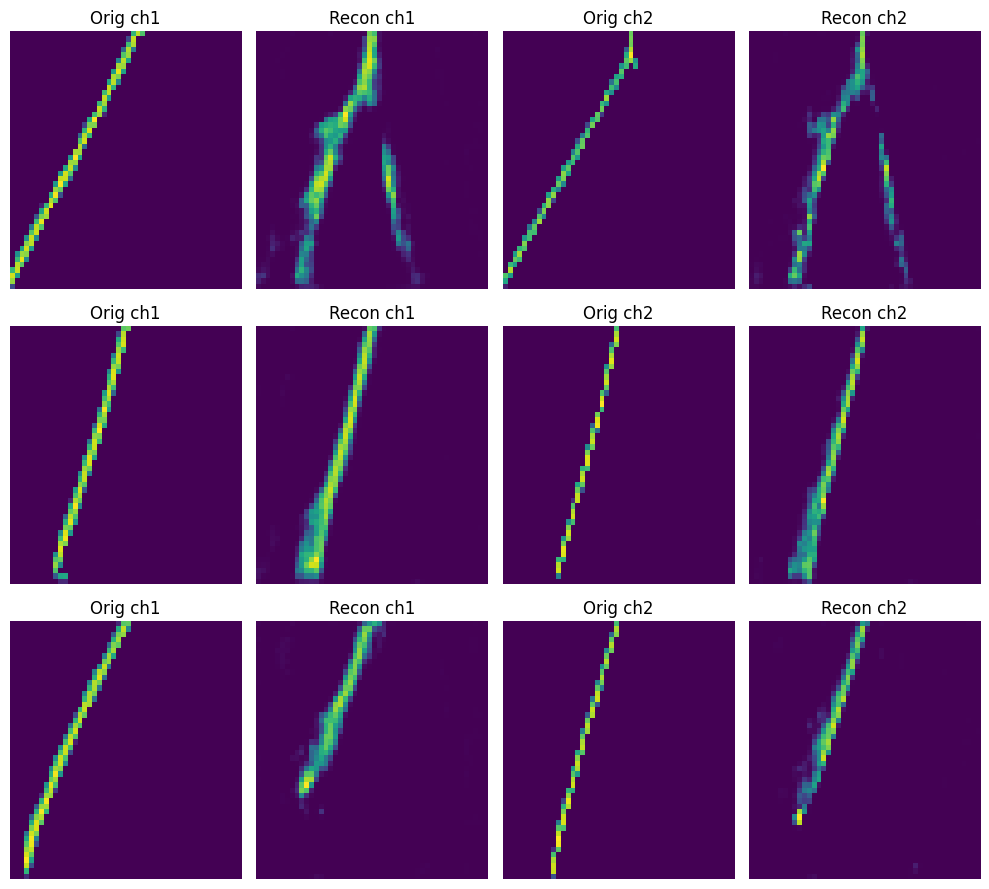

In [32]:
device_inf = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
model.eval()
model.to(device_inf)

Xk_np = k.cpu().numpy() if torch.is_tensor(k) else np.array(k, dtype=np.float32)          # (N, H, W)
N, C, H, W = Xk_np.shape
batch_size = 8                           # lower if OOM on MPS

recon_all_k = np.empty((N, C, H, W), dtype=np.float32)
latent_dim = model.fc_mu.out_features
latent_vectors_k = np.empty((N, latent_dim), dtype=np.float32)

with torch.no_grad():
    for i in range(0, N, batch_size):
        j = min(i + batch_size, N)
        xb = torch.tensor(Xk_np[i:j], dtype=torch.float32).to(device_inf)  # (b,H,W)

        recon, mu, logvar, z = model(xb)
        recon_all_k[i:j] = recon.cpu().numpy()
        latent_vectors_k[i:j] = mu.cpu().numpy()

        if device_inf.type == "mps":
            try:
                torch.mps.empty_cache()
            except Exception:
                pass

RE_per_sample_k = ((recon_all_k - Xk_np) ** 2).mean(axis=(1, 2, 3))

print("recon_all_k.shape:", recon_all_k.shape)
print("latent_vectors.shape:", latent_vectors_k.shape)
print("RE_per_sample_k.shape:", RE_per_sample_k.shape)

plt.figure(figsize=(8, 5))
plt.hist(RE_per_sample_k, bins=100, color='steelblue', alpha=0.8)
plt.xlabel("Reconstruction Error")
plt.ylabel("Number of Samples")
plt.title("Distribution of Reconstruction Errors on Validation Data (Protons Only)")
plt.grid(True, alpha=0.3)
plt.yscale('log')
# plt.xlim(0, 300)
plt.tight_layout()
plt.show()

l = min(3, N)  # number of samples to show
fig, axs = plt.subplots(l, 4, figsize=(10, 3*l))  # 2 channels × (orig,recon)

for ii in range(l):
    for c in range(2):
        axs[ii, 2*c].imshow(Xk_np[ii, c], cmap='viridis', aspect='auto')
        axs[ii, 2*c].set_title(f"Orig ch{c+1}")
        axs[ii, 2*c].axis('off')

        axs[ii, 2*c+1].imshow(recon_all_k[ii, c], cmap='viridis', aspect='auto')
        axs[ii, 2*c+1].set_title(f"Recon ch{c+1}")
        axs[ii, 2*c+1].axis('off')

plt.tight_layout()
plt.show()


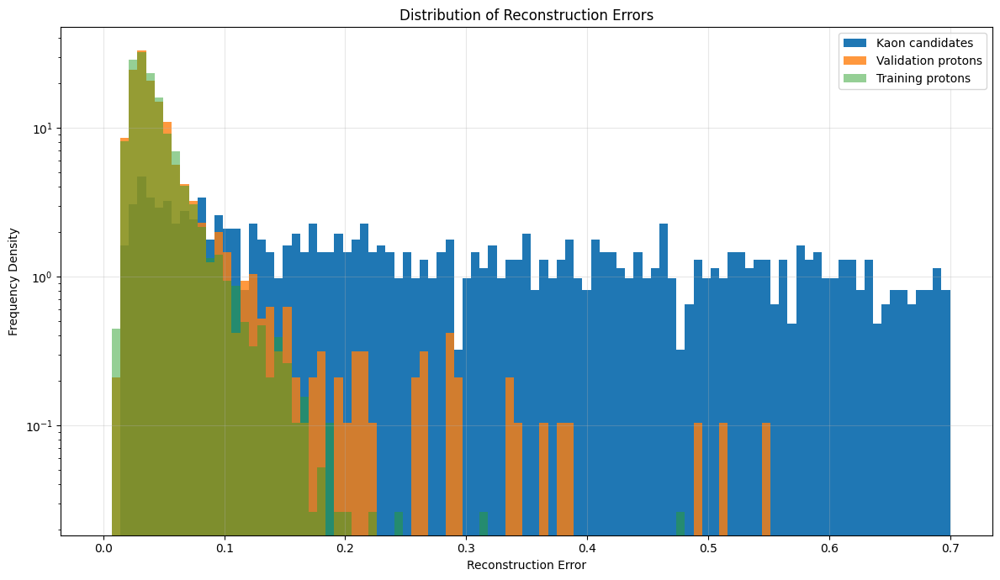

In [33]:
plt.figure(figsize=(12, 7))

bins = np.linspace(0, 0.7, 100)

plt.hist(RE_per_sample_k, bins=bins, alpha=1, label='Kaon candidates', density=True)
plt.hist(RE_per_sample_val, bins=bins, alpha=0.8, label='Validation protons', density=True)
plt.hist(RE_per_sample, bins=bins, alpha=0.5, label='Training protons', density=True)

plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency Density")
plt.title("Distribution of Reconstruction Errors")
plt.grid(True, alpha=0.3)
plt.yscale('log')
# plt.xlim(0, 300)
plt.legend()
plt.tight_layout()
# plt.savefig('RE.png', dpi=1000)
plt.show()

In [34]:
from sklearn.manifold import TSNE

Z_all = np.concatenate([latent_vectors, latent_vectors_k, latent_vectors_val], axis=0)
labels = np.concatenate([
    np.zeros(len(latent_vectors)),          # 0 = protons
    np.ones(len(latent_vectors_k)),         # 1 = kaons
    np.full(len(latent_vectors_val), 2)     # 2 = validation
])

tsne = TSNE(
    n_components=2,
    perplexity=50,
    learning_rate=50,
    max_iter=2000,
    init='random',
    random_state=42
)
Z_2d = tsne.fit_transform(Z_all)

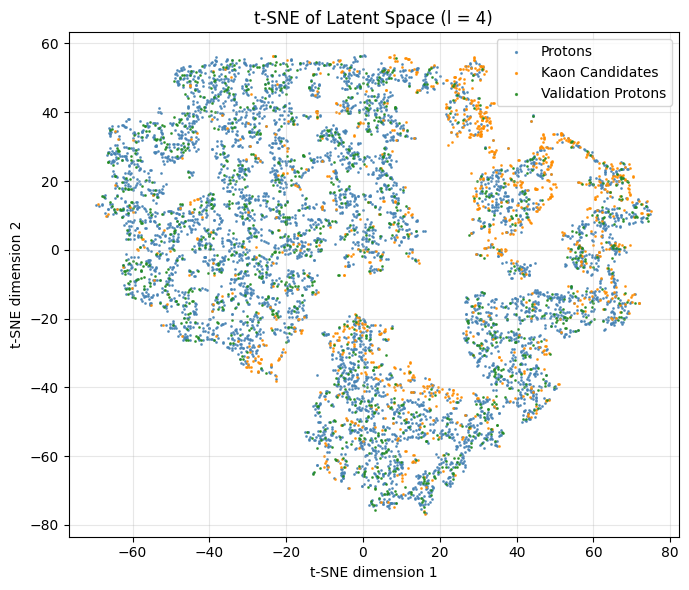

In [35]:
plt.figure(figsize=(7, 6))
colours = ['steelblue', 'darkorange', 'forestgreen']
labels_text = ['Protons', 'Kaon Candidates', 'Validation Protons']

for i, (colour, label_name) in enumerate(zip(colours, labels_text)):
    plt.scatter(Z_2d[labels == i, 0],
                Z_2d[labels == i, 1],
                color=colour,
                alpha=0.8,
                s=1,
                label=label_name)

plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.legend(markerscale=1.3)
plt.title("t-SNE of Latent Space (l = 4)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

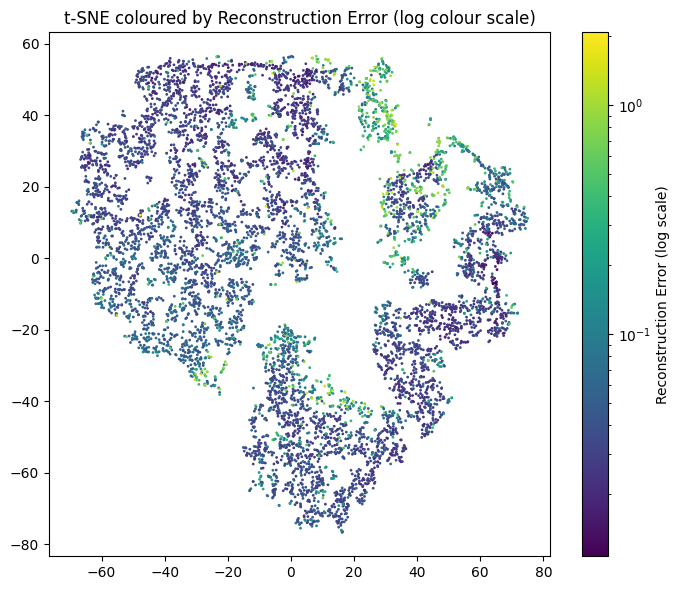

In [36]:
import matplotlib.colors as mcolors

Z_all = np.concatenate([latent_vectors, latent_vectors_k, latent_vectors_val])
RE_all = np.concatenate([RE_per_sample, RE_per_sample_k, RE_per_sample_val])

plt.figure(figsize=(7,6))
sc = plt.scatter(Z_2d[:, 0], Z_2d[:, 1],
                 c=RE_all,
                 cmap='viridis',
                 norm=mcolors.LogNorm(vmin=RE_all.min()+1e-8, vmax=RE_all.max()),
                 s=1)
plt.colorbar(sc, label='Reconstruction Error (log scale)')
plt.title("t-SNE coloured by Reconstruction Error (log colour scale)")
plt.tight_layout()
plt.show()

In [37]:
import umap
reducer = umap.UMAP(n_neighbors=30, min_dist=0.1)
Z_umap = reducer.fit_transform(Z_all)

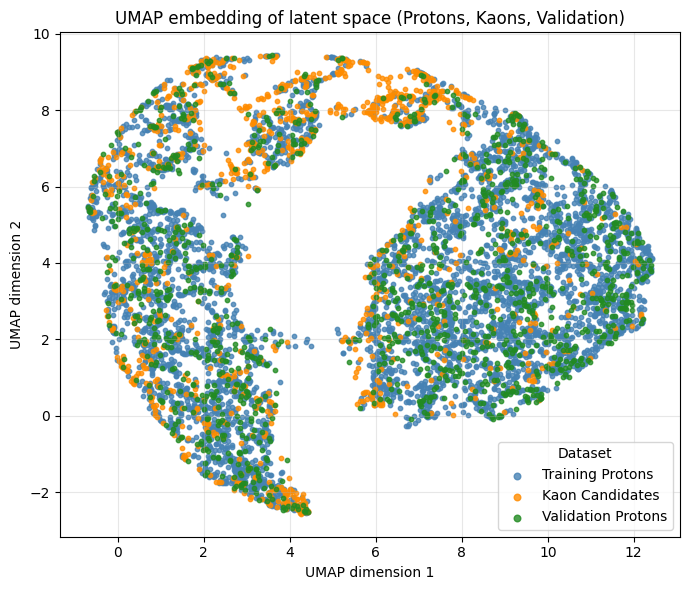

In [38]:
# labels: 0=Protons, 1=Kaons, 2=Validation
palette = ['steelblue', 'darkorange', 'forestgreen']  # order matches labels

plt.figure(figsize=(7,6))
for i, name in enumerate(['Training Protons', 'Kaon Candidates', 'Validation Protons']):
    m = (labels == i)
    plt.scatter(Z_umap[m, 0], Z_umap[m, 1],
                color=palette[i], s=10, alpha=0.8, label=name)

plt.xlabel("UMAP dimension 1")
plt.ylabel("UMAP dimension 2")
plt.title("UMAP embedding of latent space (Protons, Kaons, Validation)")
plt.legend(title="Dataset", markerscale=1.5)
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.savefig('UMAP.png', dpi=1000)
plt.show()

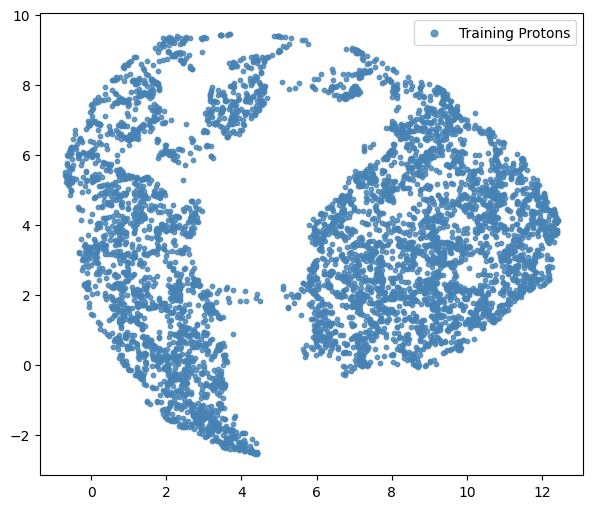

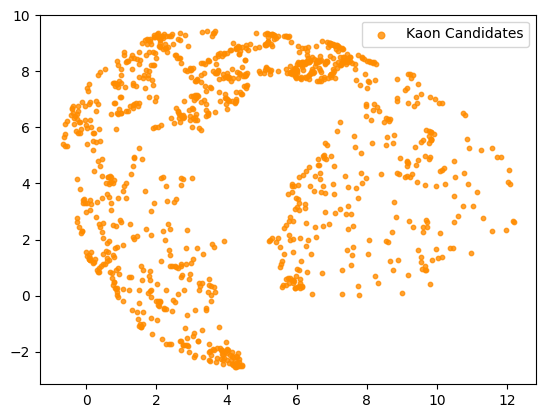

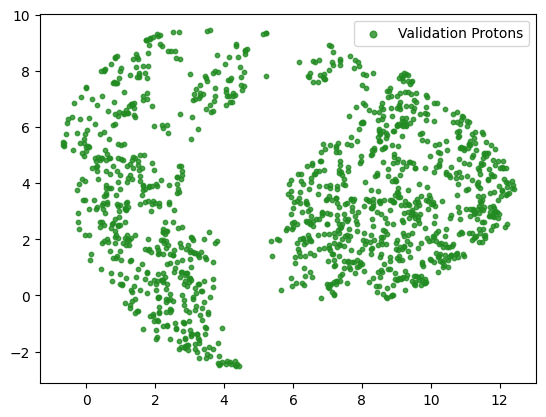

In [39]:
# labels: 0=Protons, 1=Kaons, 2=Validation
palette = ['steelblue', 'darkorange', 'forestgreen']  # order matches labels

plt.figure(figsize=(7,6))
for i, name in enumerate(['Training Protons', 'Kaon Candidates', 'Validation Protons']):
    m = (labels == i)
    plt.scatter(Z_umap[m, 0], Z_umap[m, 1],
                color=palette[i], s=10, alpha=0.8, label=name)
    plt.legend(markerscale=1.5)
    # plt.xlim(-5, 14)
    # plt.ylim(0, 10)
    plt.show()

# plt.xlabel("UMAP dimension 1")
# plt.ylabel("UMAP dimension 2")
# plt.title("UMAP embedding of latent space (Protons, Kaons, Validation)")
# plt.legend(title="Dataset", markerscale=1.5)
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()


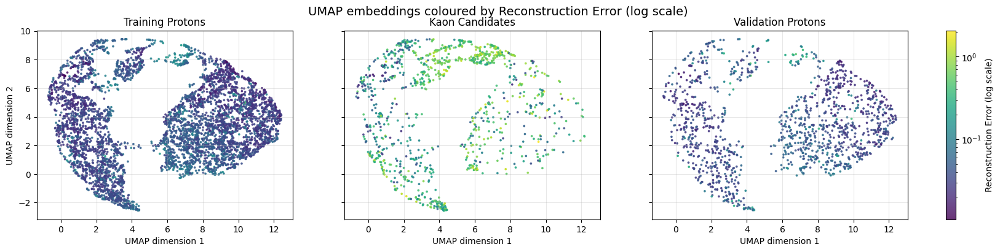

In [40]:
palette = ['steelblue', 'darkorange', 'forestgreen']
names = ['Training Protons', 'Kaon Candidates', 'Validation Protons']

norm = mcolors.LogNorm(vmin=RE_all.min() + 1e-8, vmax=RE_all.max())
cmap = plt.cm.viridis

fig, axes = plt.subplots(1, 3, figsize=(20, 4), sharex=True, sharey=True)

for i, ax in enumerate(axes):
    m = (labels == i)
    sc = ax.scatter(
        Z_umap[m, 0],
        Z_umap[m, 1],
        c=RE_all[m],
        cmap=cmap,
        norm=norm,
        s=3,
        alpha=0.8
    )
    ax.set_title(names[i], fontsize=12)
    ax.set_xlabel("UMAP dimension 1")
    if i == 0:
        ax.set_ylabel("UMAP dimension 2")
    ax.grid(True, alpha=0.3)

cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), fraction=0.046, pad=0.04)
cbar.set_label('Reconstruction Error (log scale)')

fig.suptitle("UMAP embeddings coloured by Reconstruction Error (log scale)", fontsize=14)

# plt.savefig('UMAPandRE.png', dpi=1000)
plt.show()


In [41]:
latent_vectors.shape, latent_vectors_val.shape, latent_vectors_k.shape

((5421, 4), (1356, 4), (1100, 4))

In [42]:
latent = np.concatenate([latent_vectors, latent_vectors_val])

Kaon subset shape: (1100, 2)


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


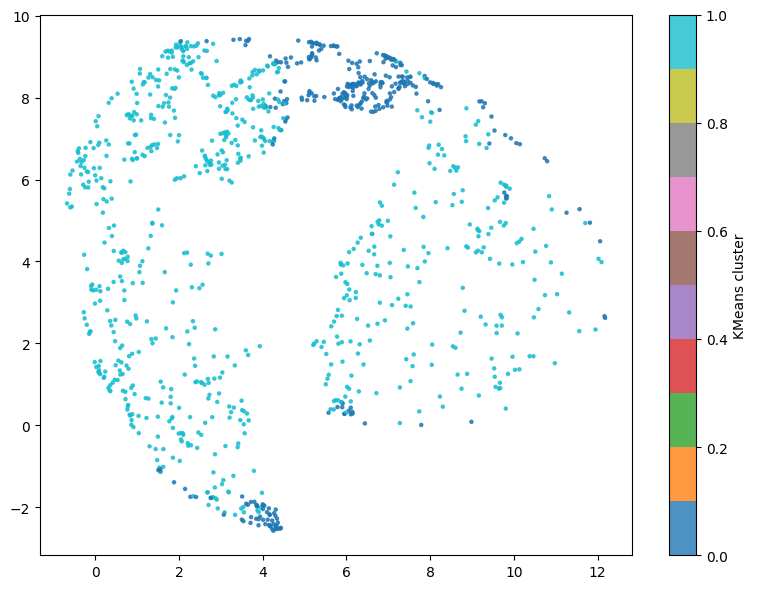

In [43]:
from sklearn.cluster import KMeans

Z_all = np.concatenate([latent_vectors, latent_vectors_k, latent_vectors_val], axis=0)
labels = np.concatenate([
    np.zeros(len(latent_vectors)),          # 0 = protons
    np.ones(len(latent_vectors_k)),         # 1 = kaon
    np.full(len(latent_vectors_val), 2)     # 2 = validation
])

mask = (labels == 1)
Z_d = Z_all[mask]          # latent vectors
E_d = Z_umap[mask]      # 3D UMAP coordinates

print(f"Kaon subset shape: {E_d.shape}")

kmeans = KMeans(n_clusters=2, random_state=42) #6
labels_km = kmeans.fit_predict(Z_d)

fig = plt.figure(figsize=(8, 6))
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                c=labels_km, cmap='tab10', s=5, alpha=0.8)
plt.colorbar(label='KMeans cluster')
ax.set_title("Kaon candidates — KMeans clusters")
ax.set_xlabel("UMAP dim 1")
ax.set_ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('Kmeans.png', dpi=1000)
plt.show()


In [44]:
p_m = col[col['particle_type'] == 'proton']['beamline_mass'].values
k_m = col[col['particle_type'] == 'kaon']['beamline_mass'].values

k_l = col[col['particle_type'] == 'kaon']['height'].values
k_p = col[col['particle_type'] == 'kaon']['p'].values

labels = labels_km

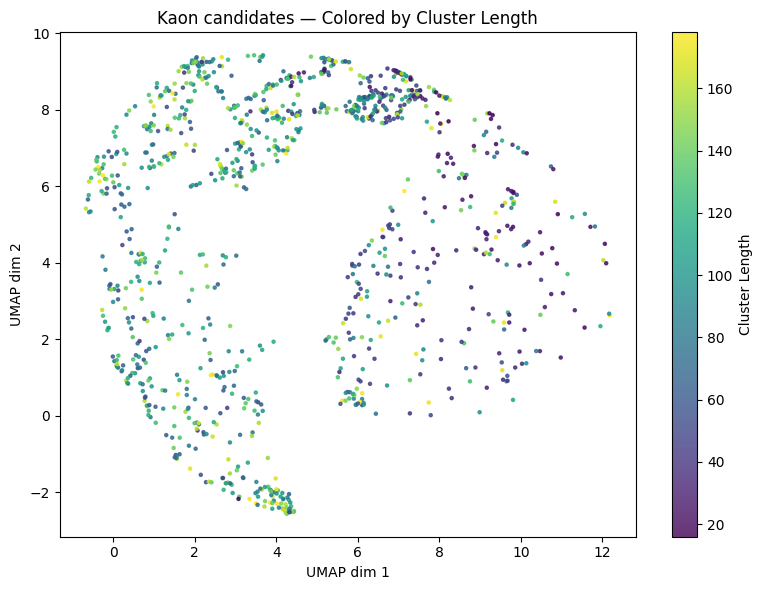

In [45]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                 c=k_l, cmap='viridis', s=5, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("Cluster Length")

plt.title("Kaon candidates — Colored by Cluster Length")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('length.png', dpi=1000)
plt.show()

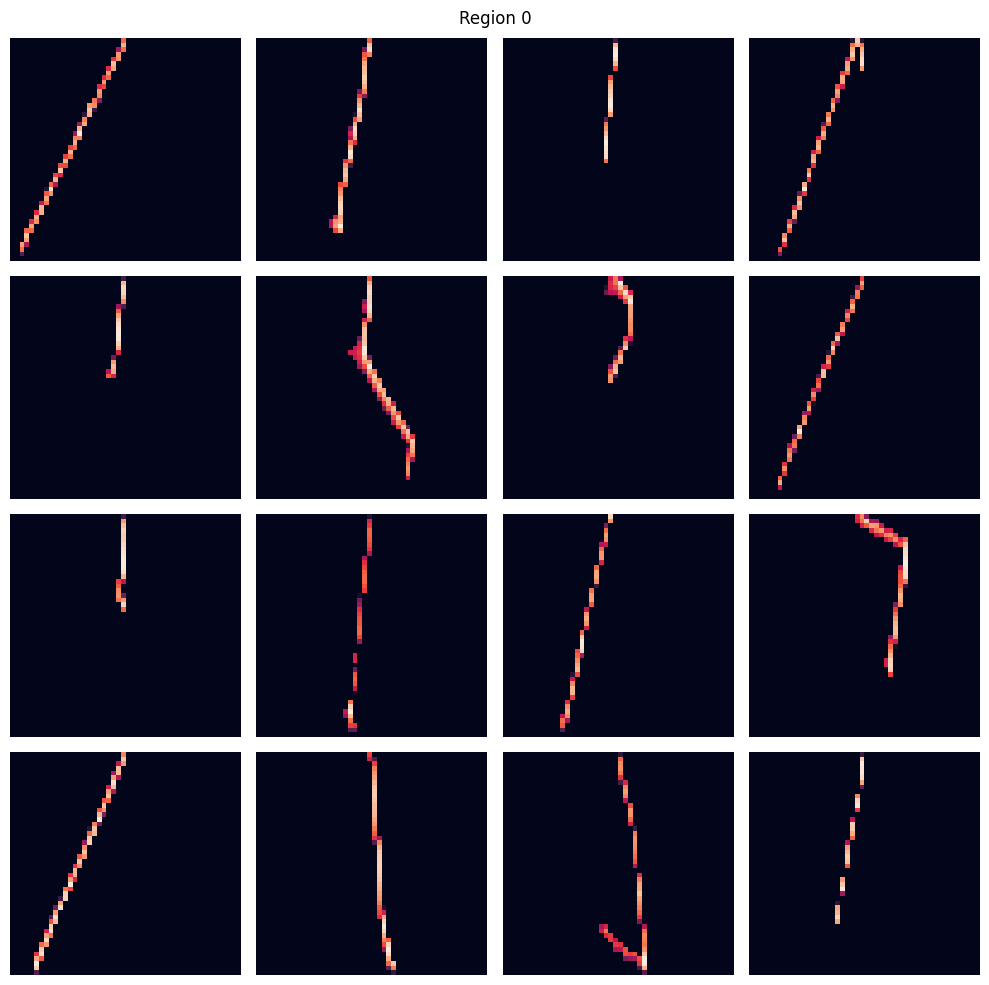

In [46]:
num_images = 16  # Number of images to display
grid_size = int(np.ceil(np.sqrt(num_images)))  # Grid dimensions (grid_size x grid_size)

# Filter the original images for the selected cluster
cluster_id = 0 # Change this to the desired cluster ID
cluster_mask = (labels_km == cluster_id)
cluster_indices = np.where(cluster_mask)[0]

# Randomly select up to `num_images` images from the cluster
if len(cluster_indices) > num_images:
    selected_indices = np.random.choice(cluster_indices, size=num_images, replace=False)
else:
    selected_indices = cluster_indices

selected_images = k[selected_indices]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 1], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
    else:
        ax.axis('off')  # Turn off unused subplots

fig.suptitle(f'Region {cluster_id}')
plt.tight_layout()
plt.show()

In [47]:
RE_all = np.concatenate([RE_per_sample, RE_per_sample_k, RE_per_sample_val])

RE_X = np.concatenate([RE_per_sample])
RE_Y = RE_per_sample_k
RE_Z = RE_per_sample_val

Density map

In [48]:
from sklearn.neighbors import NearestNeighbors
from scipy.special import gammaln

In [49]:
k.shape

torch.Size([1100, 2, 48, 48])

In [50]:
latent = np.concatenate([latent_vectors])

X = np.asarray(latent)              # reference = protons
Y = np.asarray(latent_vectors_k)            # query = kaons
Z = np.asarray(latent_vectors_val)          # query = unseen protons

N, d = X.shape

n = 20

kNN = NearestNeighbors(n_neighbors=n+1, algorithm='auto')
kNN.fit(X)

distancesX, _ = kNN.kneighbors(X, n_neighbors=n+1)
rkX = distancesX[:, -1]

log_Vd = (d / 2) * np.log(np.pi) - gammaln(d / 2 + 1)                  # volume of ball (log for numerical stability) - standard equation for d dimension ball

log_pX = np.log(n) - np.log(N) - log_Vd - d * np.log(rkX + 1e-12)

distances, _ = kNN.kneighbors(Y, n_neighbors=n)
rk = distances[:, -1]

log_Vd = (d / 2) * np.log(np.pi) - gammaln(d / 2 + 1)                  # volume of ball (log for numerical stability) - standard equation for d dimension ball

log_pY = np.log(n) - np.log(N) - log_Vd - d * np.log(rk + 1e-12)

distances, _ = kNN.kneighbors(Z, n_neighbors=n)
rk = distances[:, -1]

log_Vd = (d / 2) * np.log(np.pi) - gammaln(d / 2 + 1)                  # volume of ball (log for numerical stability) - standard equation for d dimension ball

log_pZ = np.log(n) - np.log(N) - log_Vd - d * np.log(rk + 1e-12)

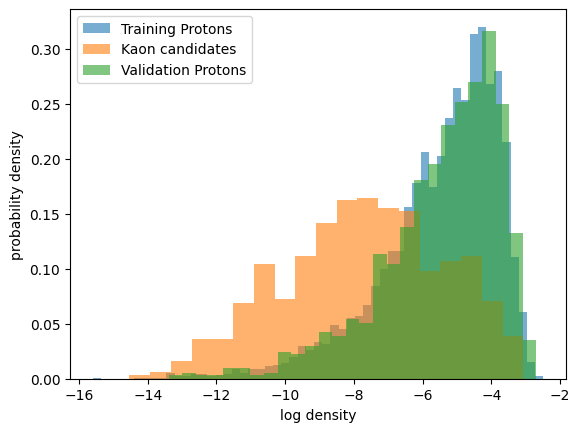

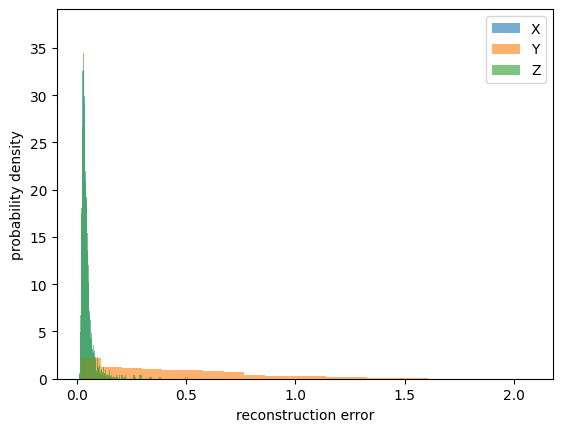

In [51]:
log_pX = np.asarray(log_pX); log_pY = np.asarray(log_pY); log_pZ = np.asarray(log_pZ)
RE_X   = np.asarray(RE_X);   RE_Y   = np.asarray(RE_Y);   RE_Z   = np.asarray(RE_Z)

# log density
plt.figure()
plt.hist(log_pX, bins='auto', density=True, alpha=0.6, label="Training Protons")
plt.hist(log_pY, bins='auto', density=True, alpha=0.6, label="Kaon candidates")
plt.hist(log_pZ, bins='auto', density=True, alpha=0.6, label="Validation Protons")
plt.xlabel("log density")
plt.ylabel("probability density")
plt.legend()
plt.show()

# reconstruction error
plt.figure()
plt.hist(RE_X, bins='auto', density=True, alpha=0.6, label="X")
plt.hist(RE_Y, bins='auto', density=True, alpha=0.6, label="Y")
plt.hist(RE_Z, bins='auto', density=True, alpha=0.6, label="Z")
plt.xlabel("reconstruction error")
plt.ylabel("probability density")
plt.legend()
plt.show()

Correlation between log_pY and kaon height: -0.1125


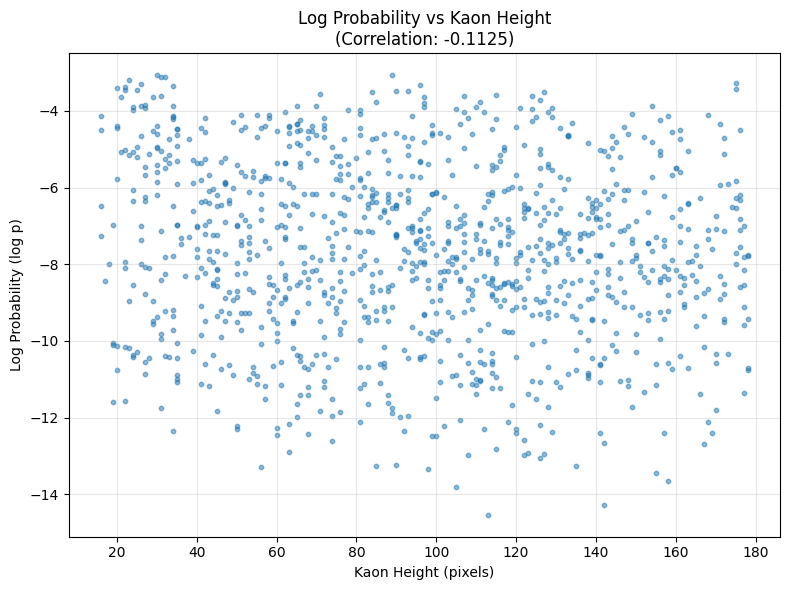

In [52]:
# Extract kaon heights and compute correlation with log probability
kaon_heights = col[col['particle_type'] == 'kaon']['height'].reset_index(drop=True).values

# Compute Pearson correlation coefficient
correlation = np.corrcoef(log_pY, kaon_heights)[0, 1]

print(f"Correlation between log_pY and kaon height: {correlation:.4f}")

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(kaon_heights, log_pY, alpha=0.5, s=10)
plt.xlabel("Kaon Height (pixels)")
plt.ylabel("Log Probability (log p)")
plt.title(f"Log Probability vs Kaon Height\n(Correlation: {correlation:.4f})")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

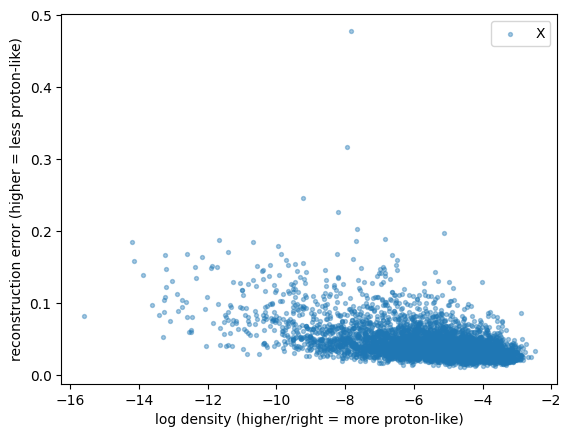

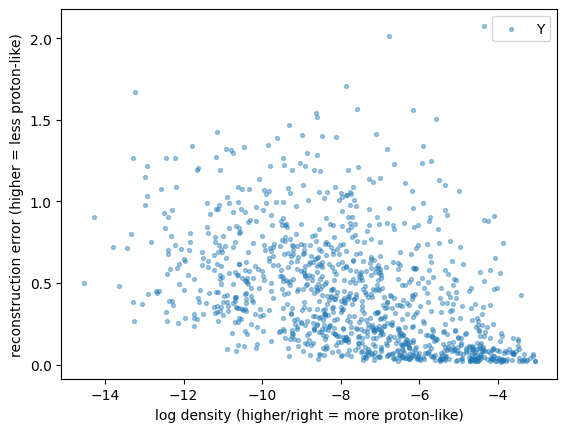

In [53]:
plt.figure()
plt.scatter(log_pX, RE_X, s=8, alpha=0.4, label="X")
plt.xlabel("log density (higher/right = more proton-like)")
plt.ylabel("reconstruction error (higher = less proton-like)")
plt.legend()
plt.show()

plt.figure()
plt.scatter(log_pY, RE_Y, s=8, alpha=0.4, label="Y")
plt.xlabel("log density (higher/right = more proton-like)")
plt.ylabel("reconstruction error (higher = less proton-like)")
plt.legend()
plt.show()

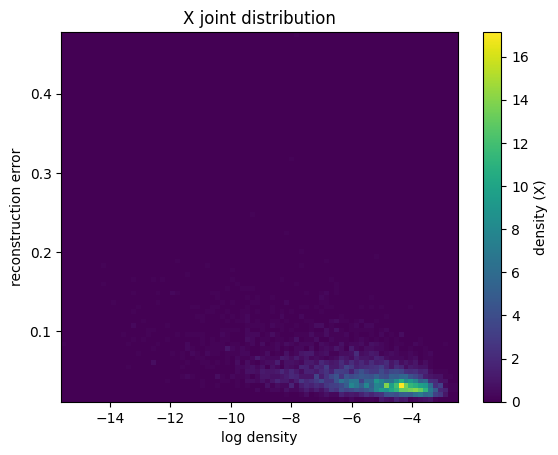

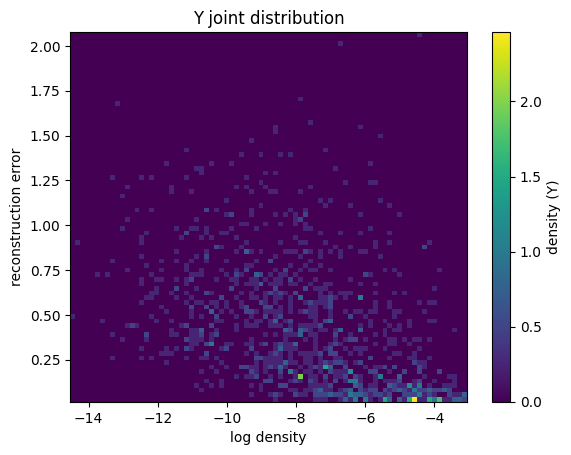

In [54]:
plt.figure()
plt.hist2d(log_pX, RE_X, bins=80, density=True)
plt.xlabel("log density")
plt.ylabel("reconstruction error")
plt.colorbar(label="density (X)")
plt.title("X joint distribution")
# plt.xlim(-48, -28)
plt.show()

plt.figure()
plt.hist2d(log_pY, RE_Y, bins=80, density=True)
plt.xlabel("log density")
plt.ylabel("reconstruction error")
plt.colorbar(label="density (Y)")
plt.title("Y joint distribution")
# plt.xlim(-50.5, -29.5)
plt.show()

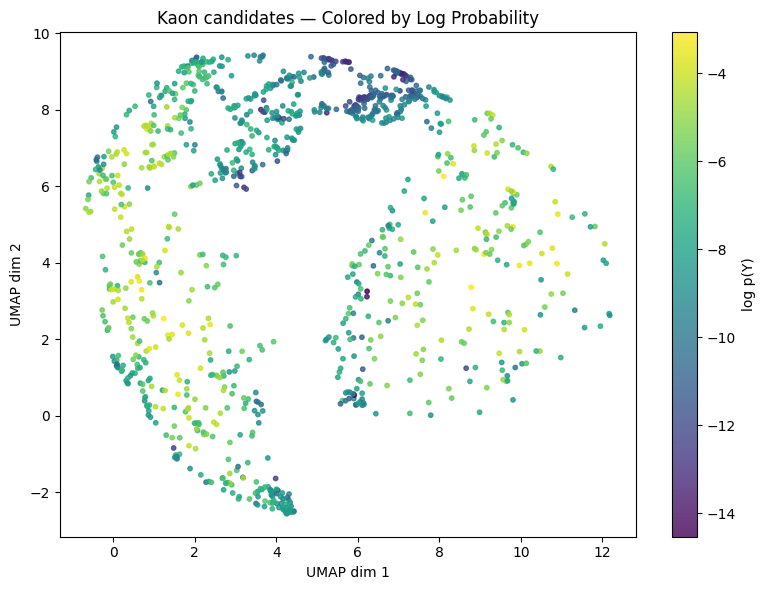

In [55]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                 c=log_pY, cmap='viridis', s=10, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("log p(Y)")

plt.title("Kaon candidates — Colored by Log Probability")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('length.png', dpi=1000)
plt.show()

In [56]:
x = np.asarray(log_pX)  # protons
y = np.asarray(log_pY)  # kaons

# candidate thresholds = all unique values (or use quantiles for speed)
ts = np.unique(np.concatenate([x, y]))

best = None
for t in ts:
    FPR = np.mean(x < t)   # protons flagged as kaon
    TPR = np.mean(y < t)   # kaons correctly flagged
    J = TPR - FPR
    if best is None or J > best[0]:
        best = (J, t, TPR, FPR)

J, t_star, TPR_star, FPR_star = best
print("Best J threshold:", t_star, "TPR:", TPR_star, "FPR:", FPR_star)

Best J threshold: -6.404653803856308 TPR: 0.6945454545454546 FPR: 0.2425751706327246


In [57]:
kaons = col[col['particle_type'] == 'kaon'].reset_index(drop=True)
protons = col[col['particle_type'] == 'proton'].reset_index(drop=True)

764


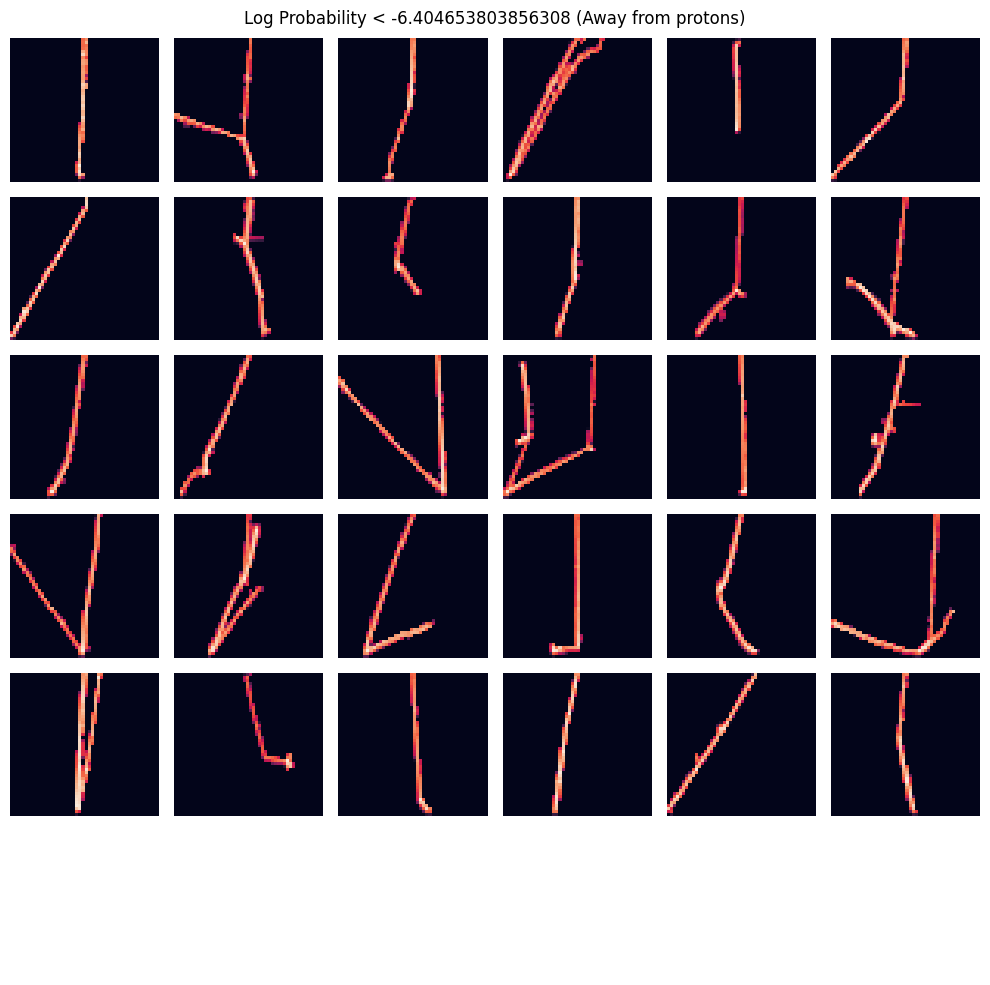

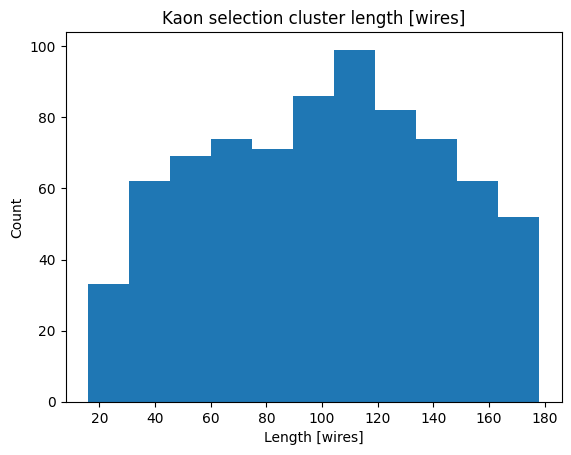

In [58]:
indices = np.where(log_pY < t_star)
print(len(indices[0]))

num_images = 30  
grid_size = int(np.ceil(np.sqrt(num_images)))  

if len(indices[0]) > num_images:
    selected_indices = np.random.choice(indices[0], size=num_images, replace=False)
else:
    selected_indices = indices

selected_images = k[selected_indices]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 0], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
    else:
        ax.axis('off')  

fig.suptitle(f'Log Probability < {t_star} (Away from protons)')
plt.tight_layout()
plt.show()

plt.hist(kaons['height'].iloc[indices], bins='auto')
plt.title('Kaon selection cluster length [wires]')
plt.xlabel('Length [wires]'); plt.ylabel('Count')
plt.show()

336


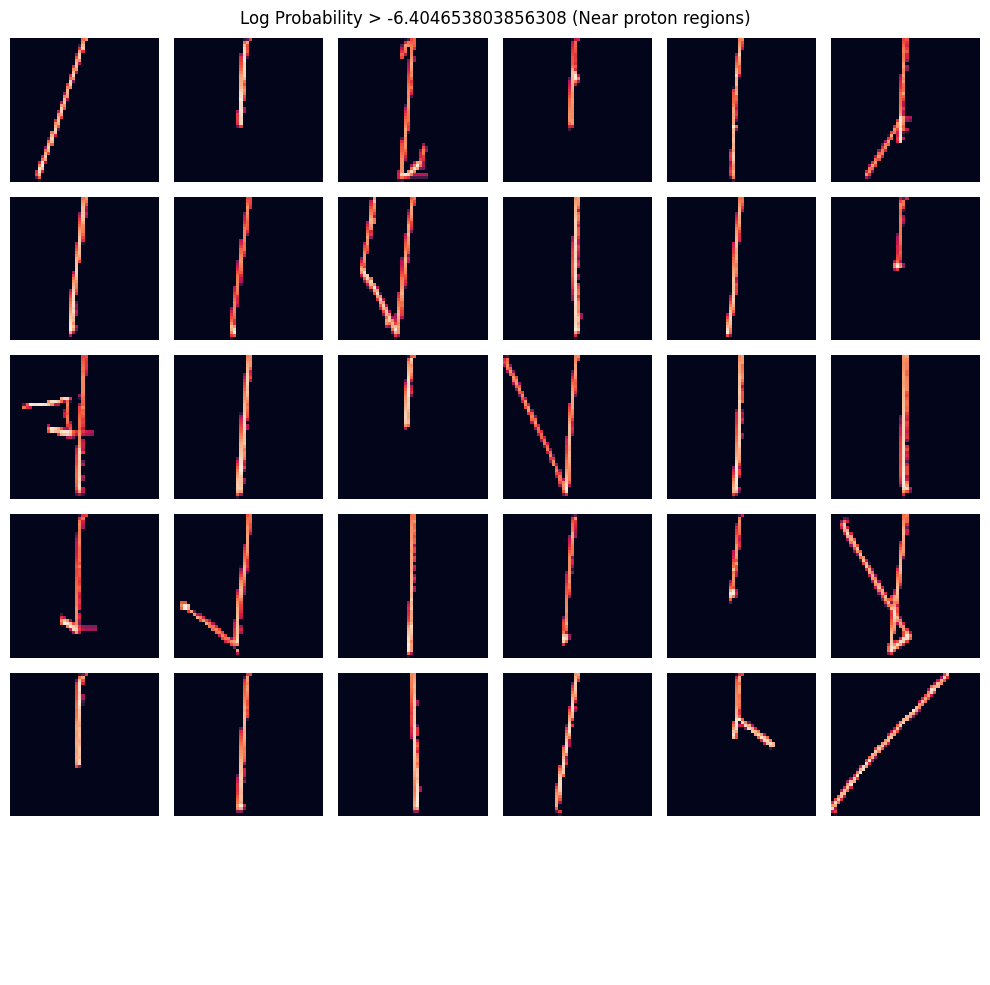

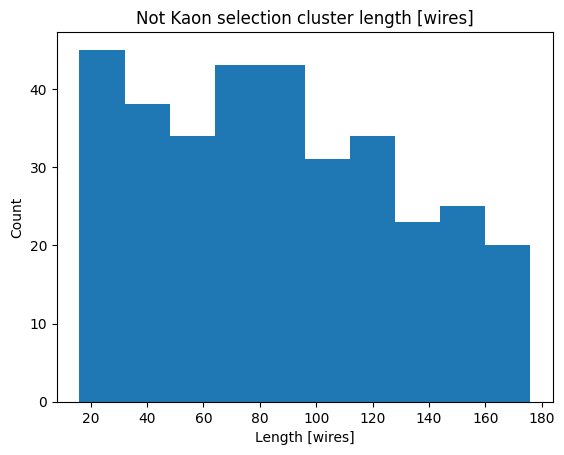

In [59]:
indices = np.where(log_pY > t_star)
print(len(indices[0]))

num_images = 30  
grid_size = int(np.ceil(np.sqrt(num_images)))  

if len(indices[0]) > num_images:
    selected_indices = np.random.choice(indices[0], size=num_images, replace=False)
else:
    selected_indices = indices

selected_images = k[selected_indices]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 0], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
    else:
        ax.axis('off')  

fig.suptitle(f'Log Probability > {t_star} (Near proton regions)')
plt.tight_layout()
plt.show()

plt.hist(kaons['height'].iloc[indices], bins='auto')
plt.title('Not Kaon selection cluster length [wires]')
plt.xlabel('Length [wires]'); plt.ylabel('Count')
plt.show()

1315


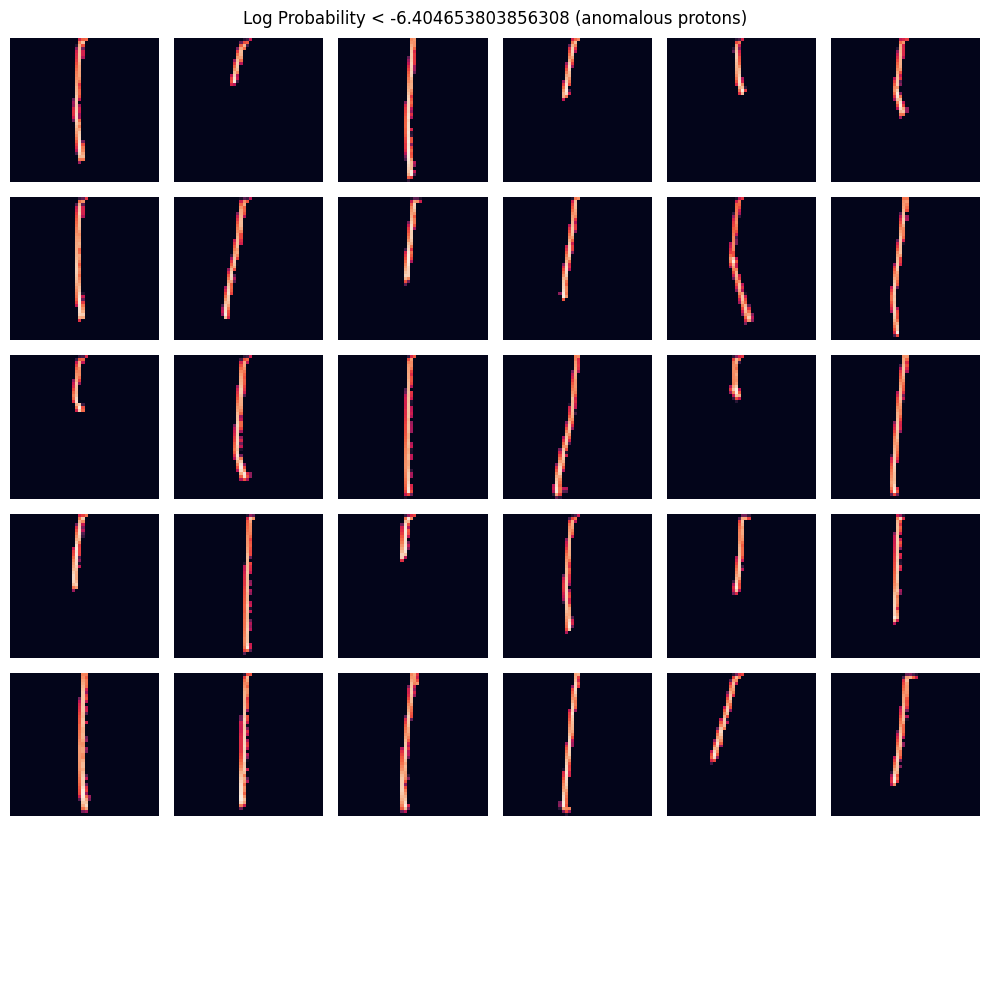

(array([205., 193., 196., 102., 111.,  95.,  69.,  70.,  53.,  50.,  20.,
         35.,  30.,  15.,  14.,  12.,  15.,   7.,   5.,   6.,   2.,   3.,
          5.,   2.]),
 array([ 16.        ,  22.70833333,  29.41666667,  36.125     ,
         42.83333333,  49.54166667,  56.25      ,  62.95833333,
         69.66666667,  76.375     ,  83.08333333,  89.79166667,
         96.5       , 103.20833333, 109.91666667, 116.625     ,
        123.33333333, 130.04166667, 136.75      , 143.45833333,
        150.16666667, 156.875     , 163.58333333, 170.29166667,
        177.        ]),
 <BarContainer object of 24 artists>)

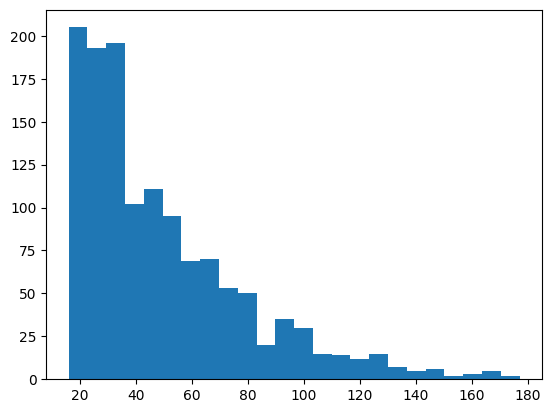

In [60]:
indices = np.where(log_pX < t_star)
print(len(indices[0]))

num_images = 30  
grid_size = int(np.ceil(np.sqrt(num_images)))  

if len(indices[0]) > num_images:
    selected_indices = np.random.choice(indices[0], size=num_images, replace=False)
else:
    selected_indices = indices

selected_images = train_subset[selected_indices]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 0], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
    else:
        ax.axis('off')  

fig.suptitle(f'Log Probability < {t_star} (anomalous protons)')
plt.tight_layout()
plt.show()

plt.hist(protons['height'].iloc[indices], bins='auto')

4105


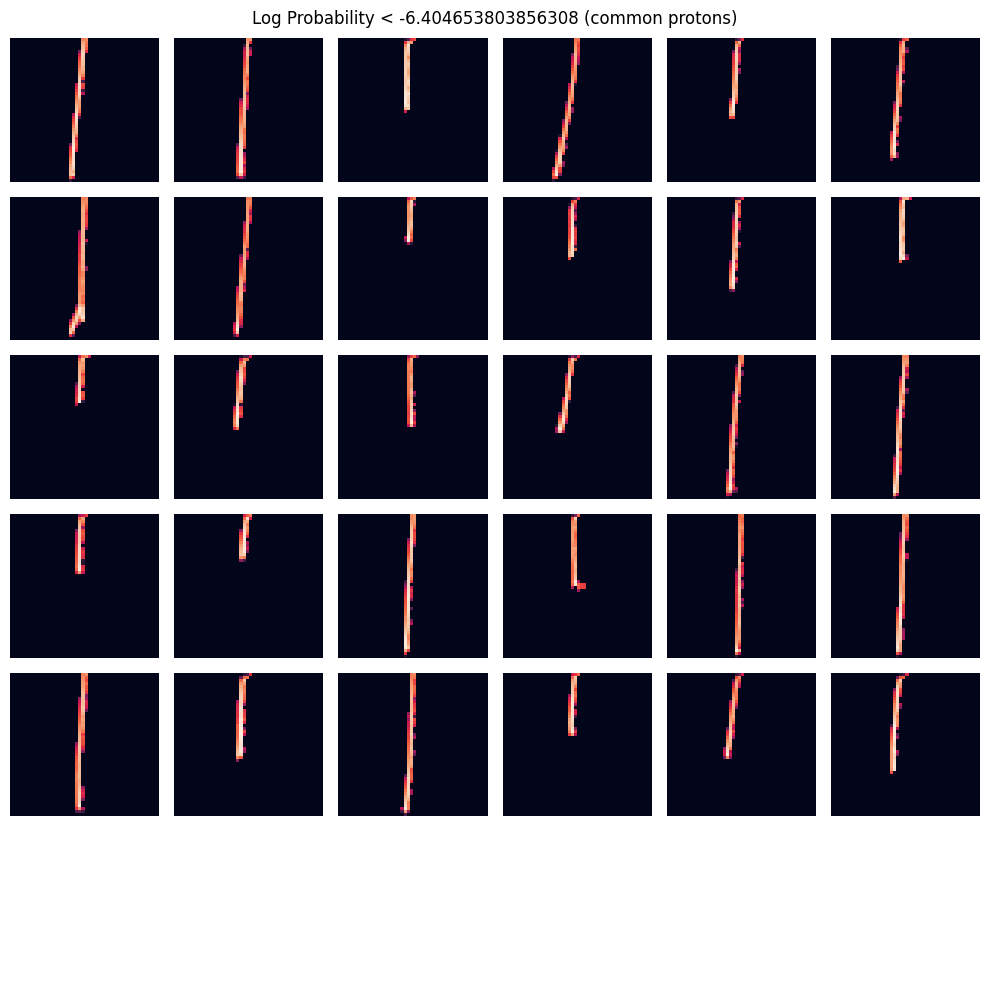

(array([366., 388., 448., 350., 289., 273., 314., 188., 171., 183., 117.,
        152., 104., 120.,  88., 101.,  59.,  54.,  48.,  31.,  42.,  26.,
         38.,  12.,  23.,  26.,  23.,  14.,  10.,  12.,  10.,   9.,   7.,
          2.,   4.,   3.]),
 array([ 16.        ,  20.44444444,  24.88888889,  29.33333333,
         33.77777778,  38.22222222,  42.66666667,  47.11111111,
         51.55555556,  56.        ,  60.44444444,  64.88888889,
         69.33333333,  73.77777778,  78.22222222,  82.66666667,
         87.11111111,  91.55555556,  96.        , 100.44444444,
        104.88888889, 109.33333333, 113.77777778, 118.22222222,
        122.66666667, 127.11111111, 131.55555556, 136.        ,
        140.44444444, 144.88888889, 149.33333333, 153.77777778,
        158.22222222, 162.66666667, 167.11111111, 171.55555556,
        176.        ]),
 <BarContainer object of 36 artists>)

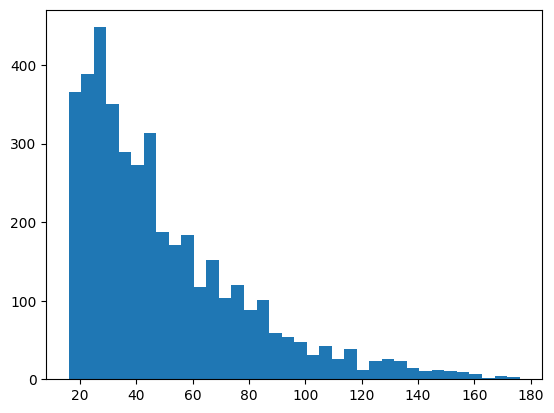

In [61]:
indices = np.where(log_pX > t_star)
print(len(indices[0]))

num_images = 30  
grid_size = int(np.ceil(np.sqrt(num_images)))  

if len(indices[0]) > num_images:
    selected_indices = np.random.choice(indices[0], size=num_images, replace=False)
else:
    selected_indices = indices

selected_images = train_subset[selected_indices]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 0], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
    else:
        ax.axis('off')  

fig.suptitle(f'Log Probability < {t_star} (common protons)')
plt.tight_layout()
plt.show()

plt.hist(protons['height'].iloc[indices], bins='auto')

feature: Angle

In [62]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# GPU-accelerated batch padding for all images
all_images_list = col['image_intensity'].tolist()
ind_images_list = ind['image_intensity'].tolist()

images = np.array(pad_image_batch_gpu(all_images_list, device=device, batch_size=64, cut_rows=50))
ind_images = np.array(pad_image_batch_gpu(ind_images_list, device=device, batch_size=64, cut_rows=50))

print(f"Padded images shapes: images={images.shape}, ind_images={ind_images.shape}")

Padded images shapes: images=(7877, 51, 1502), ind_images=(7877, 51, 1502)


In [63]:
heights = col['height'].to_numpy(dtype=int)
heights = np.where(heights > 51, heights - 50, heights)      # apply your adjustment
starts = np.array([np.argmax(img[0, :]) for img in images])
ends = np.array([np.argmax(img[np.clip(h - 1, 0, img.shape[0] - 1), :]) for img, h in zip(images, heights)])
heights_safe = np.maximum(heights, 1).astype(float)          # avoid div-by-zero
thetas = np.degrees(np.arctan((starts - ends) / heights_safe))
col['thetas'] = thetas

heights = ind['height'].to_numpy(dtype=int)
heights = np.where(heights > 51, heights - 50, heights)
starts = np.array([np.argmax(img[0, :]) for img in ind_images])
ends = np.array([np.argmax(img[np.clip(h - 1, 0, img.shape[0] - 1), :]) for img, h in zip(ind_images, heights)])
heights_safe = np.maximum(heights, 1).astype(float)
thetas = np.degrees(np.arctan((starts - ends) / heights_safe))
ind['thetas'] = thetas

(array([ 17.,  12.,   9.,  13.,   4.,   6.,   6.,   3.,   7.,   2.,   6.,
          4.,   2.,   2.,   5.,   0.,   8.,   3.,   2.,   2.,   2.,   3.,
          4.,   2.,   2.,   4.,   3.,   4.,   4.,   4.,   7.,   8.,   7.,
         10.,  13.,  11.,   9.,  20.,  27.,  27.,  42.,  44.,  46.,  84.,
        349., 251.]),
 array([-88.29653839, -84.45248122, -80.60842406, -76.76436689,
        -72.92030973, -69.07625256, -65.23219539, -61.38813823,
        -57.54408106, -53.7000239 , -49.85596673, -46.01190956,
        -42.1678524 , -38.32379523, -34.47973807, -30.6356809 ,
        -26.79162374, -22.94756657, -19.1035094 , -15.25945224,
        -11.41539507,  -7.57133791,  -3.72728074,   0.11677643,
          3.96083359,   7.80489076,  11.64894792,  15.49300509,
         19.33706226,  23.18111942,  27.02517659,  30.86923375,
         34.71329092,  38.55734809,  42.40140525,  46.24546242,
         50.08951958,  53.93357675,  57.77763392,  61.62169108,
         65.46574825,  69.30980541,  73.15

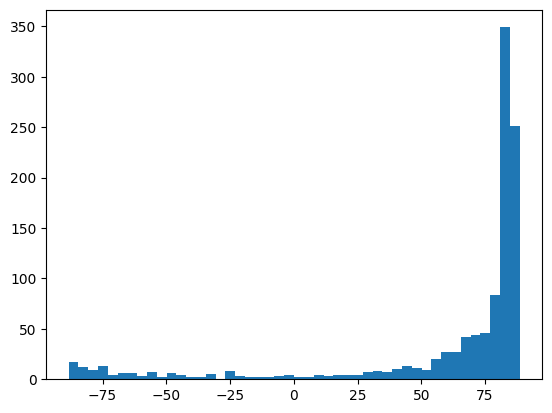

In [64]:
plt.hist(col[col['particle_type'] == 'kaon']['thetas'], bins='auto')

(array([ 11.,   5.,   3.,   2.,   1.,   1.,   3.,   2.,   8.,   7.,   4.,
          5.,   3.,   0.,   3.,   3.,   5.,   2.,   4.,  10.,   7.,   2.,
          3.,   3.,   2.,   3.,   3.,   5.,   3.,   5.,   5.,   9.,   4.,
          8.,   5.,  10.,   7.,   1.,   2.,   3.,   5.,  12.,   7.,   9.,
          6.,   2.,   8.,   7.,   7.,   1.,   6.,   1.,  22.,   9.,   5.,
          4.,   7.,  12.,  15.,   7.,   9.,   8.,  12.,  17.,  14.,  10.,
         12.,  11.,  12.,  26.,  22.,  19.,  30.,  25.,  27.,  34.,  40.,
         26.,  35.,  70.,  38.,  62.,  53.,  67.,  76.,  93.,  95., 114.,
        139., 160., 201., 199., 227., 286., 327., 387., 430., 514., 505.,
        524., 456., 278., 211., 230., 308.,  14.]),
 array([-8.49649153e+01, -8.33313755e+01, -8.16978356e+01, -8.00642958e+01,
        -7.84307559e+01, -7.67972161e+01, -7.51636762e+01, -7.35301364e+01,
        -7.18965965e+01, -7.02630567e+01, -6.86295168e+01, -6.69959770e+01,
        -6.53624371e+01, -6.37288973e+01, -6.20953574e

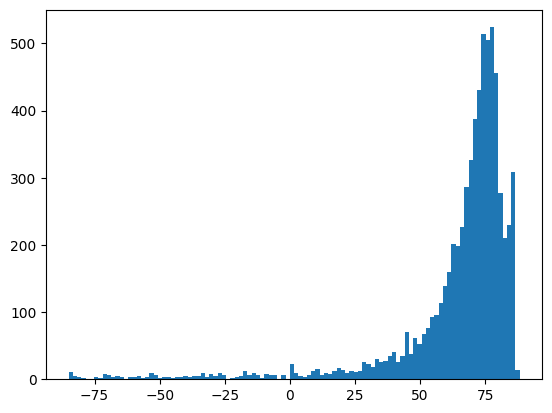

In [65]:
plt.hist(col[col['particle_type'] == 'proton']['thetas'], bins='auto')

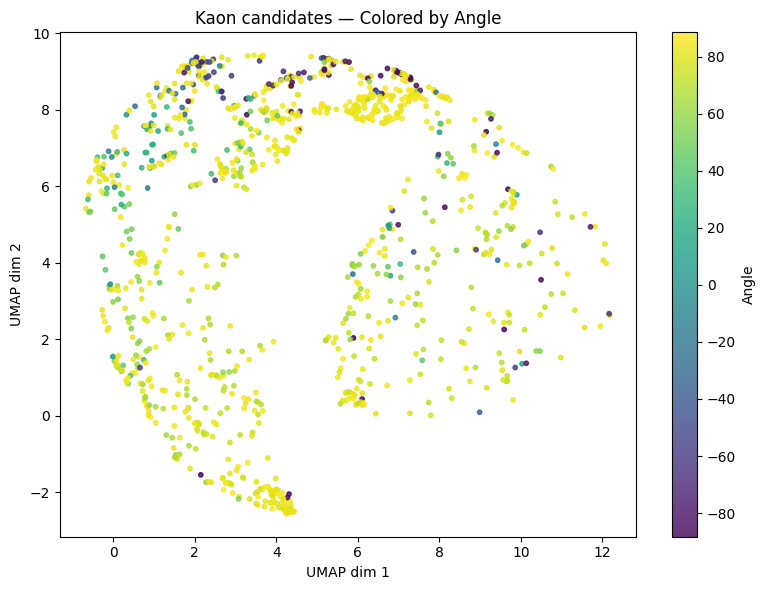

In [66]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                 c=col[col['particle_type'] == 'kaon']['thetas'], cmap='viridis', s=10, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("Angle")

plt.title("Kaon candidates — Colored by Angle")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('length.png', dpi=1000)
plt.show()

feature: active pixels count in the last wires

In [67]:
box_height = 175
box_width = 1500

col_heights = col['height'].to_numpy(dtype=int)
ind_heights = ind['height'].to_numpy(dtype=int)

col_nonzero_counts = []
for img, h in zip(images, col_heights):
    effective_end = min(h, img.shape[0])
    start_row = max(0, effective_end - box_height)
    end_row = min(start_row + box_height, img.shape[0])
    start_row = max(0, end_row - box_height)

    patch = img[start_row:end_row, :box_width]
    col_nonzero_counts.append(int(np.count_nonzero(patch)))

ind_nonzero_counts = []
for img, h in zip(ind_images, ind_heights):
    effective_end = min(h, img.shape[0])
    start_row = max(0, effective_end - box_height)
    end_row = min(start_row + box_height, img.shape[0])
    start_row = max(0, end_row - box_height)

    patch = img[start_row:end_row, :box_width]
    ind_nonzero_counts.append(int(np.count_nonzero(patch)))

col['nonzero_50x1500'] = col_nonzero_counts
ind['nonzero_50x1500'] = ind_nonzero_counts

print("Added nonzero_50x1500 counts:", len(col_nonzero_counts), "collection images,", len(ind_nonzero_counts), "induction images")


Added nonzero_50x1500 counts: 7877 collection images, 7877 induction images


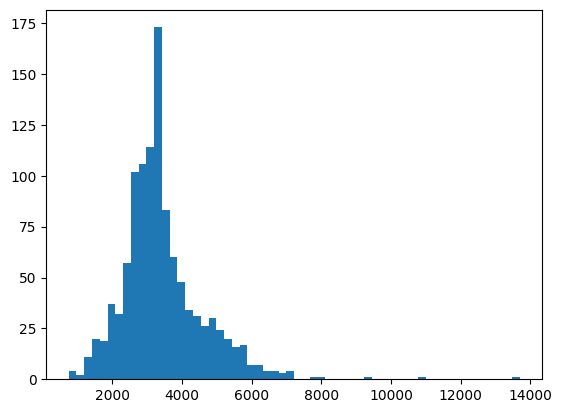

In [68]:
plt.hist(col[col['particle_type'] == 'kaon']['nonzero_50x1500'], bins='auto'); plt.show()
# plt.xlim(0, 8000)

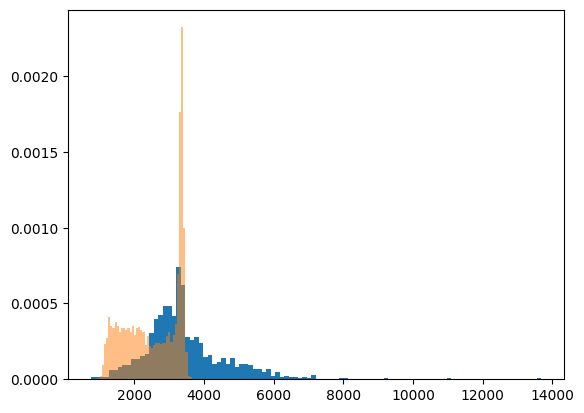

In [69]:
plt.hist(col[col['particle_type'] == 'kaon']['nonzero_50x1500'], bins=100, density=True)
plt.hist(col[col['particle_type'] == 'proton']['nonzero_50x1500'], bins=50, alpha=0.5, density=True)
# plt.xlim(0, 10000)
plt.show()

Correlation between log_pY and kaon count: -0.1875


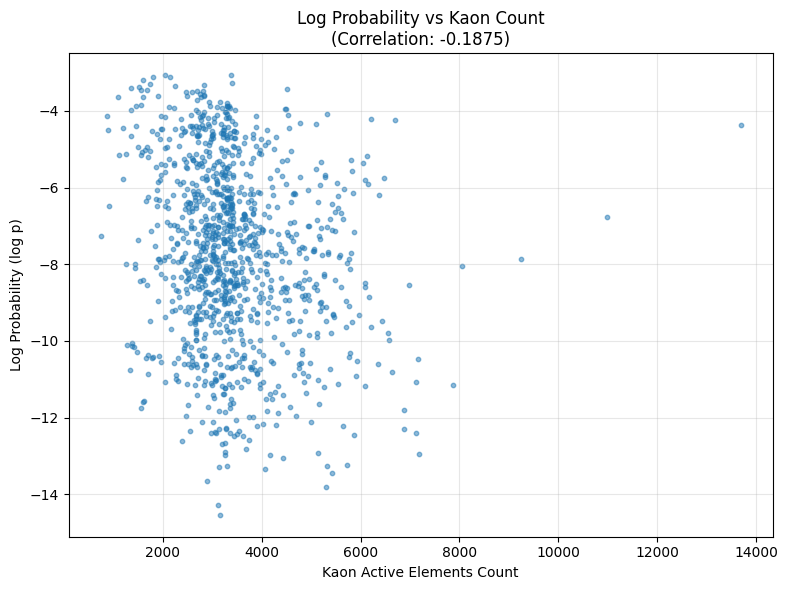

Correlation between log_pX and proton count: 0.0088


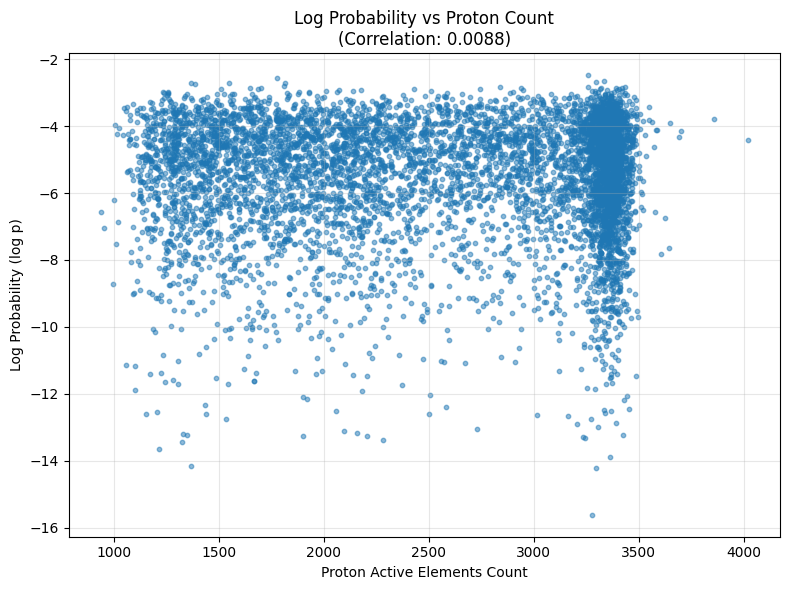

In [70]:
k_count = col[col['particle_type'] == 'kaon']['nonzero_50x1500'].values
p_count = col[col['particle_type'] == 'proton']['nonzero_50x1500'].values

correlation = np.corrcoef(log_pY, k_count)[0, 1]

print(f"Correlation between log_pY and kaon count: {correlation:.4f}")

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(k_count, log_pY, alpha=0.5, s=10)
plt.xlabel("Kaon Active Elements Count")
plt.ylabel("Log Probability (log p)")
plt.title(f"Log Probability vs Kaon Count\n(Correlation: {correlation:.4f})")
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.xlim(0, 8000)
plt.show()

log = np.concatenate([log_pX, log_pZ])

correlation = np.corrcoef(log, p_count)[0, 1]

print(f"Correlation between log_pX and proton count: {correlation:.4f}")

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(p_count, log, alpha=0.5, s=10)
plt.xlabel("Proton Active Elements Count")
plt.ylabel("Log Probability (log p)")
plt.title(f"Log Probability vs Proton Count\n(Correlation: {correlation:.4f})")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

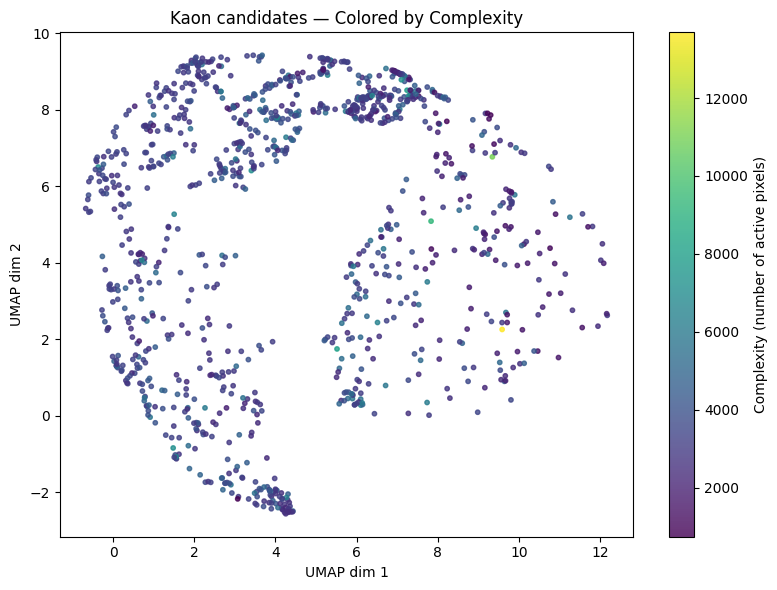

In [71]:
fig = plt.figure(figsize=(8, 6))

values = col[col['particle_type'] == 'kaon']['nonzero_50x1500'].values

sc = plt.scatter(
    E_d[:, 0], E_d[:, 1],
    c=values,
    cmap='viridis',
    s=10,
    alpha=0.8
    # no norm → linear colour scale
)

cbar = plt.colorbar(sc)
cbar.set_label("Complexity (number of active pixels)")

plt.title("Kaon candidates — Colored by Complexity")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()

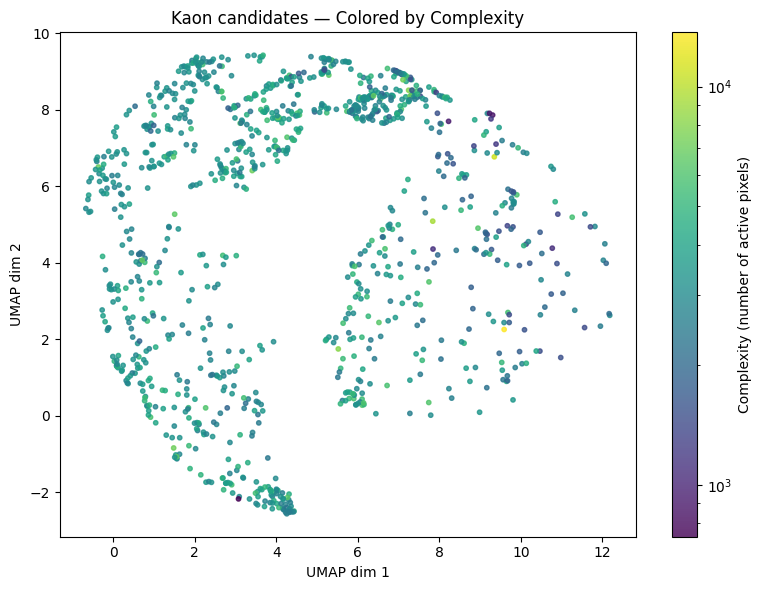

In [72]:
from matplotlib.colors import LogNorm

fig = plt.figure(figsize=(8, 6))

values = col[col['particle_type'] == 'kaon']['nonzero_50x1500'].values

sc = plt.scatter(
    E_d[:, 0], E_d[:, 1],
    c=values,
    cmap='viridis',
    s=10,
    alpha=0.8,
    norm=LogNorm(vmin=values.min(), vmax=values.max())
)

cbar = plt.colorbar(sc)
cbar.set_label("Complexity (number of active pixels)")

plt.title("Kaon candidates — Colored by Complexity")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()


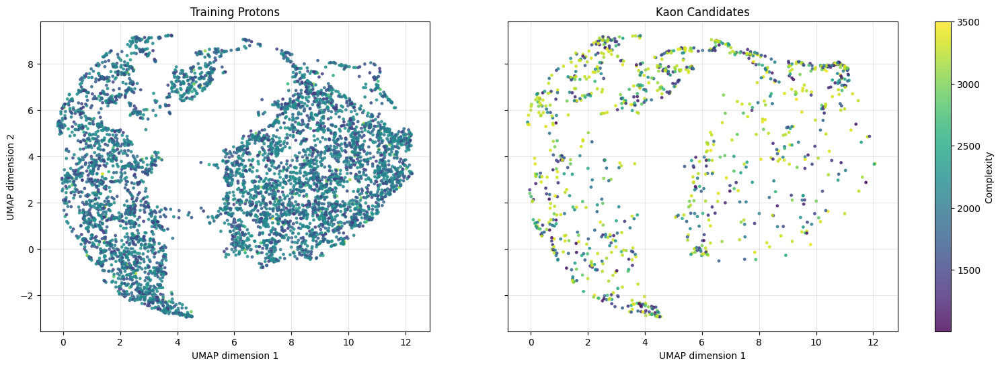

In [95]:
Z_all = np.concatenate([latent_vectors, latent_vectors_k, latent_vectors_val], axis=0)
labels = np.concatenate([
    np.zeros(len(latent_vectors)),          # 0 = protons
    np.ones(len(latent_vectors_k)),         # 1 = kaons
    np.full(len(latent_vectors_val), 2)     # 2 = validation
])

reducer = umap.UMAP(n_neighbors=30, min_dist=0.1)
Z_umap = reducer.fit_transform(Z_all)

palette = ['steelblue', 'darkorange', 'forestgreen']
names = ['Training Protons', 'Kaon Candidates', 'Validation Protons']


cmap = plt.cm.viridis

values = col['nonzero_50x1500'].values
values = np.where(values > 7000, 0, values)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharex=True, sharey=True)

for i, ax in enumerate(axes):
    m = (labels == i)
    sc = ax.scatter(
        Z_umap[m, 0],
        Z_umap[m, 1],
        c=values[m],
        cmap=cmap,
        s=6,
        alpha=0.8
    )
    ax.set_title(names[i], fontsize=12)
    ax.set_xlabel("UMAP dimension 1")
    if i == 0:
        ax.set_ylabel("UMAP dimension 2")
    ax.grid(True, alpha=0.3)

cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), fraction=0.046, pad=0.04)
cbar.set_label('Complexity')

# fig.suptitle("UMAP embeddings coloured by Reconstruction Error (log scale)", fontsize=14)

# plt.savefig('UMAPandRE.png', dpi=1000)
plt.show()


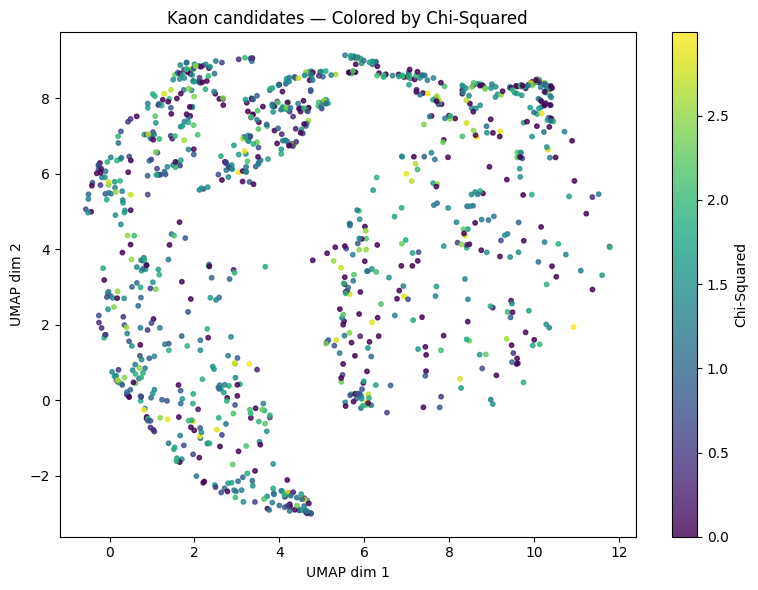

In [ ]:
fig = plt.figure(figsize=(8, 6))

values = col[col['particle_type'] == 'kaon']['chi_squared_kaon'].values
values = np.where(values > 3, 0, values)

sc = plt.scatter(
    E_d[:, 0], E_d[:, 1],
    c=values,
    cmap='viridis',
    s=10,
    alpha=0.8
    # no norm → linear colour scale
)

cbar = plt.colorbar(sc)
cbar.set_label("Chi-Squared")

plt.title("Kaon candidates — Colored by Chi-Squared")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()


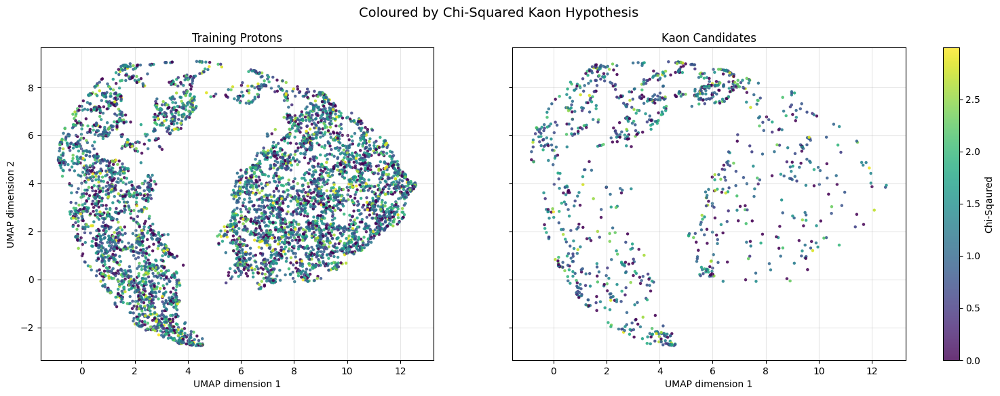

In [90]:
Z_all = np.concatenate([latent_vectors, latent_vectors_k, latent_vectors_val], axis=0)
labels = np.concatenate([
    np.zeros(len(latent_vectors)),          # 0 = protons
    np.ones(len(latent_vectors_k)),         # 1 = kaons
    np.full(len(latent_vectors_val), 2)     # 2 = validation
])

reducer = umap.UMAP(n_neighbors=30, min_dist=0.1)
Z_umap = reducer.fit_transform(Z_all)

palette = ['steelblue', 'darkorange', 'forestgreen']
names = ['Training Protons', 'Kaon Candidates', 'Validation Protons']

cmap = plt.cm.viridis

values = col['chi_squared_kaon'].values
values = np.where(values > 3, 0, values)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharex=True, sharey=True)

for i, ax in enumerate(axes):
    m = (labels == i)
    sc = ax.scatter(
        Z_umap[m, 0],
        Z_umap[m, 1],
        c=values[m],
        cmap=cmap,
        s=5,
        alpha=0.8
    )
    ax.set_title(names[i], fontsize=12)
    ax.set_xlabel("UMAP dimension 1")
    if i == 0:
        ax.set_ylabel("UMAP dimension 2")
    ax.grid(True, alpha=0.3)

cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), fraction=0.046, pad=0.04)
cbar.set_label('Chi-Sqaured')

fig.suptitle("Coloured by Chi-Squared Kaon Hypothesis", fontsize=14)

# plt.savefig('UMAPandRE.png', dpi=1000)
plt.show()


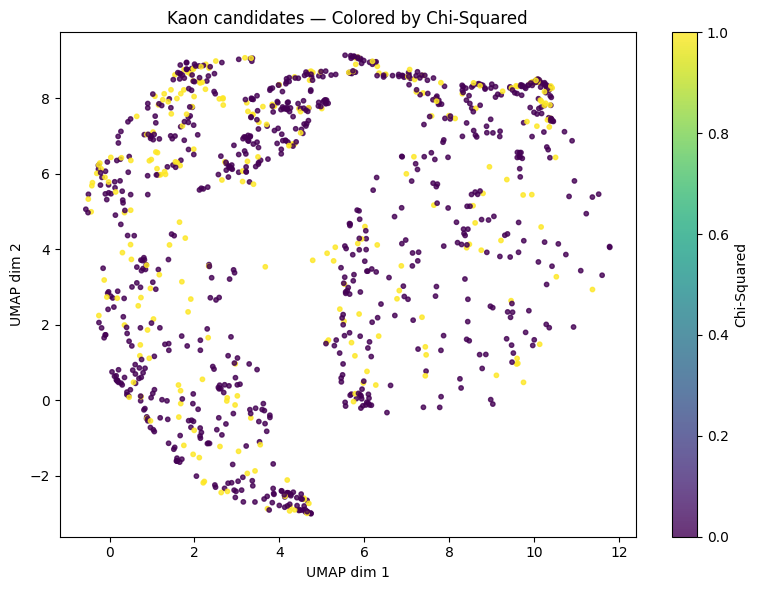

In [ ]:
fig = plt.figure(figsize=(8, 6))

values = col[col['particle_type'] == 'kaon']['particle_hypothesis'].values
values = np.where(values > 3, 0, values)

sc = plt.scatter(
    E_d[:, 0], E_d[:, 1],
    c=values,
    cmap='viridis',
    s=10,
    alpha=0.8
    # no norm → linear colour scale
)

cbar = plt.colorbar(sc)
cbar.set_label("Chi-Squared")

plt.title("Kaon candidates — Colored by Chi-Squared")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()


Correlation between log_pY and kaon count: 0.0155


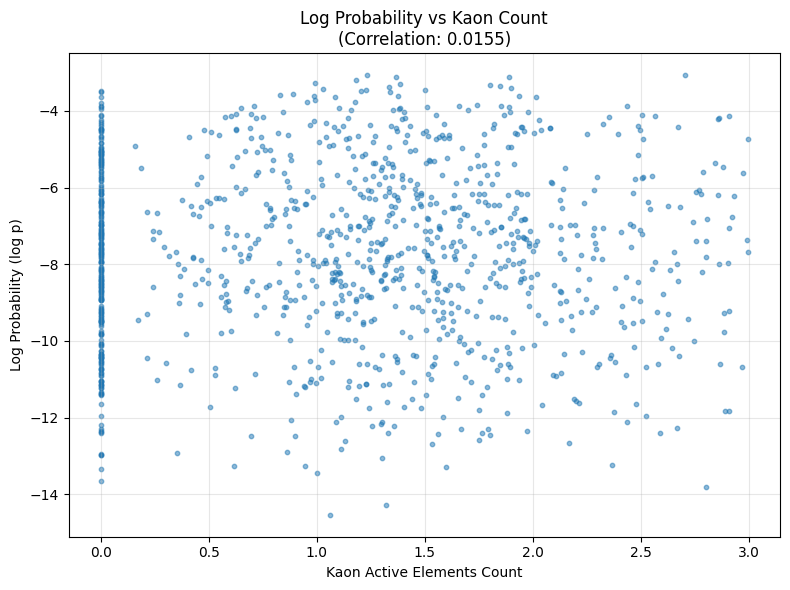

Correlation between log_pX and proton count: -0.0041


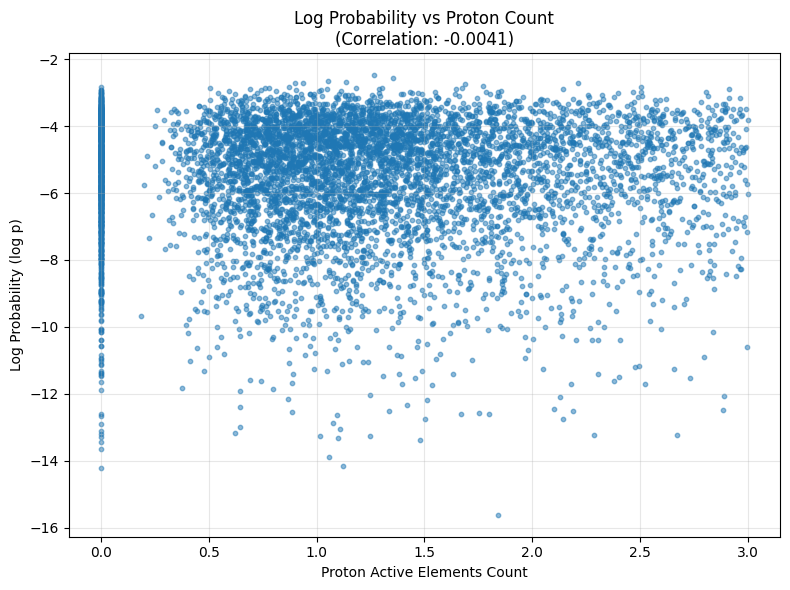

In [ ]:
k_chi = col[col['particle_type'] == 'kaon']['chi_squared_kaon'].values
k_chi = np.where(k_chi > 3, 0, k_chi)

p_chi = col[col['particle_type'] == 'proton']['chi_squared_kaon'].values
p_chi = np.where(p_chi > 3, 0, p_chi)

correlation = np.corrcoef(log_pY, k_chi)[0, 1]

print(f"Correlation between log_pY and kaon count: {correlation:.4f}")

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(k_chi, log_pY, alpha=0.5, s=10)
plt.xlabel("Kaon Active Elements Count")
plt.ylabel("Log Probability (log p)")
plt.title(f"Log Probability vs Kaon Count\n(Correlation: {correlation:.4f})")
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.xlim(0, 8000)
plt.show()

log = np.concatenate([log_pX, log_pZ])

correlation = np.corrcoef(log, p_chi)[0, 1]

print(f"Correlation between log_pX and proton count: {correlation:.4f}")

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(p_chi, log, alpha=0.5, s=10)
plt.xlabel("Proton Active Elements Count")
plt.ylabel("Log Probability (log p)")
plt.title(f"Log Probability vs Proton Count\n(Correlation: {correlation:.4f})")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

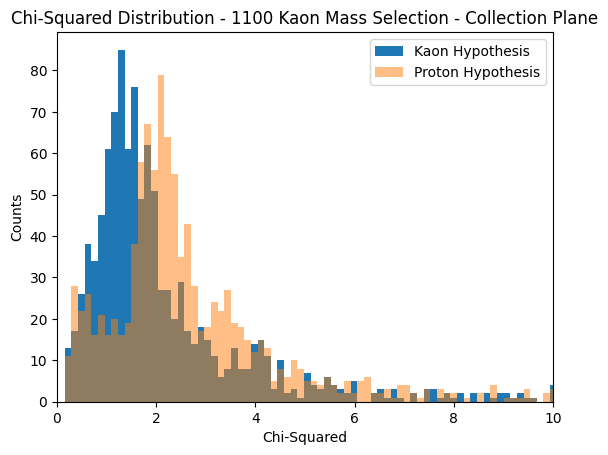

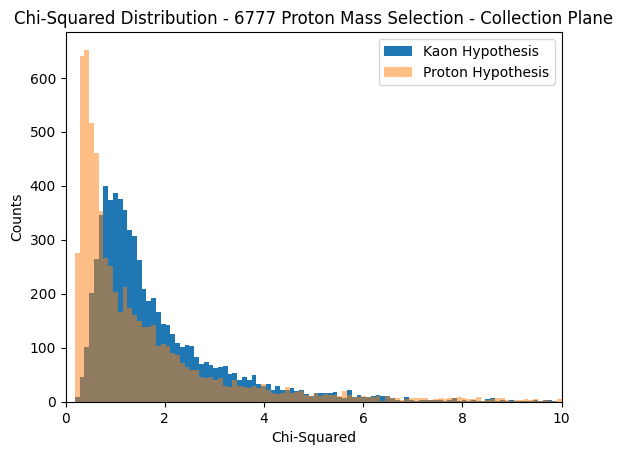

In [ ]:
bins = np.linspace(min(col[(col['particle_type']=='kaon')]['chi_squared_kaon'].values), max(col[col['particle_type']=='kaon']['chi_squared_kaon'].values), 1000)

n = len(col[col['particle_type']=='kaon'])

plt.hist(col[col['particle_type']=='kaon']['chi_squared_kaon'], bins=bins, label='Kaon Hypothesis')
plt.hist(col[col['particle_type']=='kaon']['chi_squared_proton'], bins=bins, alpha=0.5, label='Proton Hypothesis')
plt.title(f'Chi-Squared Distribution - {n} Kaon Mass Selection - Collection Plane')
plt.xlabel('Chi-Squared')
plt.ylabel('Counts')

plt.xlim(0, 10)
plt.legend()
plt.show()

bins = np.linspace(min(col[col['particle_type']=='proton']['chi_squared_kaon'].values), max(col[col['particle_type']=='proton']['chi_squared_kaon'].values), 500)

n = len(col[col['particle_type']=='proton'])

plt.hist(col[col['particle_type']=='proton']['chi_squared_kaon'], bins=bins, label='Kaon Hypothesis')
plt.hist(col[col['particle_type']=='proton']['chi_squared_proton'], bins=bins, alpha=0.5, label='Proton Hypothesis')
plt.title(f'Chi-Squared Distribution - {n} Proton Mass Selection - Collection Plane')
plt.xlabel('Chi-Squared')
plt.ylabel('Counts')

plt.xlim(0, 10)
plt.legend()
plt.show()

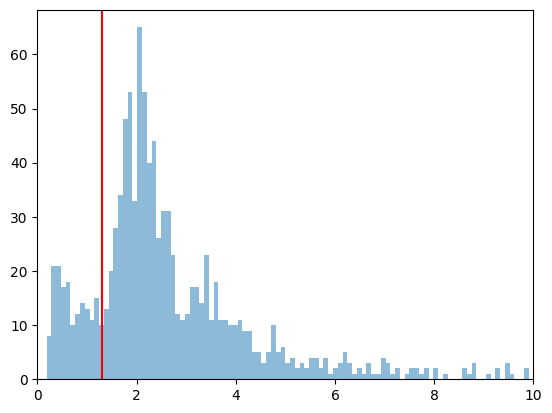

In [ ]:
plt.hist(col[col['particle_type']=='kaon']['chi_squared_proton'], bins=bins, alpha=0.5, label='Proton Hypothesis')
plt.xlim(0, 10)
plt.axvline(1.3, c='r')

In [ ]:
kaons = col[col['particle_type'] == 'kaon'].reset_index(drop=True)
protons = col[col['particle_type'] == 'proton'].reset_index(drop=True)

Kaon Candidates, Kaon Hypothesis Chi-Squared > 2, n=421


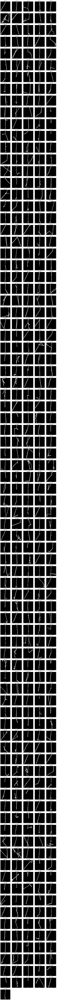

In [ ]:
chi_mask = kaons['chi_squared_kaon'] > 2
indices = kaons[chi_mask].index.tolist()

print(f'Kaon Candidates, Kaon Hypothesis Chi-Squared > 2, n={len(indices)}')

N = len(indices)
ncols = 5
nrows = math.ceil(N / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2.5, nrows*2.5))
axes = axes.flatten()

for i, idx in enumerate(indices):
    # Get image from k tensor
    img = k[idx].cpu().numpy() if torch.is_tensor(k) else k[idx]
    
    # Handle different image formats
    if isinstance(img, np.ndarray) and img.ndim == 3 and img.shape[0] in (1, 2, 3):
        if img.shape[0] == 1:
            img = img[0]
        elif img.shape[0] == 2:
            img = img[0]  # Use first channel (collection plane)
        else:
            img = np.transpose(img, (1, 2, 0))
    
    ax = axes[i]
    ax.imshow(img, cmap='gray' if img.ndim == 2 else None, interpolation='nearest')
    ax.text(
            0.02, 0.02, f"χ={kaons.iloc[idx]['chi_squared_kaon']:.0f}",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    ax.text(
            0.3, 0.02, f"m={kaons.iloc[idx]['beamline_mass']:.0f}({kaons.iloc[idx]['p']:.0f})",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    lp = log_pY[idx]

    txt = f'p={lp:.0f}'

    ax.text(0.98, 0.02, txt,
        transform=ax.transAxes,
        ha='right', va='bottom',
        color='white', fontsize=8,
        bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none'))


    ax.set_title(f'idx={idx}')
    ax.axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


Kaon Candidates, Kaon Hypothesis Chi-Squared < 2, n=679


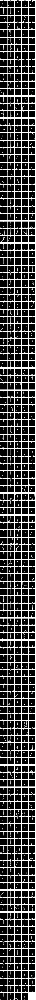

In [ ]:
chi_mask = kaons['chi_squared_kaon'] < 2
indices = kaons[chi_mask].index.tolist()

print(f'Kaon Candidates, Kaon Hypothesis Chi-Squared < 2, n={len(indices)}')

N = len(indices)
ncols = 5
nrows = math.ceil(N / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2.5, nrows*2.5))
axes = axes.flatten()

for i, idx in enumerate(indices):
    # Get image from k tensor
    img = k[idx].cpu().numpy() if torch.is_tensor(k) else k[idx]
    
    # Handle different image formats
    if isinstance(img, np.ndarray) and img.ndim == 3 and img.shape[0] in (1, 2, 3):
        if img.shape[0] == 1:
            img = img[0]
        elif img.shape[0] == 2:
            img = img[0]  # Use first channel (collection plane)
        else:
            img = np.transpose(img, (1, 2, 0))
    
    ax = axes[i]
    ax.imshow(img, cmap='gray' if img.ndim == 2 else None, interpolation='nearest')
    ax.text(
            0.02, 0.02, f"χ={kaons.iloc[idx]['chi_squared_kaon']:.0f}",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    ax.text(
            0.3, 0.02, f"m={kaons.iloc[idx]['beamline_mass']:.0f}({kaons.iloc[idx]['p']:.0f})",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    lp = log_pY[idx]

    txt = f'p={lp:.0f}'

    ax.text(0.98, 0.02, txt,
        transform=ax.transAxes,
        ha='right', va='bottom',
        color='white', fontsize=8,
        bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none'))


    ax.set_title(f'idx={idx}')
    ax.axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


Kaon Candidates, Proton Hypothesis Chi-Squared < 1.3, n=166


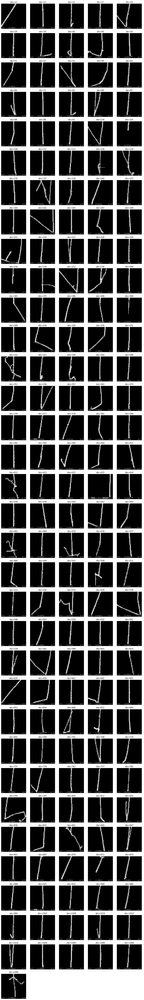

In [ ]:
chi_mask = kaons['chi_squared_proton'] < 1.3
indices = kaons[chi_mask].index.tolist()

print(f'Kaon Candidates, Proton Hypothesis Chi-Squared < 1.3, n={len(indices)}')

N = len(indices)
ncols = 5
nrows = math.ceil(N / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2.5, nrows*2.5))
axes = axes.flatten()

for i, idx in enumerate(indices):
    # Get image from k tensor
    img = k[idx].cpu().numpy() if torch.is_tensor(k) else k[idx]
    
    # Handle different image formats
    if isinstance(img, np.ndarray) and img.ndim == 3 and img.shape[0] in (1, 2, 3):
        if img.shape[0] == 1:
            img = img[0]
        elif img.shape[0] == 2:
            img = img[0]  # Use first channel (collection plane)
        else:
            img = np.transpose(img, (1, 2, 0))
    
    ax = axes[i]
    ax.imshow(img, cmap='gray' if img.ndim == 2 else None, interpolation='nearest')
    ax.text(
            0.02, 0.02, f"χ={kaons.iloc[idx]['chi_squared_kaon']:.0f}",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    ax.text(
            0.3, 0.02, f"m={kaons.iloc[idx]['beamline_mass']:.0f}({kaons.iloc[idx]['p']:.0f})",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    lp = log_pY[idx]

    txt = f'p={lp:.0f}'

    ax.text(0.98, 0.02, txt,
        transform=ax.transAxes,
        ha='right', va='bottom',
        color='white', fontsize=8,
        bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none'))


    ax.set_title(f'idx={idx}')
    ax.axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


Kaon Candidates, Kaon & Proton Hypothesis Chi-Squared < 1.3, n=139


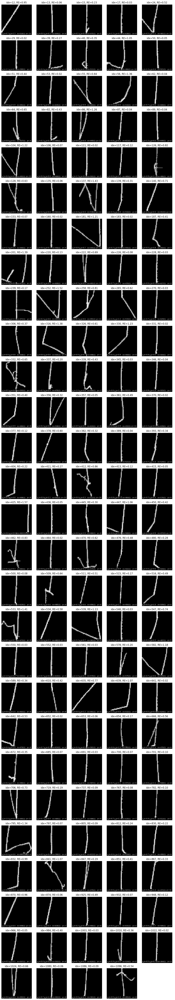

In [ ]:
chi_mask = (kaons['chi_squared_kaon'] < 1.3) & (kaons['chi_squared_proton'] < 1.3)
kaon_proton = kaons[(kaons['chi_squared_kaon'] < 1.3) & (kaons['chi_squared_proton'] < 1.3)]
indices = kaons[chi_mask].index.tolist()

print(f'Kaon Candidates, Kaon & Proton Hypothesis Chi-Squared < 1.3, n={len(kaon_proton)}')

N = len(indices)
ncols = 5
nrows = math.ceil(N / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2.5, nrows*2.5))
axes = axes.flatten()

for i, idx in enumerate(indices):
    # Get image from k tensor
    img = k[idx].cpu().numpy() if torch.is_tensor(k) else k[idx]
    
    # Handle different image formats
    if isinstance(img, np.ndarray) and img.ndim == 3 and img.shape[0] in (1, 2, 3):
        if img.shape[0] == 1:
            img = img[0]
        elif img.shape[0] == 2:
            img = img[0]  # Use first channel (collection plane)
        else:
            img = np.transpose(img, (1, 2, 0))
    
    ax = axes[i]
    ax.imshow(img, cmap='gray' if img.ndim == 2 else None, interpolation='nearest')
    ax.text(
            0.02, 0.02, f"χ_k={kaons.iloc[idx]['chi_squared_kaon']:.1f}",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    ax.text(
            0.25, 0.02, f"χ_p={kaons.iloc[idx]['chi_squared_proton']:.1f}",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    ax.text(
            0.52, 0.02, f"m={kaons.iloc[idx]['beamline_mass']:.0f}({kaons.iloc[idx]['p']:.0f})",
            transform=ax.transAxes,
            ha='left', va='bottom',
            color='white', fontsize=8,
            bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none', )
        )
    
    lp = log_pY[idx]

    txt = f'p={lp:.0f}'

    ax.text(0.98, 0.02, txt,
        transform=ax.transAxes,
        ha='right', va='bottom',
        color='white', fontsize=8,
        bbox=dict(facecolor='black', alpha=1, pad=2, edgecolor='none'))


    ax.set_title(f'idx={idx}, RE={RE_Y[idx]:.2f}')
    ax.axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


Density map conditioned by length

In [ ]:
X = np.asarray(latent)              # reference = protons
Y = np.asarray(latent_vectors_k)            # query = kaons
Z = np.asarray(latent_vectors_val)          # query = unseen protons

In [ ]:
Lx = protons.iloc[train_idx]['height']
Ly = kaons['height']
Lz = protons.iloc[val_idx]['height']

In [ ]:
from nflows import transforms, distributions, flows

context_dim = 1 
latent_dim = 4  

# Build a series of invertible transformations conditioned on 'L'
transform = transforms.CompositeTransform([
    transforms.autoregressive.MaskedAffineAutoregressiveTransform(
        features=latent_dim, 
        hidden_features=64, 
        context_features=context_dim
    ) for _ in range(5)
])

flow = flows.Flow(transform, distributions.StandardNormal([latent_dim]))

In [ ]:
# 1. Calculate Mean and Std from the TRAINING data (Protons)
L_mean = Lx.values.mean()
L_std = Lx.values.std()

print(f"Original Length Mean: {L_mean:.2f}, Std: {L_std:.2f}")

# 2. Standardize the training lengths
Lx_scaled = (Lx.values - L_mean) / L_std

Original Length Mean: 49.77, Std: 29.76


In [ ]:
import torch
from torch import optim
from torch.utils.data import TensorDataset, DataLoader

# 1. Prepare Training Data (Protons: X and Lx)
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')
flow = flow.float().to(device)

# Convert your training protons (X) and their lengths (Lx) to tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
Lx_tensor = torch.tensor(Lx_scaled, dtype=torch.float32).view(-1, 1)

# Create a DataLoader for batching
train_dataset = TensorDataset(X_tensor, Lx_tensor)
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# 2. Set up the Optimizer
optimizer = optim.Adam(flow.parameters(), lr=1e-2)

# 3. Train the Flow
epochs = 300 # Adjust if necessary
flow.train()

print("Training Normalizing Flow on Protons...")
for epoch in range(epochs):
    total_loss = 0
    for batch_z, batch_L in train_loader:
        batch_z, batch_L = batch_z.to(device), batch_L.to(device)
        
        optimizer.zero_grad()
        
        # The loss is the negative log-likelihood 
        # We want to MAXIMIZE the probability of the training protons
        loss = -flow.log_prob(inputs=batch_z, context=batch_L).mean()
        
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1}/{epochs} | Loss: {total_loss/len(train_loader):.4f}")

print("Training Complete!")

Training Normalizing Flow on Protons...
Epoch 10/300 | Loss: 5.7570
Epoch 20/300 | Loss: 5.2527
Epoch 30/300 | Loss: 5.0883
Epoch 40/300 | Loss: 5.0090
Epoch 50/300 | Loss: 4.9133
Epoch 60/300 | Loss: 4.8742
Epoch 70/300 | Loss: 4.8041
Epoch 80/300 | Loss: 4.7407
Epoch 90/300 | Loss: 4.7992
Epoch 100/300 | Loss: 4.6866
Epoch 110/300 | Loss: 4.6275
Epoch 120/300 | Loss: 4.6026
Epoch 130/300 | Loss: 4.5822
Epoch 140/300 | Loss: 4.5909
Epoch 150/300 | Loss: 4.5434
Epoch 160/300 | Loss: 4.5584
Epoch 170/300 | Loss: 4.4965
Epoch 180/300 | Loss: 4.5507
Epoch 190/300 | Loss: 4.4636
Epoch 200/300 | Loss: 4.4726
Epoch 210/300 | Loss: 4.5016
Epoch 220/300 | Loss: 4.4524
Epoch 230/300 | Loss: 4.4371
Epoch 240/300 | Loss: 4.4455
Epoch 250/300 | Loss: 4.4261
Epoch 260/300 | Loss: 4.4719
Epoch 270/300 | Loss: 4.3795
Epoch 280/300 | Loss: 4.3917
Epoch 290/300 | Loss: 4.3760
Epoch 300/300 | Loss: 4.3886
Training Complete!


In [ ]:
device = next(flow.parameters()).device 

flow.eval()

Lz_scaled = (Lz.values - L_mean) / L_std

with torch.no_grad():
    mu_tensor = torch.tensor(Z, dtype=torch.float32).to(device)
    L_tensor = torch.tensor(Lz_scaled, dtype=torch.float32).view(-1, 1).to(device)
    
    log_prob = flow.log_prob(inputs=mu_tensor, context=L_tensor)
    proton_score = -log_prob.cpu().numpy()

In [ ]:
device = next(flow.parameters()).device 

flow.eval()

Ly_scaled = (Ly.values - L_mean) / L_std

with torch.no_grad():
    mu_tensor = torch.tensor(Y, dtype=torch.float32).to(device)
    L_tensor = torch.tensor(Ly_scaled, dtype=torch.float32).view(-1, 1).to(device)
    
    log_prob = flow.log_prob(inputs=mu_tensor, context=L_tensor)
    kaon_score = -log_prob.cpu().numpy()

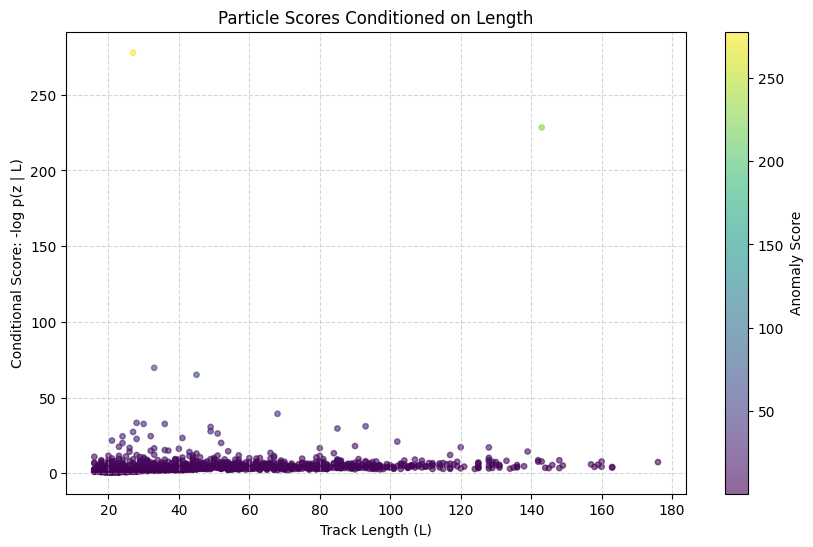

In [ ]:
plt.figure(figsize=(10, 6))
# Plot Length (Ly) vs the Anomaly Score (kaon_score)
plt.scatter(Lz, proton_score, alpha=0.6, s=15, c=proton_score, cmap='viridis')
plt.colorbar(label='Anomaly Score')

plt.xlabel('Track Length (L)')
plt.ylabel('Conditional Score: -log p(z | L)')
plt.title('Particle Scores Conditioned on Length')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

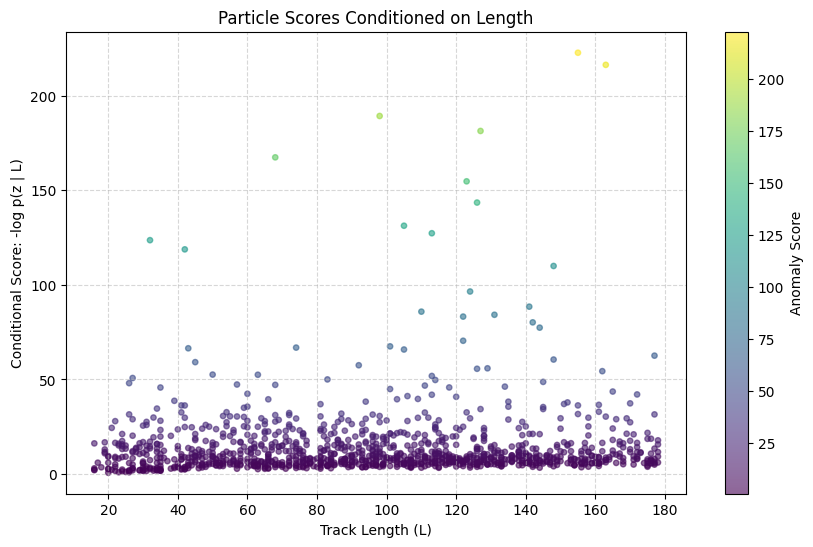

In [ ]:
plt.figure(figsize=(10, 6))
# Plot Length (Ly) vs the Anomaly Score (kaon_score)
plt.scatter(Ly, kaon_score, alpha=0.6, s=15, c=kaon_score, cmap='viridis')
plt.colorbar(label='Anomaly Score')

plt.xlabel('Track Length (L)')
plt.ylabel('Conditional Score: -log p(z | L)')
plt.title('Particle Scores Conditioned on Length')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [ ]:
# Sort indices by score in descending order (highest score first)
top_kaon_idx = np.argsort(kaon_score)[::-1]

print("Top 10 most likely Kaon indices in your dataset:")
print(top_kaon_idx[:10])

Top 10 most likely Kaon indices in your dataset:
[ 706  890 1077  726   88  104  867  340  821  824]


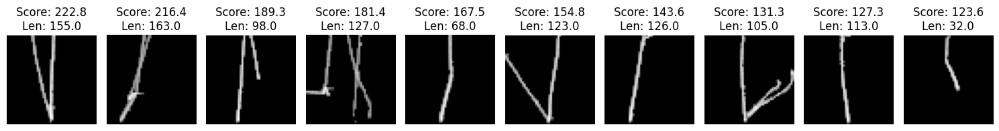

In [ ]:
fig, axes = plt.subplots(1, 10, figsize=(15, 3))
for i, ax in enumerate(axes):
    idx = top_kaon_idx[i]
    
    img = k[idx, 0] 
    
    ax.imshow(img, cmap='gray') # or whatever colormap you use for the tracks
    ax.set_title(f"Score: {kaon_score[idx]:.1f}\nLen: {Ly[idx]:.1f}")
    ax.axis('off')

plt.tight_layout()
plt.show()

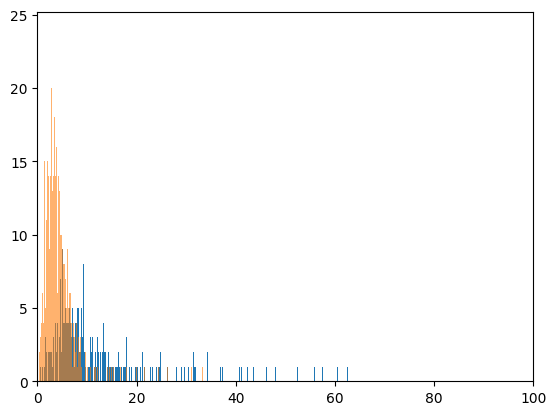

In [ ]:
plt.hist(kaon_score, bins=5000)
plt.hist(proton_score, alpha=0.6, bins=5000)
plt.xlim(0, 100)
plt.show()

In [ ]:
# === Conditional flow with early stopping, latent/context standardization, permutations ===
import copy
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch import optim
from torch.utils.data import TensorDataset, DataLoader
from nflows import transforms, distributions, flows

np.random.seed(42)
torch.manual_seed(42)

# 0) Use encoder mean latents (mu) for stability
X_mu = np.asarray(latent_vectors, dtype=np.float32)       # proton latents (VAE-train split)
Z_mu = np.asarray(latent_vectors_val, dtype=np.float32)   # proton latents (VAE-val split)
Y_mu = np.asarray(latent_vectors_k, dtype=np.float32)     # kaon latents

Lx_raw = protons.iloc[train_idx]["height"].to_numpy(dtype=np.float32)
Lz_raw = protons.iloc[val_idx]["height"].to_numpy(dtype=np.float32)
Ly_raw = kaons["height"].to_numpy(dtype=np.float32)

assert len(X_mu) == len(Lx_raw)
assert len(Z_mu) == len(Lz_raw)
assert len(Y_mu) == len(Ly_raw)

# 1) Standardize latent dimensions using X only
z_mean = X_mu.mean(axis=0, keepdims=True)
z_std = X_mu.std(axis=0, keepdims=True) + 1e-6

X_all = (X_mu - z_mean) / z_std
Z_all = (Z_mu - z_mean) / z_std
Y_all = (Y_mu - z_mean) / z_std

# 2) Proper flow train/val split on proton set + early stopping target
idx = np.arange(len(X_all))
idx_tr, idx_va = train_test_split(idx, test_size=0.10, random_state=42, shuffle=True)

X_tr, X_va = X_all[idx_tr], X_all[idx_va]
L_tr_raw, L_va_raw = Lx_raw[idx_tr], Lx_raw[idx_va]

# 3) Rich nonlinear conditioning c(L) = [L_scaled, L_scaled^2, log(L+eps)]
def make_context(L_raw, L_mean, L_std, eps=1e-3):
    L_raw = np.asarray(L_raw, dtype=np.float32)
    L_scaled = (L_raw - L_mean) / (L_std + 1e-6)
    return np.stack([L_scaled, L_scaled**2, np.log(L_raw + eps)], axis=1).astype(np.float32)

# fit length stats on flow-train only
L_mean = float(L_tr_raw.mean())
L_std = float(L_tr_raw.std() + 1e-6)

C_tr = make_context(L_tr_raw, L_mean, L_std)
C_va = make_context(L_va_raw, L_mean, L_std)
C_x = make_context(Lx_raw, L_mean, L_std)
C_z = make_context(Lz_raw, L_mean, L_std)
C_y = make_context(Ly_raw, L_mean, L_std)

# standardize context dims using flow-train only
c_mean = C_tr.mean(axis=0, keepdims=True)
c_std = C_tr.std(axis=0, keepdims=True) + 1e-6

C_tr = (C_tr - c_mean) / c_std
C_va = (C_va - c_mean) / c_std
C_x = (C_x - c_mean) / c_std
C_z = (C_z - c_mean) / c_std
C_y = (C_y - c_mean) / c_std

# 4-5) More capacity + permutations between blocks
latent_dim = X_tr.shape[1]       # should be 4
context_dim = C_tr.shape[1]      # 3
hidden_features = 128
num_transforms = 10

transform_list = []
for _ in range(num_transforms):
    transform_list.append(transforms.RandomPermutation(features=latent_dim))
    transform_list.append(
        transforms.autoregressive.MaskedAffineAutoregressiveTransform(
            features=latent_dim,
            hidden_features=hidden_features,
            context_features=context_dim,
        )
    )

transform = transforms.CompositeTransform(transform_list)
flow = flows.Flow(transform, distributions.StandardNormal([latent_dim]))

# 6) Optimization stabilizers
device = torch.device(
    "cuda" if torch.cuda.is_available() else
    "mps" if torch.backends.mps.is_available() else
    "cpu"
)
flow = flow.float().to(device)

train_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_tr), torch.from_numpy(C_tr)),
    batch_size=256, shuffle=True
)
val_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_va), torch.from_numpy(C_va)),
    batch_size=256, shuffle=False
)

optimizer = optim.Adam(flow.parameters(), lr=3e-4, weight_decay=1e-5)
max_epochs = 300
patience = 20
min_delta = 1e-4
grad_clip_norm = 5.0

best_state = None
best_val_nll = np.inf
best_epoch = 0
bad_epochs = 0
history = {"train_nll": [], "val_nll": []}

print(f"Device: {device}")
print(f"Flow-train size: {len(X_tr)} | Flow-val size: {len(X_va)}")
print("Training flow with early stopping...")

for epoch in range(1, max_epochs + 1):
    flow.train()
    train_sum, train_count = 0.0, 0

    for batch_z, batch_c in train_loader:
        batch_z, batch_c = batch_z.to(device), batch_c.to(device)
        optimizer.zero_grad(set_to_none=True)

        loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(flow.parameters(), max_norm=grad_clip_norm)
        optimizer.step()

        bs = batch_z.size(0)
        train_sum += loss.item() * bs
        train_count += bs

    train_nll = train_sum / max(train_count, 1)

    flow.eval()
    val_sum, val_count = 0.0, 0
    with torch.no_grad():
        for batch_z, batch_c in val_loader:
            batch_z, batch_c = batch_z.to(device), batch_c.to(device)
            val_loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
            bs = batch_z.size(0)
            val_sum += val_loss.item() * bs
            val_count += bs

    val_nll = val_sum / max(val_count, 1)

    history["train_nll"].append(train_nll)
    history["val_nll"].append(val_nll)

    if epoch == 1 or epoch % 10 == 0:
        print(f"Epoch {epoch:3d} | train NLL: {train_nll:.4f} | val NLL: {val_nll:.4f}")

    if val_nll < (best_val_nll - min_delta):
        best_val_nll = val_nll
        best_epoch = epoch
        best_state = copy.deepcopy(flow.state_dict())
        bad_epochs = 0
    else:
        bad_epochs += 1
        if bad_epochs >= patience:
            print(f"Early stop at epoch {epoch} | best epoch {best_epoch} | best val NLL {best_val_nll:.4f}")
            break

if best_state is not None:
    flow.load_state_dict(best_state)

print(f"Loaded best checkpoint from epoch {best_epoch} (val NLL={best_val_nll:.4f})")

plt.figure(figsize=(8, 4))
plt.plot(history["train_nll"], label="Flow train NLL")
plt.plot(history["val_nll"], label="Flow val NLL")
plt.xlabel("Epoch")
plt.ylabel("NLL")
plt.title("Conditional flow training")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# === Scoring + calibration checks ===
def flow_score(z_np, c_np):
    flow.eval()
    with torch.no_grad():
        z_t = torch.from_numpy(z_np.astype(np.float32)).to(device)
        c_t = torch.from_numpy(c_np.astype(np.float32)).to(device)
        logp = flow.log_prob(inputs=z_t, context=c_t).cpu().numpy()
    return -logp, logp  # score, log_prob

train_score, train_logp = flow_score(X_tr, C_tr)
val_score, val_logp = flow_score(X_va, C_va)
proton_score, proton_logp = flow_score(Z_all, C_z)  # unseen protons
kaon_score, kaon_logp = flow_score(Y_all, C_y)

# Calibration check 1: train vs val log_prob
plt.figure(figsize=(8, 4))
plt.hist(train_logp, bins=100, density=True, alpha=0.6, label="Flow-train protons")
plt.hist(val_logp, bins=100, density=True, alpha=0.6, label="Flow-val protons")
plt.xlabel("log p(z | c(L))")
plt.ylabel("Density")
plt.title("Calibration: proton train vs val")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Calibration check 2: score stability across length bins
def bin_groups(lengths, scores, quantiles=(0, 0.2, 0.4, 0.6, 0.8, 1.0), min_count=10):
    edges = np.quantile(lengths, quantiles)
    edges = np.unique(edges)
    groups, labels = [], []
    for i in range(len(edges) - 1):
        lo, hi = edges[i], edges[i + 1]
        m = (lengths >= lo) & ((lengths < hi) if i < len(edges) - 2 else (lengths <= hi))
        if m.sum() >= min_count:
            groups.append(scores[m])
            labels.append(f"{lo:.0f}-{hi:.0f}")
    return groups, labels

val_groups, val_labels = bin_groups(L_va_raw, val_score)
ka_groups, ka_labels = bin_groups(Ly_raw, kaon_score)

fig, ax = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

if len(val_groups) > 0:
    ax[0].boxplot(val_groups, labels=val_labels, showfliers=False)
ax[0].set_title("Flow-val proton score by length bin")
ax[0].set_xlabel("Length bin")
ax[0].set_ylabel("Score = -log p(z|c)")
ax[0].tick_params(axis="x", rotation=45)
ax[0].grid(alpha=0.3)

if len(ka_groups) > 0:
    ax[1].boxplot(ka_groups, labels=ka_labels, showfliers=False)
ax[1].set_title("Kaon score by length bin")
ax[1].set_xlabel("Length bin")
ax[1].tick_params(axis="x", rotation=45)
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Calibration check 3: conditional samples vs real protons (2D projection)
def context_from_lengths(L_raw):
    C = make_context(L_raw, L_mean, L_std)
    C = (C - c_mean) / c_std
    return C.astype(np.float32)

anchors = np.quantile(Lx_raw, [0.2, 0.5, 0.8]).astype(np.float32)
fig, axes = plt.subplots(1, len(anchors), figsize=(5 * len(anchors), 4), sharex=True, sharey=True)

for ax, L0 in zip(np.atleast_1d(axes), anchors):
    c0 = context_from_lengths(np.array([L0], dtype=np.float32))
    with torch.no_grad():
        z_samp = flow.sample(num_samples=400, context=torch.from_numpy(c0).to(device)).cpu().numpy()
    if z_samp.ndim == 3:
        z_samp = z_samp[0]  # [1, n, d] -> [n, d]

    mask = np.abs(Lx_raw - L0) <= max(3.0, 0.15 * L_std)
    z_real = X_all[mask]

    ax.scatter(z_samp[:, 0], z_samp[:, 1], s=8, alpha=0.4, label="flow samples")
    if len(z_real) > 0:
        ax.scatter(z_real[:, 0], z_real[:, 1], s=8, alpha=0.4, label="real protons")
    ax.set_title(f"L≈{L0:.1f}")
    ax.set_xlabel("z[0]")
    ax.set_ylabel("z[1]")
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()


# === Output views (same style as your current notebook) ===
plt.figure(figsize=(10, 6))
plt.scatter(Lz_raw, proton_score, alpha=0.6, s=15, c=proton_score, cmap="viridis")
plt.colorbar(label="Anomaly Score")
plt.xlabel("Track Length (L)")
plt.ylabel("Conditional Score: -log p(z | c(L))")
plt.title("Validation protons")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(Ly_raw, kaon_score, alpha=0.6, s=15, c=kaon_score, cmap="viridis")
plt.colorbar(label="Anomaly Score")
plt.xlabel("Track Length (L)")
plt.ylabel("Conditional Score: -log p(z | c(L))")
plt.title("Kaon candidates")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(0, 1000)
plt.show()

top_kaon_idx = np.argsort(kaon_score)[::-1]  # highest = most non-proton-like
print("Top 10 most anomalous kaon indices:")
print(top_kaon_idx[:10])

fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i, ax in enumerate(axes):
    idx = top_kaon_idx[i]
    img = k[idx, 0].cpu().numpy() if torch.is_tensor(k) else k[idx, 0]
    ax.imshow(img, cmap="gray")
    ax.set_title(f"Score: {kaon_score[idx]:.2f}\nLen: {Ly_raw[idx]:.1f}")
    ax.axis("off")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.hist(kaon_score, bins=300, alpha=0.7, label="Kaons")
plt.hist(proton_score, bins=300, alpha=0.7, label="Val protons")
plt.xlim(0, np.percentile(np.concatenate([kaon_score, proton_score]), 99.5))
plt.xlabel("Score = -log p(z|c)")
plt.ylabel("Count")
plt.title("Conditional flow score distributions")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Device: mps
Flow-train size: 4878 | Flow-val size: 543
Training flow with early stopping...
Epoch   1 | train NLL: 11.7744 | val NLL: 6.9616
Epoch  10 | train NLL: 3.4292 | val NLL: 3.4683


KeyboardInterrupt: 

# IN USE

In [ ]:
# === Conditional flow with early stopping, latent/context standardization, permutations ===
import copy
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch import optim
from torch.utils.data import TensorDataset, DataLoader
from nflows import transforms, distributions, flows

np.random.seed(42)
torch.manual_seed(42)

# 0) Use encoder mean latents (mu) for stability
X_mu = np.asarray(latent_vectors, dtype=np.float32)       # proton latents (VAE-train split)
Z_mu = np.asarray(latent_vectors_val, dtype=np.float32)   # proton latents (VAE-val split)
Y_mu = np.asarray(latent_vectors_k, dtype=np.float32)     # kaon latents

Lx_raw = protons.iloc[train_idx]["height"].to_numpy(dtype=np.float32)
Lz_raw = protons.iloc[val_idx]["height"].to_numpy(dtype=np.float32)
Ly_raw = kaons["height"].to_numpy(dtype=np.float32)

assert len(X_mu) == len(Lx_raw)
assert len(Z_mu) == len(Lz_raw)
assert len(Y_mu) == len(Ly_raw)

In [ ]:
# 1) Standardize latent dimensions using X only
z_mean = X_mu.mean(axis=0, keepdims=True)
z_std = X_mu.std(axis=0, keepdims=True) + 1e-6

X_all = (X_mu - z_mean) / z_std
Z_all = (Z_mu - z_mean) / z_std
Y_all = (Y_mu - z_mean) / z_std

In [ ]:
# 2) Proper flow train/val split on proton set + early stopping target
idx = np.arange(len(X_all))
idx_tr, idx_va = train_test_split(idx, test_size=0.10, random_state=42, shuffle=True)

X_tr, X_va = X_all[idx_tr], X_all[idx_va]
L_tr_raw, L_va_raw = Lx_raw[idx_tr], Lx_raw[idx_va]

In [ ]:
# 3) Rich nonlinear conditioning c(L) = [L_scaled, L_scaled^2, log(L+eps)]
def make_context(L_raw, L_mean, L_std, eps=1e-3):
    L_raw = np.asarray(L_raw, dtype=np.float32)
    L_scaled = (L_raw - L_mean) / (L_std + 1e-6)
    return np.stack([L_scaled, L_scaled**2, np.log(L_raw + eps)], axis=1).astype(np.float32)

# fit length stats on flow-train only
L_mean = float(L_tr_raw.mean())
L_std = float(L_tr_raw.std() + 1e-6)

C_tr = make_context(L_tr_raw, L_mean, L_std)
C_va = make_context(L_va_raw, L_mean, L_std)
C_x = make_context(Lx_raw, L_mean, L_std)
C_z = make_context(Lz_raw, L_mean, L_std)
C_y = make_context(Ly_raw, L_mean, L_std)

# standardize context dims using flow-train only
c_mean = C_tr.mean(axis=0, keepdims=True)
c_std = C_tr.std(axis=0, keepdims=True) + 1e-6

C_tr = (C_tr - c_mean) / c_std
C_va = (C_va - c_mean) / c_std
C_x = (C_x - c_mean) / c_std
C_z = (C_z - c_mean) / c_std
C_y = (C_y - c_mean) / c_std

In [ ]:
# 4-5) More capacity + permutations between blocks
latent_dim = X_tr.shape[1]       # should be 4
context_dim = C_tr.shape[1]      # 3
hidden_features = 128
num_transforms = 10

transform_list = []
for _ in range(num_transforms):
    transform_list.append(transforms.RandomPermutation(features=latent_dim))
    transform_list.append(
        transforms.autoregressive.MaskedAffineAutoregressiveTransform(
            features=latent_dim,
            hidden_features=hidden_features,
            context_features=context_dim,
        )
    )

transform = transforms.CompositeTransform(transform_list)
flow = flows.Flow(transform, distributions.StandardNormal([latent_dim]))

Device: mps
Flow-train size: 4878 | Flow-val size: 543
Training flow with early stopping...
Epoch   1 | train NLL: 11.7744 | val NLL: 6.9616
Epoch  10 | train NLL: 3.4292 | val NLL: 3.4683
Epoch  20 | train NLL: 3.1069 | val NLL: 3.2555
Epoch  30 | train NLL: 2.9358 | val NLL: 3.1423
Epoch  40 | train NLL: 2.8582 | val NLL: 2.9295
Epoch  50 | train NLL: 2.7856 | val NLL: 2.9064
Epoch  60 | train NLL: 2.7561 | val NLL: 2.9249
Epoch  70 | train NLL: 2.7306 | val NLL: 2.9319
Epoch  80 | train NLL: 2.6748 | val NLL: 2.9097
Early stop at epoch 86 | best epoch 66 | best val NLL 2.8074
Loaded best checkpoint from epoch 66 (val NLL=2.8074)


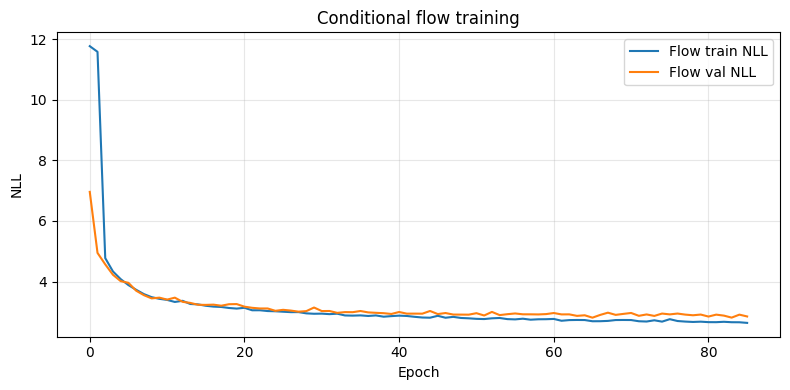

In [ ]:
# 6) Optimization stabilizers
device = torch.device(
    "cuda" if torch.cuda.is_available() else
    "mps" if torch.backends.mps.is_available() else
    "cpu"
)
flow = flow.float().to(device)

train_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_tr), torch.from_numpy(C_tr)),
    batch_size=256, shuffle=True
)
val_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_va), torch.from_numpy(C_va)),
    batch_size=256, shuffle=False
)

optimizer = optim.Adam(flow.parameters(), lr=3e-4, weight_decay=1e-5)
max_epochs = 300
patience = 20
min_delta = 1e-4
grad_clip_norm = 5.0

best_state = None
best_val_nll = np.inf
best_epoch = 0
bad_epochs = 0
history = {"train_nll": [], "val_nll": []}

print(f"Device: {device}")
print(f"Flow-train size: {len(X_tr)} | Flow-val size: {len(X_va)}")
print("Training flow with early stopping...")

for epoch in range(1, max_epochs + 1):
    flow.train()
    train_sum, train_count = 0.0, 0

    for batch_z, batch_c in train_loader:
        batch_z, batch_c = batch_z.to(device), batch_c.to(device)
        optimizer.zero_grad(set_to_none=True)

        loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(flow.parameters(), max_norm=grad_clip_norm)
        optimizer.step()

        bs = batch_z.size(0)
        train_sum += loss.item() * bs
        train_count += bs

    train_nll = train_sum / max(train_count, 1)

    flow.eval()
    val_sum, val_count = 0.0, 0
    with torch.no_grad():
        for batch_z, batch_c in val_loader:
            batch_z, batch_c = batch_z.to(device), batch_c.to(device)
            val_loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
            bs = batch_z.size(0)
            val_sum += val_loss.item() * bs
            val_count += bs

    val_nll = val_sum / max(val_count, 1)

    history["train_nll"].append(train_nll)
    history["val_nll"].append(val_nll)

    if epoch == 1 or epoch % 10 == 0:
        print(f"Epoch {epoch:3d} | train NLL: {train_nll:.4f} | val NLL: {val_nll:.4f}")

    if val_nll < (best_val_nll - min_delta):
        best_val_nll = val_nll
        best_epoch = epoch
        best_state = copy.deepcopy(flow.state_dict())
        bad_epochs = 0
    else:
        bad_epochs += 1
        if bad_epochs >= patience:
            print(f"Early stop at epoch {epoch} | best epoch {best_epoch} | best val NLL {best_val_nll:.4f}")
            break

if best_state is not None:
    flow.load_state_dict(best_state)

print(f"Loaded best checkpoint from epoch {best_epoch} (val NLL={best_val_nll:.4f})")

plt.figure(figsize=(8, 4))
plt.plot(history["train_nll"], label="Flow train NLL")
plt.plot(history["val_nll"], label="Flow val NLL")
plt.xlabel("Epoch")
plt.ylabel("NLL")
plt.title("Conditional flow training")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

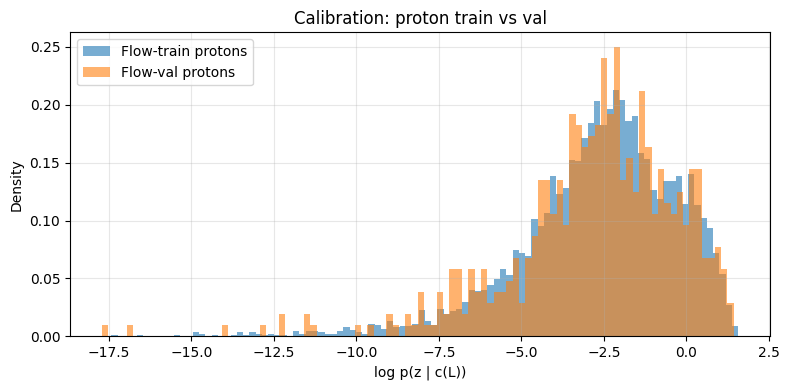

/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_79286/3728505696.py:46: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[0].boxplot(val_groups, labels=val_labels, showfliers=False)
/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_79286/3728505696.py:54: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[1].boxplot(ka_groups, labels=ka_labels, showfliers=False)


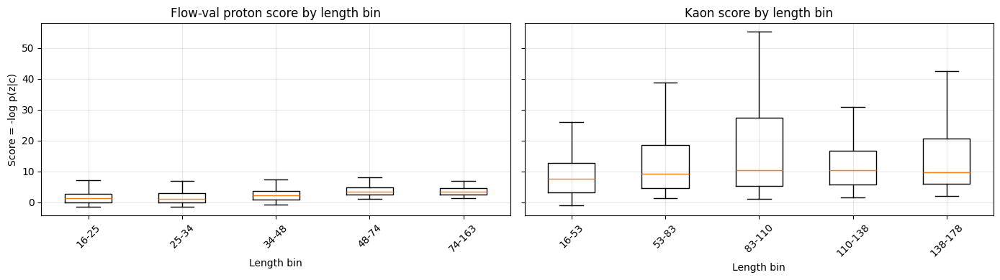

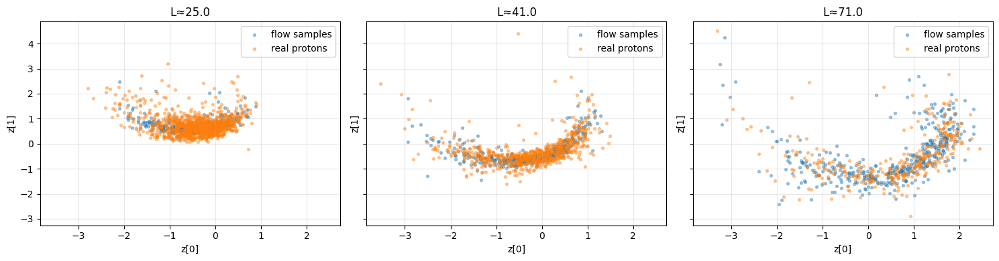

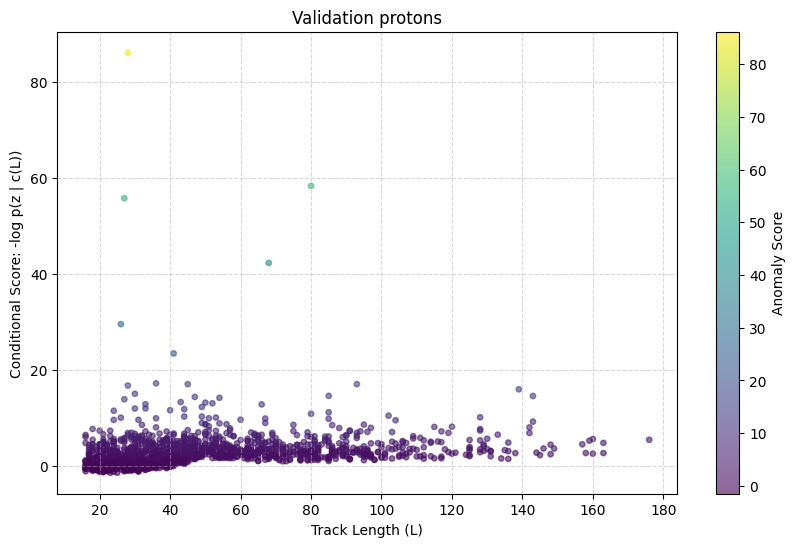

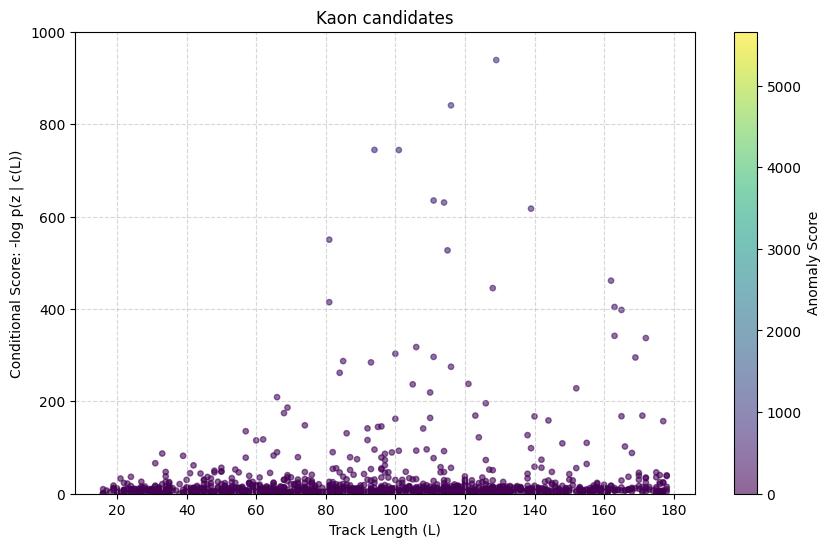

Top 10 most anomalous kaon indices:
[909 583 467 849 850 381 865  33 340 994]


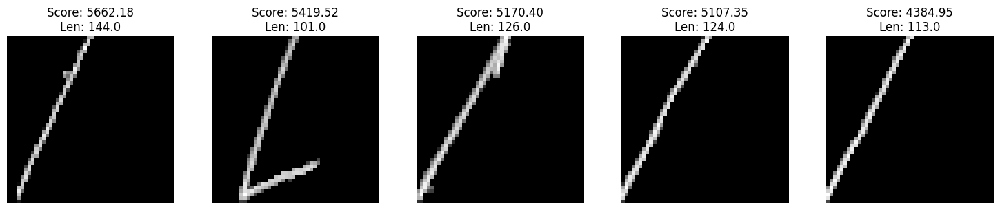

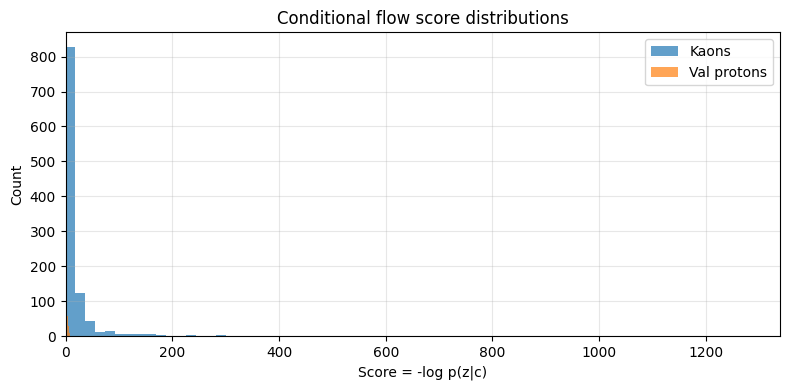

In [ ]:
# === Scoring + calibration checks ===
def flow_score(z_np, c_np):
    flow.eval()
    with torch.no_grad():
        z_t = torch.from_numpy(z_np.astype(np.float32)).to(device)
        c_t = torch.from_numpy(c_np.astype(np.float32)).to(device)
        logp = flow.log_prob(inputs=z_t, context=c_t).cpu().numpy()
    return -logp, logp  # score, log_prob

train_score, train_logp = flow_score(X_tr, C_tr)
val_score, val_logp = flow_score(X_va, C_va)
proton_score, proton_logp = flow_score(Z_all, C_z)  # unseen protons
kaon_score, kaon_logp = flow_score(Y_all, C_y)

# Calibration check 1: train vs val log_prob
plt.figure(figsize=(8, 4))
plt.hist(train_logp, bins=100, density=True, alpha=0.6, label="Flow-train protons")
plt.hist(val_logp, bins=100, density=True, alpha=0.6, label="Flow-val protons")
plt.xlabel("log p(z | c(L))")
plt.ylabel("Density")
plt.title("Calibration: proton train vs val")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Calibration check 2: score stability across length bins
def bin_groups(lengths, scores, quantiles=(0, 0.2, 0.4, 0.6, 0.8, 1.0), min_count=10):
    edges = np.quantile(lengths, quantiles)
    edges = np.unique(edges)
    groups, labels = [], []
    for i in range(len(edges) - 1):
        lo, hi = edges[i], edges[i + 1]
        m = (lengths >= lo) & ((lengths < hi) if i < len(edges) - 2 else (lengths <= hi))
        if m.sum() >= min_count:
            groups.append(scores[m])
            labels.append(f"{lo:.0f}-{hi:.0f}")
    return groups, labels

val_groups, val_labels = bin_groups(L_va_raw, val_score)
ka_groups, ka_labels = bin_groups(Ly_raw, kaon_score)

fig, ax = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

if len(val_groups) > 0:
    ax[0].boxplot(val_groups, labels=val_labels, showfliers=False)
ax[0].set_title("Flow-val proton score by length bin")
ax[0].set_xlabel("Length bin")
ax[0].set_ylabel("Score = -log p(z|c)")
ax[0].tick_params(axis="x", rotation=45)
ax[0].grid(alpha=0.3)

if len(ka_groups) > 0:
    ax[1].boxplot(ka_groups, labels=ka_labels, showfliers=False)
ax[1].set_title("Kaon score by length bin")
ax[1].set_xlabel("Length bin")
ax[1].tick_params(axis="x", rotation=45)
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Calibration check 3: conditional samples vs real protons (2D projection)
def context_from_lengths(L_raw):
    C = make_context(L_raw, L_mean, L_std)
    C = (C - c_mean) / c_std
    return C.astype(np.float32)

anchors = np.quantile(Lx_raw, [0.2, 0.5, 0.8]).astype(np.float32)
fig, axes = plt.subplots(1, len(anchors), figsize=(5 * len(anchors), 4), sharex=True, sharey=True)

for ax, L0 in zip(np.atleast_1d(axes), anchors):
    c0 = context_from_lengths(np.array([L0], dtype=np.float32))
    with torch.no_grad():
        z_samp = flow.sample(num_samples=400, context=torch.from_numpy(c0).to(device)).cpu().numpy()
    if z_samp.ndim == 3:
        z_samp = z_samp[0]  # [1, n, d] -> [n, d]

    mask = np.abs(Lx_raw - L0) <= max(3.0, 0.15 * L_std)
    z_real = X_all[mask]

    ax.scatter(z_samp[:, 0], z_samp[:, 1], s=8, alpha=0.4, label="flow samples")
    if len(z_real) > 0:
        ax.scatter(z_real[:, 0], z_real[:, 1], s=8, alpha=0.4, label="real protons")
    ax.set_title(f"L≈{L0:.1f}")
    ax.set_xlabel("z[0]")
    ax.set_ylabel("z[1]")
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()


# === Output views (same style as your current notebook) ===
plt.figure(figsize=(10, 6))
plt.scatter(Lz_raw, proton_score, alpha=0.6, s=15, c=proton_score, cmap="viridis")
plt.colorbar(label="Anomaly Score")
plt.xlabel("Track Length (L)")
plt.ylabel("Conditional Score: -log p(z | c(L))")
plt.title("Validation protons")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(Ly_raw, kaon_score, alpha=0.6, s=15, c=kaon_score, cmap="viridis")
plt.colorbar(label="Anomaly Score")
plt.xlabel("Track Length (L)")
plt.ylabel("Conditional Score: -log p(z | c(L))")
plt.title("Kaon candidates")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(0, 1000)
plt.show()

top_kaon_idx = np.argsort(kaon_score)[::-1]  # highest = most non-proton-like
print("Top 10 most anomalous kaon indices:")
print(top_kaon_idx[:10])

fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i, ax in enumerate(axes):
    idx = top_kaon_idx[i]
    img = k[idx, 0].cpu().numpy() if torch.is_tensor(k) else k[idx, 0]
    ax.imshow(img, cmap="gray")
    ax.set_title(f"Score: {kaon_score[idx]:.2f}\nLen: {Ly_raw[idx]:.1f}")
    ax.axis("off")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.hist(kaon_score, bins=300, alpha=0.7, label="Kaons")
plt.hist(proton_score, bins=300, alpha=0.7, label="Val protons")
plt.xlim(0, np.percentile(np.concatenate([kaon_score, proton_score]), 99.5))
plt.xlabel("Score = -log p(z|c)")
plt.ylabel("Count")
plt.title("Conditional flow score distributions")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

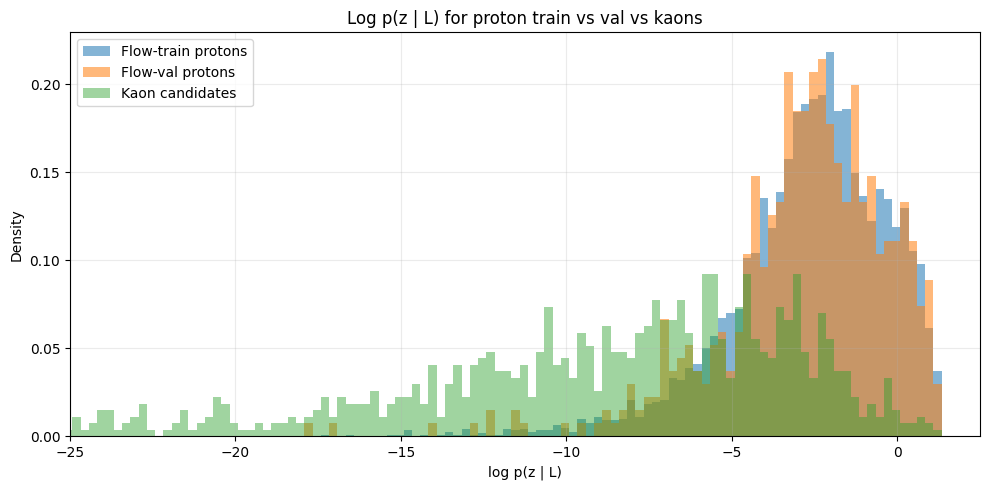

In [ ]:
plt.figure(figsize=(10, 5))

all_logp = np.concatenate([train_logp, val_logp, kaon_logp])
lo, hi = np.percentile(all_logp, [0.2, 99.8])   # robust plotting range
bins = np.linspace(lo, hi, 5000)

plt.hist(train_logp, bins=bins, density=True, alpha=0.55, label="Flow-train protons")
plt.hist(val_logp,   bins=bins, density=True, alpha=0.55, label="Flow-val protons")
plt.hist(kaon_logp,  bins=bins, density=True, alpha=0.45, label="Kaon candidates")

plt.xlabel("log p(z | L)")
plt.ylabel("Density")
plt.title("Log p(z | L) for proton train vs val vs kaons")
plt.xlim(-25, 2.5)
plt.grid(alpha=0.25)
plt.legend()
plt.tight_layout()
plt.show()

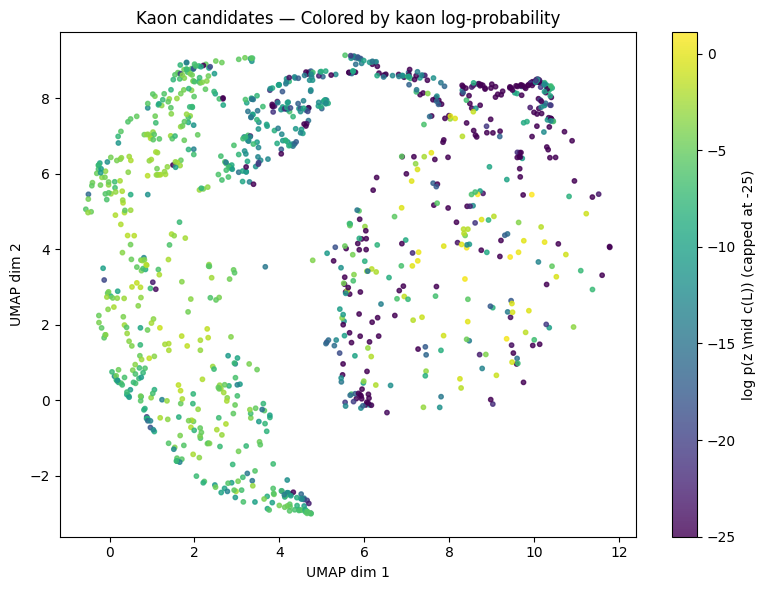

In [ ]:
fig = plt.figure(figsize=(8, 6))

values = np.asarray(kaon_logp, dtype=np.float32).reshape(-1)
values = np.maximum(values, -25)   # cap lower tail at -25

sc = plt.scatter(
    E_d[:, 0], E_d[:, 1],
    c=values,
    cmap="viridis",
    s=10,
    alpha=0.8,
    vmin=-25
)

cbar = plt.colorbar(sc)
cbar.set_label(r"log p(z \mid c(L)) (capped at -25)")

plt.title("Kaon candidates — Colored by kaon log-probability")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_fscore_support, confusion_matrix

# Inputs expected from your notebook:
# train_logp, val_logp, kaon_logp

proton_logp = np.concatenate([train_logp, val_logp])
all_logp = np.concatenate([train_logp, val_logp, kaon_logp])

# Labels: 0 = proton, 1 = kaon
y_true = np.concatenate([
    np.zeros(len(proton_logp), dtype=np.int32),
    np.ones(len(kaon_logp), dtype=np.int32)
])

# Use NLL so larger values mean "more kaon-like"
nll = -np.concatenate([proton_logp, kaon_logp])

# ROC-based threshold (Youden's J = TPR - FPR)
fpr, tpr, thr_nll = roc_curve(y_true, nll, pos_label=1)
J = tpr - fpr
best_idx = np.argmax(J[1:]) + 1  # skip first inf threshold

best_thr_nll = thr_nll[best_idx]
best_thr_logp = -best_thr_nll

# Predict kaon if NLL >= threshold (equiv: logp <= best_thr_logp)
y_pred = (nll >= best_thr_nll).astype(np.int32)

tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average="binary", zero_division=0
)
auc = roc_auc_score(y_true, nll)

print(f"Best threshold on log p(z|c(L)): {best_thr_logp:.6f}")
print(f"Equivalent threshold on NLL:      {best_thr_nll:.6f}")
print(f"TPR (recall): {recall:.4f}")
print(f"FPR:          {fp / (fp + tn):.4f}")
print(f"Precision:    {precision:.4f}")
print(f"F1:           {f1:.4f}")
print(f"ROC AUC:      {auc:.4f}")
print(f"Confusion matrix [[TN, FP], [FN, TP]] = [[{tn}, {fp}], [{fn}, {tp}]]")


Best threshold on log p(z|c(L)): -5.415166
Equivalent threshold on NLL:      5.415166
TPR (recall): 0.7382
FPR:          0.1146
Precision:    0.5666
F1:           0.6411
ROC AUC:      0.8804
Confusion matrix [[TN, FP], [FN, TP]] = [[4800, 621], [288, 812]]


Kaons above threshold: 812 / 1100
Kaons below threshold: 288 / 1100


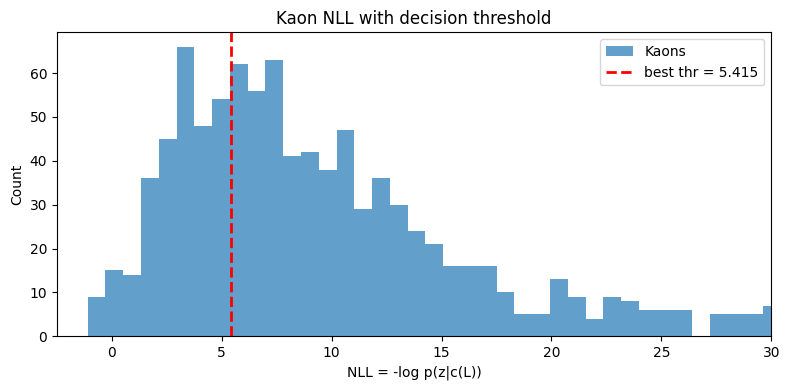

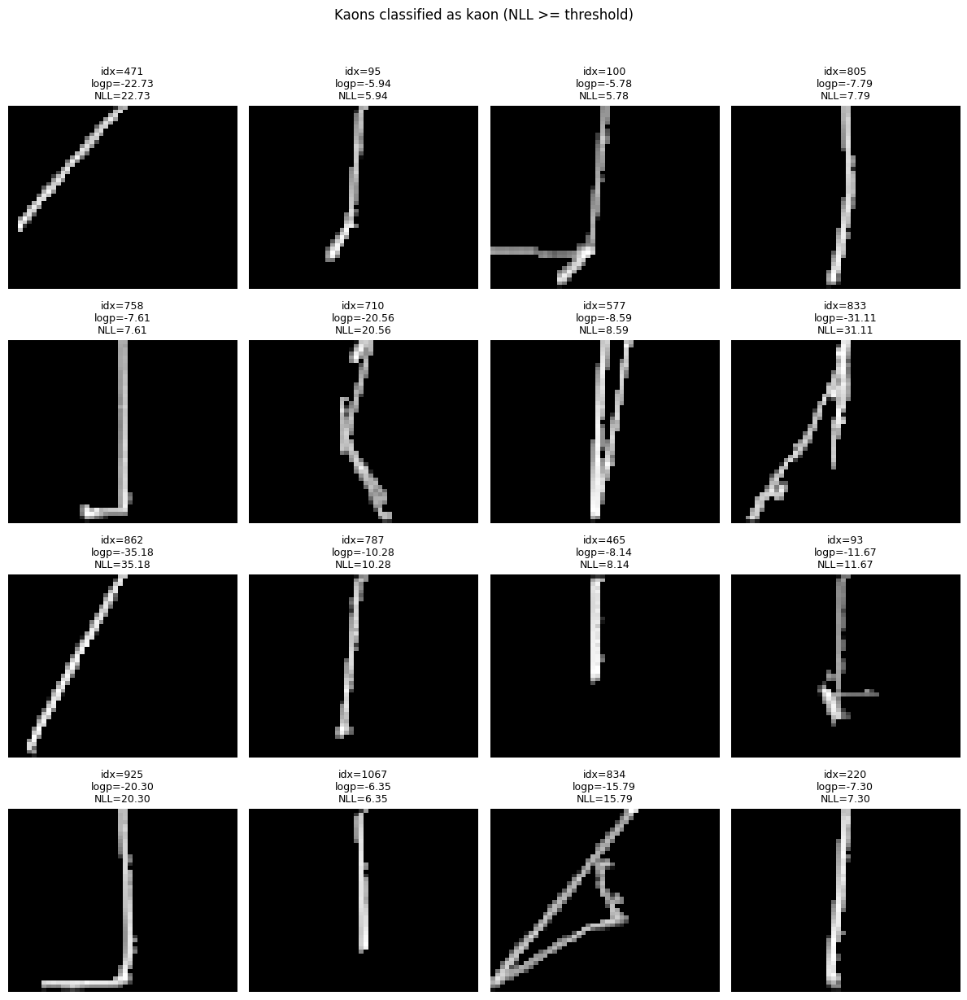

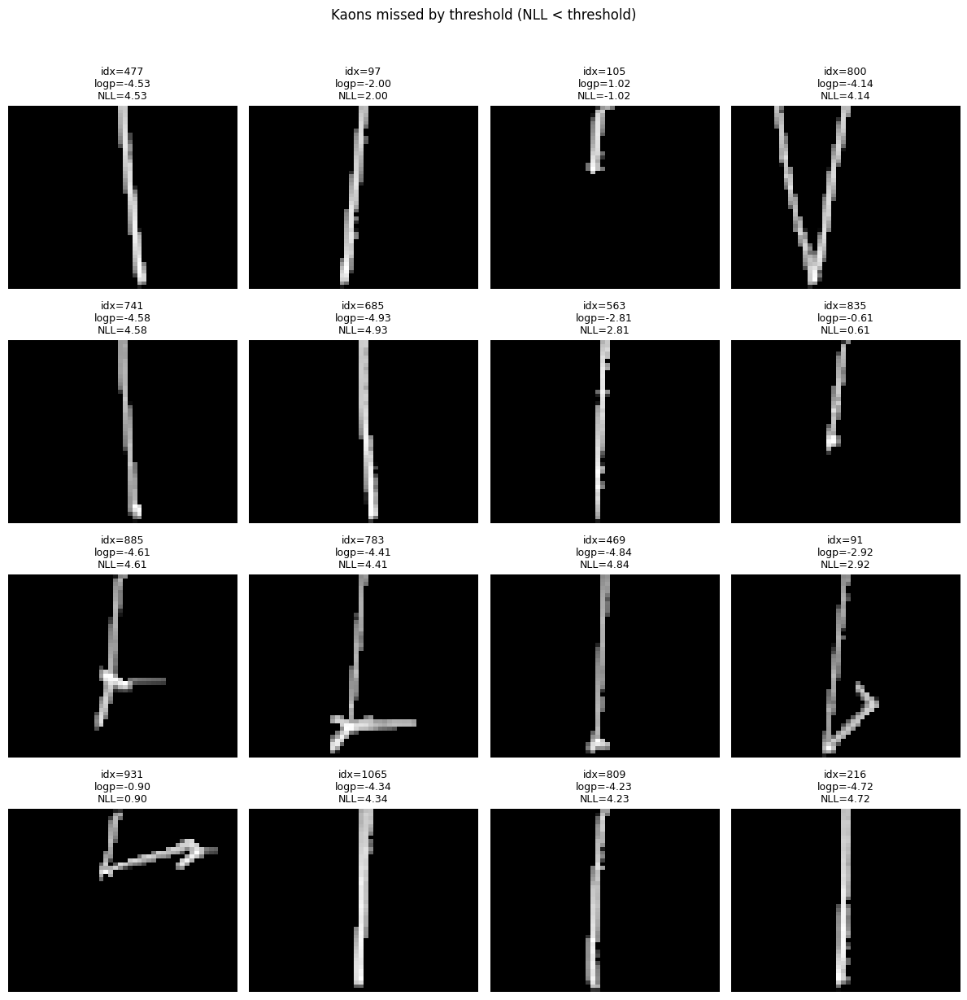

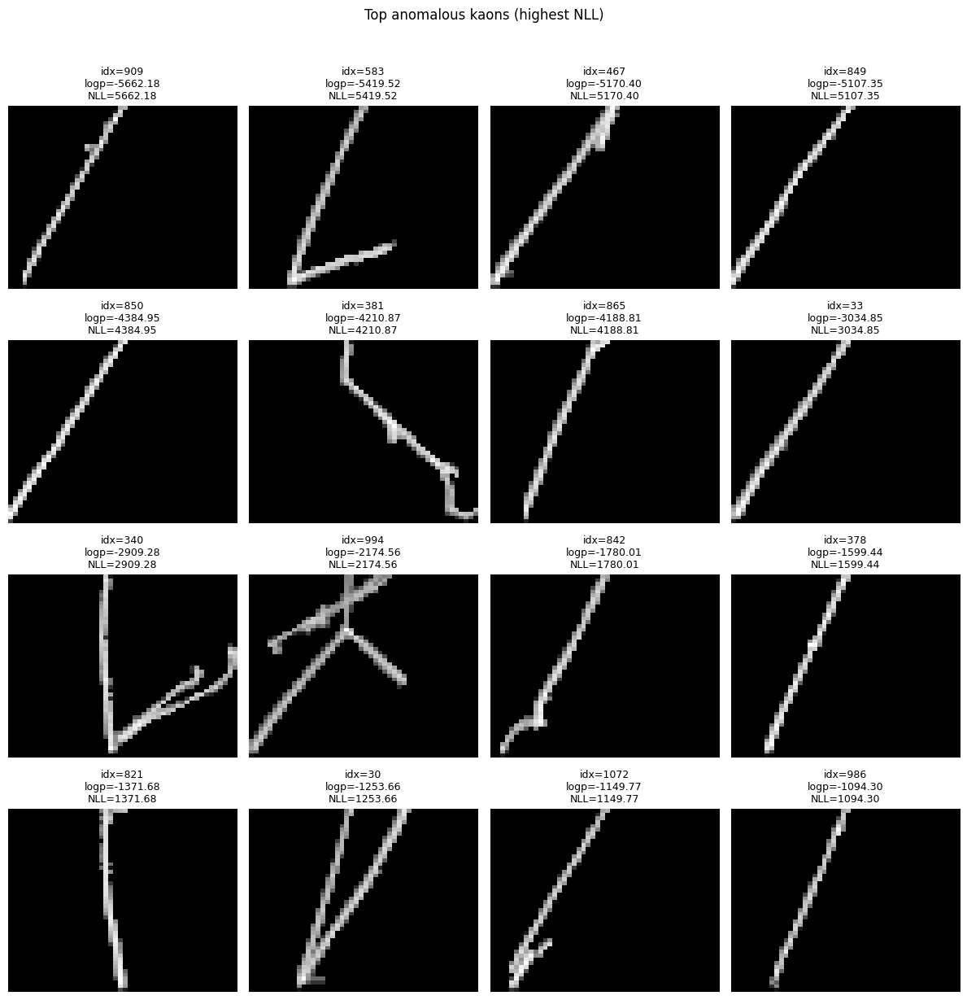

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# kaon scores
nll_kaon = -kaon_logp
idx_above = np.where(nll_kaon >= best_thr_nll)[0]   # classified as kaon
idx_below = np.where(nll_kaon <  best_thr_nll)[0]   # missed by threshold

print(f"Kaons above threshold: {len(idx_above)} / {len(nll_kaon)}")
print(f"Kaons below threshold: {len(idx_below)} / {len(nll_kaon)}")

# Optional: show threshold on NLL histogram
plt.figure(figsize=(8, 4))
plt.hist(nll_kaon, bins=7000, alpha=0.7, label="Kaons")
plt.axvline(best_thr_nll, color="red", ls="--", lw=2, label=f"best thr = {best_thr_nll:.3f}")
plt.xlabel("NLL = -log p(z|c(L))")
plt.ylabel("Count")
plt.title("Kaon NLL with decision threshold")
plt.xlim(-2.5, 30)
plt.legend()
plt.tight_layout()
plt.show()

k_np = k.cpu().numpy() if torch.is_tensor(k) else np.asarray(k)

def show_kaon_grid(indices, title, n_show=16, channel=0, seed=42):
    if len(indices) == 0:
        print(f"No samples for: {title}")
        return

    rng = np.random.default_rng(seed)
    pick = indices if len(indices) <= n_show else rng.choice(indices, size=n_show, replace=False)

    ncols = 4
    nrows = int(np.ceil(len(pick) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
    axes = np.atleast_1d(axes).ravel()

    for ax, idx in zip(axes, pick):
        ax.imshow(k_np[idx, channel], cmap="gray", aspect="auto")
        ax.set_title(f"idx={idx}\nlogp={kaon_logp[idx]:.2f}\nNLL={-kaon_logp[idx]:.2f}", fontsize=9)
        ax.axis("off")

    for ax in axes[len(pick):]:
        ax.axis("off")

    fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()

# Random kaons that pass/fail threshold
show_kaon_grid(idx_above, "Kaons classified as kaon (NLL >= threshold)", n_show=16, channel=0)
show_kaon_grid(idx_below, "Kaons missed by threshold (NLL < threshold)", n_show=16, channel=0)

# Top most anomalous kaons
top_idx = np.argsort(nll_kaon)[::-1][:16]
show_kaon_grid(top_idx, "Top anomalous kaons (highest NLL)", n_show=16, channel=0)


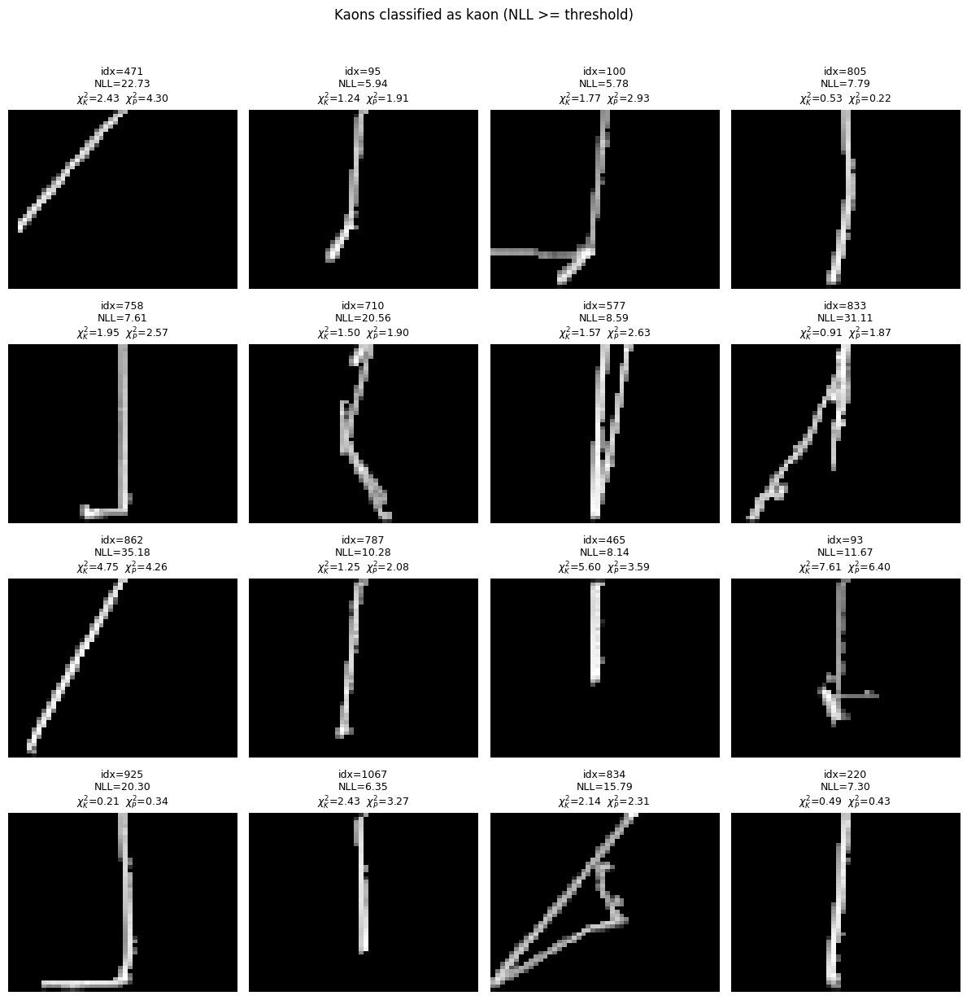

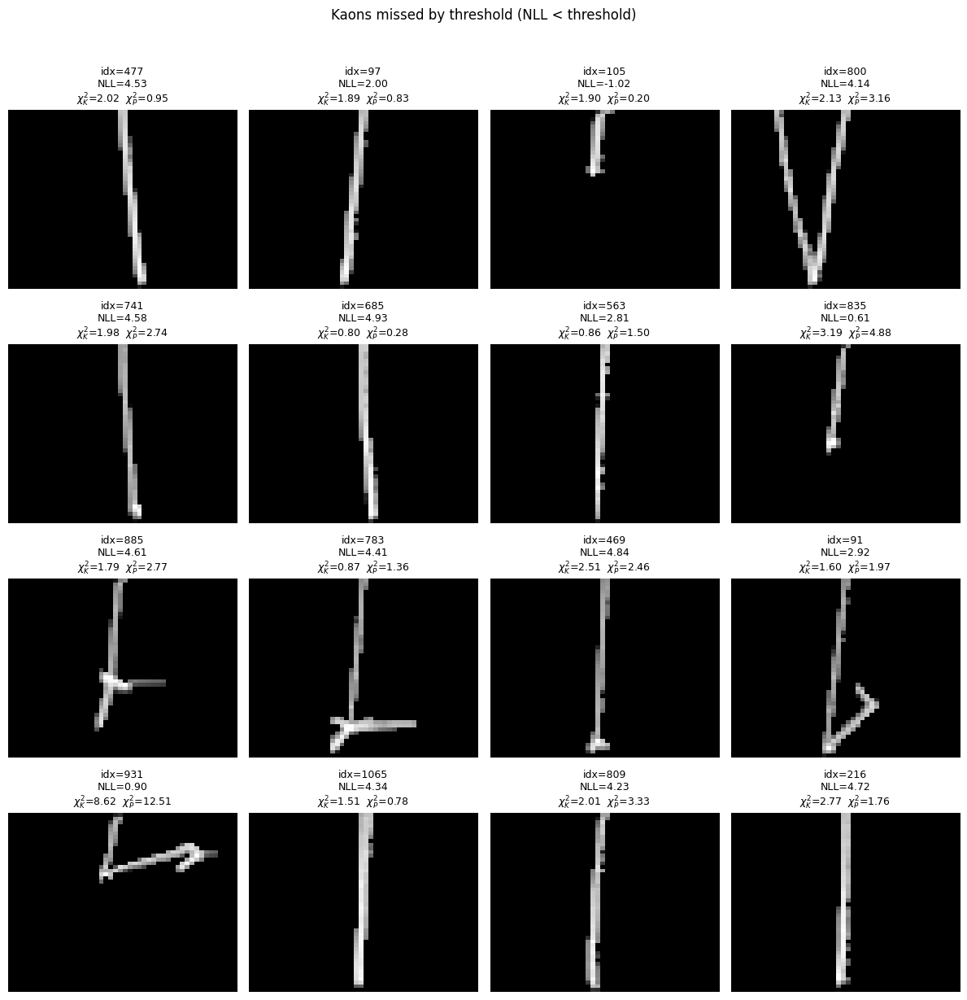

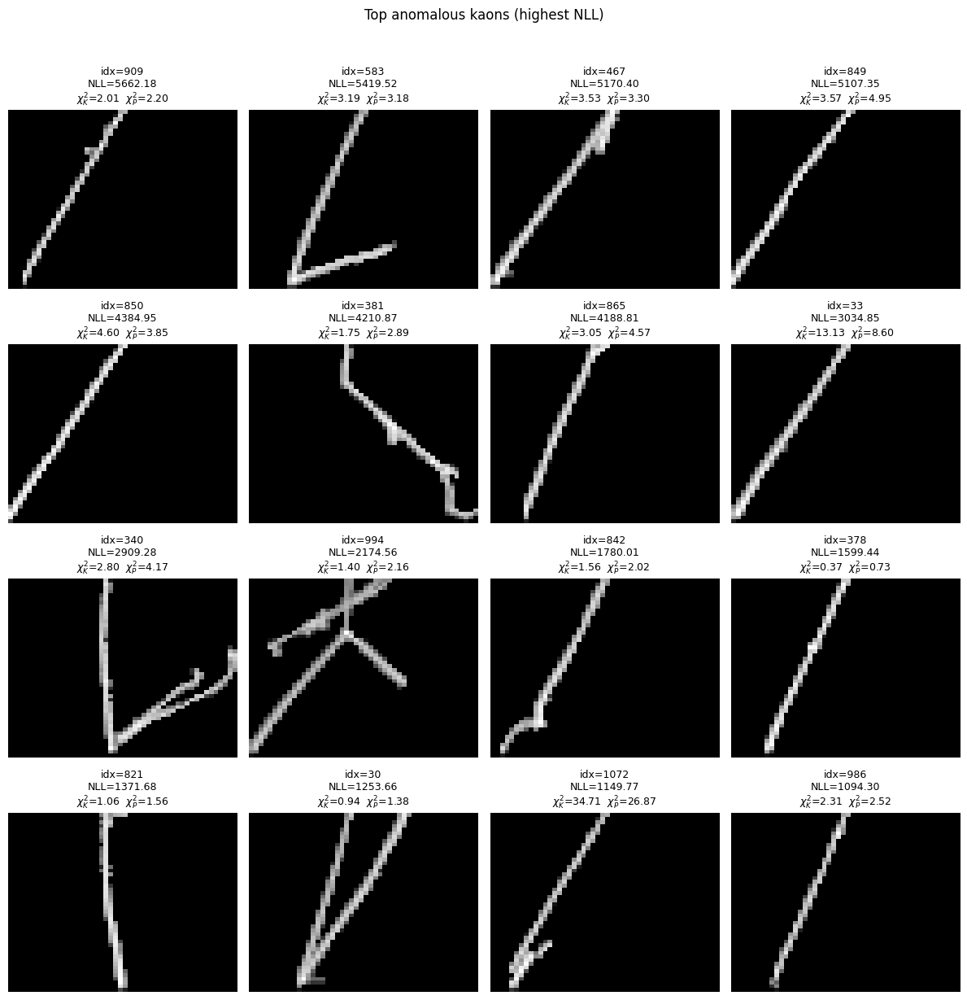

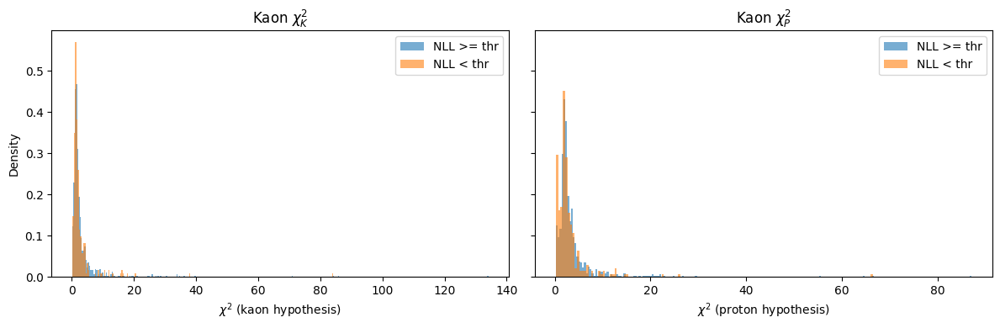

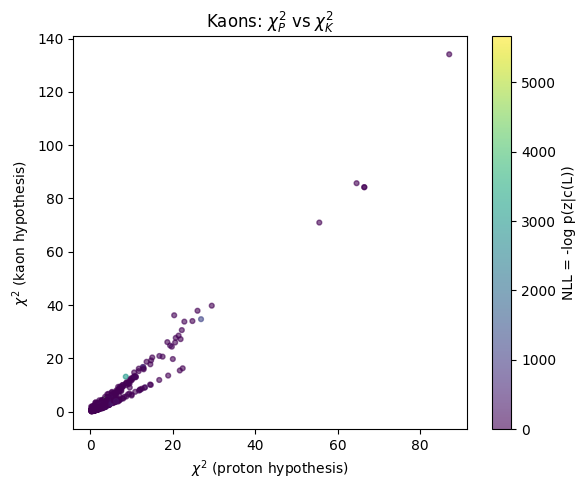

In [ ]:
# --- Add both chi2 scores (kaon + proton hypothesis) to kaon displays/plots ---

# Keep indices aligned with kaon_logp / k
kaons = kaons.reset_index(drop=True)
chi2_k = kaons["chi_squared_kaon"].to_numpy()
chi2_p = kaons["chi_squared_proton"].to_numpy()

# Expected from earlier cells:
# nll_kaon = -kaon_logp
# idx_above = np.where(nll_kaon >= best_thr_nll)[0]
# idx_below = np.where(nll_kaon <  best_thr_nll)[0]
# top_idx = np.argsort(nll_kaon)[::-1][:16]
# k_np = k.cpu().numpy() if torch.is_tensor(k) else np.asarray(k)

def show_kaon_grid(indices, title, n_show=16, channel=0, seed=42):
    if len(indices) == 0:
        print(f"No samples for: {title}")
        return

    rng = np.random.default_rng(seed)
    pick = indices if len(indices) <= n_show else rng.choice(indices, size=n_show, replace=False)

    ncols = 4
    nrows = int(np.ceil(len(pick) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
    axes = np.atleast_1d(axes).ravel()

    for ax, idx in zip(axes, pick):
        ax.imshow(k_np[idx, channel], cmap="gray", aspect="auto")
        ax.set_title(
            f"idx={idx}\n"
            f"NLL={nll_kaon[idx]:.2f}\n"
            f"$\\chi^2_K$={chi2_k[idx]:.2f}  $\\chi^2_P$={chi2_p[idx]:.2f}",
            fontsize=9
        )
        ax.axis("off")

    for ax in axes[len(pick):]:
        ax.axis("off")

    fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()

show_kaon_grid(idx_above, "Kaons classified as kaon (NLL >= threshold)", n_show=16, channel=0)
show_kaon_grid(idx_below, "Kaons missed by threshold (NLL < threshold)", n_show=16, channel=0)
show_kaon_grid(top_idx, "Top anomalous kaons (highest NLL)", n_show=16, channel=0)

# --- Distribution comparison for both chi2 hypotheses ---
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

ax[0].hist(chi2_k[idx_above], bins='auto', alpha=0.6, density=True, label="NLL >= thr")
ax[0].hist(chi2_k[idx_below], bins='auto', alpha=0.6, density=True, label="NLL < thr")
ax[0].set_xlabel(r"$\chi^2$ (kaon hypothesis)")
ax[0].set_ylabel("Density")
ax[0].set_title(r"Kaon $\chi^2_K$")
ax[0].legend()

ax[1].hist(chi2_p[idx_above], bins='auto', alpha=0.6, density=True, label="NLL >= thr")
ax[1].hist(chi2_p[idx_below], bins='auto', alpha=0.6, density=True, label="NLL < thr")
ax[1].set_xlabel(r"$\chi^2$ (proton hypothesis)")
ax[1].set_title(r"Kaon $\chi^2_P$")
ax[1].legend()

plt.tight_layout()
plt.show()

# --- Joint chi2 view (all kaons), colored by NLL ---
plt.figure(figsize=(6, 5))
sc = plt.scatter(chi2_p, chi2_k, c=nll_kaon, s=12, alpha=0.6, cmap="viridis")
plt.colorbar(sc, label="NLL = -log p(z|c(L))")
plt.xlabel(r"$\chi^2$ (proton hypothesis)")
plt.ylabel(r"$\chi^2$ (kaon hypothesis)")
plt.title(r"Kaons: $\chi^2_P$ vs $\chi^2_K$")
plt.tight_layout()
plt.show()

Below threshold: n=288, mean=86.76, std=43.51
Above threshold: n=812, mean=98.87, std=42.39


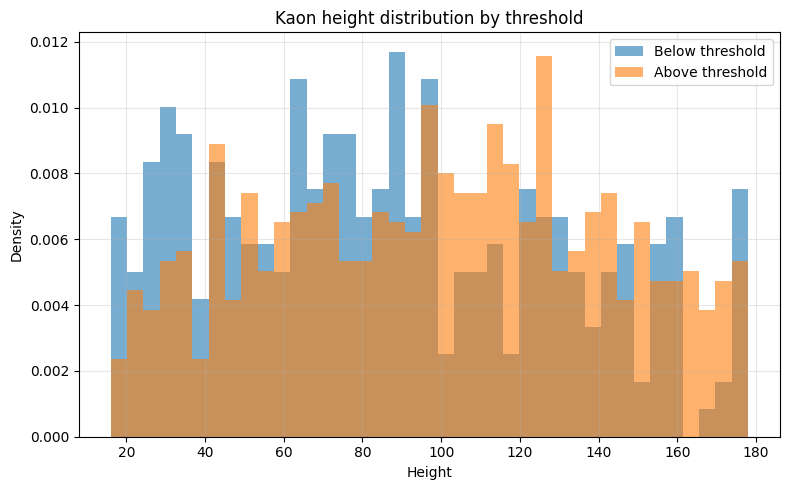

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

kaons = kaons.reset_index(drop=True)

heights = kaons["height"].to_numpy(dtype=np.float32)
nll_kaon = np.asarray(kaon_score, dtype=np.float32).reshape(-1)
thr = best_thr_nll  # or thr_nll

mask_below = nll_kaon < thr
mask_above = nll_kaon >= thr

h_below = heights[mask_below]
h_above = heights[mask_above]

print(f"Below threshold: n={len(h_below)}, mean={h_below.mean():.2f}, std={h_below.std(ddof=1):.2f}")
print(f"Above threshold: n={len(h_above)}, mean={h_above.mean():.2f}, std={h_above.std(ddof=1):.2f}")

bins = np.linspace(heights.min(), heights.max(), 40)

plt.figure(figsize=(8, 5))
plt.hist(h_below, bins=bins, alpha=0.6, density=True, label="Below threshold")
plt.hist(h_above, bins=bins, alpha=0.6, density=True, label="Above threshold")
plt.xlabel("Height")
plt.ylabel("Density")
plt.title("Kaon height distribution by threshold")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
# aligned arrays
chi2_k = kaons["chi_squared_kaon"].to_numpy(dtype=np.float32)
chi2_p = kaons["chi_squared_proton"].to_numpy(dtype=np.float32)
nll_kaon = np.asarray(kaon_score, dtype=np.float32).reshape(-1)  # or use your chosen score array

# threshold
thr = best_thr_nll  # or thr_nll

# groups
mask_below = nll_kaon < thr
mask_above = nll_kaon >= thr

# condition: proton hypothesis chi2 is smaller than kaon hypothesis chi2
p_lt_k = chi2_p < chi2_k

# percentages within each group
pct_below = 100 * p_lt_k[mask_below].mean() if mask_below.any() else np.nan
pct_above = 100 * p_lt_k[mask_above].mean() if mask_above.any() else np.nan

print(f"Below threshold: {p_lt_k[mask_below].sum()}/{mask_below.sum()} = {pct_below:.2f}% have chi2_p < chi2_k")
print(f"Above threshold: {p_lt_k[mask_above].sum()}/{mask_above.sum()} = {pct_above:.2f}% have chi2_p < chi2_k")


Below threshold: 85/288 = 29.51% have chi2_p < chi2_k
Above threshold: 190/812 = 23.40% have chi2_p < chi2_k


In [ ]:
chi2_k = kaons["chi_squared_kaon"].to_numpy(dtype=np.float32)
chi2_p = kaons["chi_squared_proton"].to_numpy(dtype=np.float32)
nll_kaon = np.asarray(kaon_score, dtype=np.float32).reshape(-1)

thr = best_thr_nll  # or thr_nll

mask_below = nll_kaon < thr
mask_above = nll_kaon >= thr

for label, mask in [("Below threshold", mask_below), ("Above threshold", mask_above)]:
    chi2k_grp = chi2_k[mask]
    chi2p_grp = chi2_p[mask]

    print(
        f"{label}: "
        f"n={mask.sum()} | "
        f"chi2_k mean={chi2k_grp.mean():.3f}, std={chi2k_grp.std(ddof=1):.3f} | "
        f"chi2_p mean={chi2p_grp.mean():.3f}, std={chi2p_grp.std(ddof=1):.3f}"
    )


Below threshold: n=288 | chi2_k mean=2.797, std=5.987 | chi2_p mean=3.015, std=4.804
Above threshold: n=812 | chi2_k mean=3.536, std=7.961 | chi2_p mean=3.733, std=5.830


What are the failure modes of kaon reconstruction? And there for the chi-2?

**checking on mass**

In [ ]:
KAON_MASS = 493
PROTON_MASS = 938

Below threshold: n=288, mean=517.65, std=76.27
Above threshold: n=812, mean=490.39, std=60.54


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_79286/4080555874.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


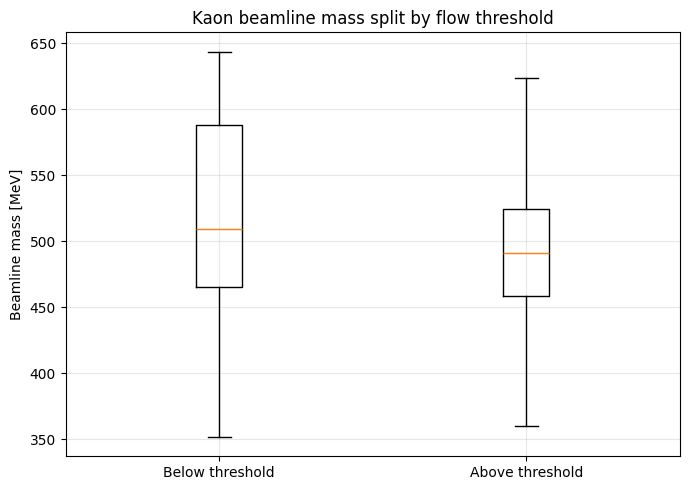

In [ ]:
kaons = kaons.reset_index(drop=True)

beam_mass = kaons["beamline_mass"].to_numpy(dtype=np.float32)
nll_kaon = np.asarray(kaon_score, dtype=np.float32).reshape(-1)
thr = best_thr_nll   # or thr_nll

assert len(beam_mass) == len(nll_kaon)

mask_below = nll_kaon < thr
mask_above = nll_kaon >= thr

mass_below = beam_mass[mask_below]
mass_above = beam_mass[mask_above]

print(f"Below threshold: n={len(mass_below)}, mean={mass_below.mean():.2f}, std={mass_below.std():.2f}")
print(f"Above threshold: n={len(mass_above)}, mean={mass_above.mean():.2f}, std={mass_above.std():.2f}")

plt.figure(figsize=(7, 5))
plt.boxplot(
    [mass_below, mass_above],
    labels=["Below threshold", "Above threshold"],
    showfliers=False
)
plt.ylabel("Beamline mass [MeV]")
plt.title("Kaon beamline mass split by flow threshold")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Below threshold: n=288 | RE mean=0.140593, std=0.155192
Above threshold: n=812 | RE mean=0.536474, std=0.339349


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_79286/2594321406.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


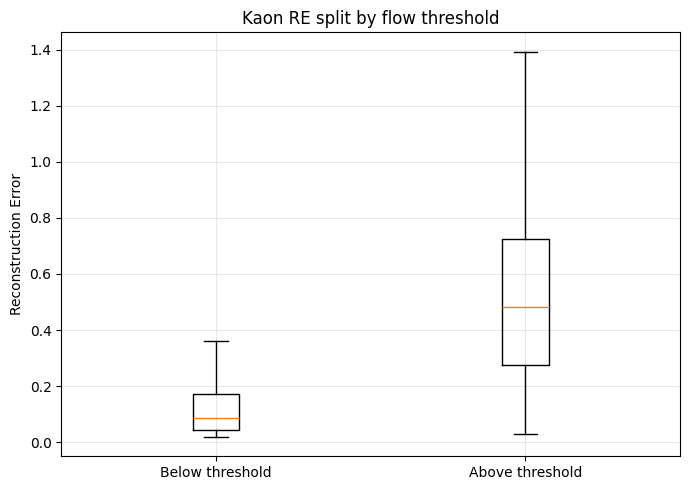

In [ ]:
RE = np.asarray(RE_per_sample_k, dtype=np.float32).reshape(-1)
nll_kaon = np.asarray(kaon_score, dtype=np.float32).reshape(-1)

thr = best_thr_nll  # or thr_nll

mask_below = nll_kaon < thr
mask_above = nll_kaon >= thr

for label, mask in [("Below threshold", mask_below), ("Above threshold", mask_above)]:
    re_grp = RE[mask]
    print(
        f"{label}: "
        f"n={mask.sum()} | "
        f"RE mean={re_grp.mean():.6f}, std={re_grp.std(ddof=1):.6f}"
    )

re_below = RE[mask_below]
re_above = RE[mask_above]

plt.figure(figsize=(7, 5))
plt.boxplot(
    [re_below, re_above],
    labels=["Below threshold", "Above threshold"],
    showfliers=False
)
plt.ylabel("Reconstruction Error")
plt.title("Kaon RE split by flow threshold")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# Validation proton table aligned with proton_score / RE_per_sample_val
val_protons = protons.iloc[val_idx].reset_index(drop=True)

# Arrays aligned to validation protons
nll_val = np.asarray(proton_score, dtype=np.float32).reshape(-1)
RE_val = np.asarray(RE_per_sample_val, dtype=np.float32).reshape(-1)

mass_val = val_protons["beamline_mass"].to_numpy(dtype=np.float32)
chi2k_val = val_protons["chi_squared_kaon"].to_numpy(dtype=np.float32)
chi2p_val = val_protons["chi_squared_proton"].to_numpy(dtype=np.float32)

thr = best_thr_nll  # or thr_nll

assert len(val_protons) == len(nll_val) == len(RE_val) == len(mass_val) == len(chi2k_val) == len(chi2p_val)

mask_below = nll_val < thr
mask_above = nll_val >= thr

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    return x.mean(), x.std(ddof=1)

rows = []
for label, mask in [("Below threshold", mask_below), ("Above threshold", mask_above)]:
    m_mean, m_std = mean_std(mass_val[mask])
    k_mean, k_std = mean_std(chi2k_val[mask])
    p_mean, p_std = mean_std(chi2p_val[mask])
    r_mean, r_std = mean_std(RE_val[mask])

    rows.append({
        "group": label,
        "n": int(mask.sum()),
        "mass_mean": m_mean,
        "mass_std": m_std,
        "chi2_k_mean": k_mean,
        "chi2_k_std": k_std,
        "chi2_p_mean": p_mean,
        "chi2_p_std": p_std,
        "RE_mean": r_mean,
        "RE_std": r_std,
    })

summary = pd.DataFrame(rows)

for _, row in summary.iterrows():
    print(
        f"{row['group']}: n={row['n']} | "
        f"mass={row['mass_mean']:.2f} ± {row['mass_std']:.2f} | "
        f"chi2_k={row['chi2_k_mean']:.3f} ± {row['chi2_k_std']:.3f} | "
        f"chi2_p={row['chi2_p_mean']:.3f} ± {row['chi2_p_std']:.3f} | "
        f"RE={row['RE_mean']:.6f} ± {row['RE_std']:.6f}"
    )
print(f"{(summary['n'].iloc[1])/(summary['n'].iloc[0] + summary['n'].iloc[1]) * 100:.2f} % are above threshold")

summary

Below threshold: n=1183 | mass=934.13 ± 66.25 | chi2_k=2.035 ± 2.302 | chi2_p=1.790 ± 2.747 | RE=0.040883 ± 0.022824
Above threshold: n=173 | mass=936.47 ± 58.72 | chi2_k=2.339 ± 1.763 | chi2_p=1.687 ± 1.770 | RE=0.109855 ± 0.099180
12.76 % are above threshold


,group,n,mass_mean,mass_std,chi2_k_mean,chi2_k_std,chi2_p_mean,chi2_p_std,RE_mean,RE_std
0,Below threshold,1183,934.130371,66.250336,2.034528,2.301665,1.790450,2.746644,0.040883,0.022824
1,Above threshold,173,936.470032,58.720173,2.339141,1.763041,1.687002,1.769656,0.109855,0.099180


In [ ]:
# === Conditional SPLINE flow with early stopping, latent/context standardization, permutations ===
import copy
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch import optim
from torch.utils.data import TensorDataset, DataLoader
from nflows import transforms, distributions, flows

np.random.seed(42)
torch.manual_seed(42)

# 0) Use encoder mean latents (mu) for stability
X_mu = np.asarray(latent_vectors, dtype=np.float32)       # proton latents (VAE-train split)
Z_mu = np.asarray(latent_vectors_val, dtype=np.float32)   # proton latents (VAE-val split)
Y_mu = np.asarray(latent_vectors_k, dtype=np.float32)     # kaon latents

Lx_raw = protons.iloc[train_idx]["height"].to_numpy(dtype=np.float32)
Lz_raw = protons.iloc[val_idx]["height"].to_numpy(dtype=np.float32)
Ly_raw = kaons["height"].to_numpy(dtype=np.float32)

assert len(X_mu) == len(Lx_raw)
assert len(Z_mu) == len(Lz_raw)
assert len(Y_mu) == len(Ly_raw)

# 1) Standardize latent dimensions using X only
z_mean = X_mu.mean(axis=0, keepdims=True)
z_std = X_mu.std(axis=0, keepdims=True) + 1e-6

X_all = (X_mu - z_mean) / z_std
Z_all = (Z_mu - z_mean) / z_std
Y_all = (Y_mu - z_mean) / z_std

# 2) Proper flow train/val split on proton set + early stopping target
idx = np.arange(len(X_all))
idx_tr, idx_va = train_test_split(idx, test_size=0.10, random_state=42, shuffle=True)

X_tr, X_va = X_all[idx_tr], X_all[idx_va]
L_tr_raw, L_va_raw = Lx_raw[idx_tr], Lx_raw[idx_va]

# 3) Rich nonlinear conditioning c(L) = [L_scaled, L_scaled^2, log(L+eps)]
def make_context(L_raw, L_mean, L_std, eps=1e-3):
    L_raw = np.asarray(L_raw, dtype=np.float32)
    L_scaled = (L_raw - L_mean) / (L_std + 1e-6)
    return np.stack([L_scaled, L_scaled**2, np.log(L_raw + eps)], axis=1).astype(np.float32)

# fit length stats on flow-train only
L_mean = float(L_tr_raw.mean())
L_std = float(L_tr_raw.std() + 1e-6)

C_tr = make_context(L_tr_raw, L_mean, L_std)
C_va = make_context(L_va_raw, L_mean, L_std)
C_x = make_context(Lx_raw, L_mean, L_std)
C_z = make_context(Lz_raw, L_mean, L_std)
C_y = make_context(Ly_raw, L_mean, L_std)

# standardize context dims using flow-train only
c_mean = C_tr.mean(axis=0, keepdims=True)
c_std = C_tr.std(axis=0, keepdims=True) + 1e-6

C_tr = (C_tr - c_mean) / c_std
C_va = (C_va - c_mean) / c_std
C_x = (C_x - c_mean) / c_std
C_z = (C_z - c_mean) / c_std
C_y = (C_y - c_mean) / c_std

# 4-5) Spline autoregressive transforms + permutations
latent_dim = X_tr.shape[1]        # should be 4
context_dim = C_tr.shape[1]       # 3
hidden_features = 128
num_transforms = 8                # usually enough with spline layers
num_bins = 16
tail_bound = 4.0

try:
    SplineAR = transforms.autoregressive.MaskedPiecewiseRationalQuadraticAutoregressiveTransform
except AttributeError:
    from nflows.transforms.autoregressive import (
        MaskedPiecewiseRationalQuadraticAutoregressiveTransform as SplineAR
    )

def build_spline_ar():
    # Keep kwargs minimal for compatibility across nflows versions.
    base_kwargs = dict(
        features=latent_dim,
        hidden_features=hidden_features,
        context_features=context_dim,
        num_bins=num_bins,
        tails="linear",
        tail_bound=tail_bound
    )
    try:
        return SplineAR(
            **base_kwargs,
            use_residual_blocks=True,
            num_blocks=2,
            dropout_probability=0.0
        )
    except TypeError:
        return SplineAR(**base_kwargs)

transform_list = []
for _ in range(num_transforms):
    transform_list.append(transforms.RandomPermutation(features=latent_dim))
    transform_list.append(build_spline_ar())

transform = transforms.CompositeTransform(transform_list)
flow = flows.Flow(transform, distributions.StandardNormal([latent_dim]))

# 6) Optimization stabilizers
device = torch.device(
    "cuda" if torch.cuda.is_available() else
    "mps" if torch.backends.mps.is_available() else
    "cpu"
)
flow = flow.float().to(device)

train_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_tr), torch.from_numpy(C_tr)),
    batch_size=256, shuffle=True
)
val_loader = DataLoader(
    TensorDataset(torch.from_numpy(X_va), torch.from_numpy(C_va)),
    batch_size=256, shuffle=False
)

optimizer = optim.Adam(flow.parameters(), lr=3e-4, weight_decay=1e-5)
max_epochs = 300
patience = 20
min_delta = 1e-4
grad_clip_norm = 5.0

best_state = None
best_val_nll = np.inf
best_epoch = 0
bad_epochs = 0
history = {"train_nll": [], "val_nll": []}

print(f"Device: {device}")
print(f"Flow-train size: {len(X_tr)} | Flow-val size: {len(X_va)}")
print(f"Flow family: Conditional spline autoregressive (RQS), transforms={num_transforms}, bins={num_bins}")
print("Training flow with early stopping...")

for epoch in range(1, max_epochs + 1):
    flow.train()
    train_sum, train_count = 0.0, 0

    for batch_z, batch_c in train_loader:
        batch_z, batch_c = batch_z.to(device), batch_c.to(device)
        optimizer.zero_grad(set_to_none=True)

        loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(flow.parameters(), max_norm=grad_clip_norm)
        optimizer.step()

        bs = batch_z.size(0)
        train_sum += loss.item() * bs
        train_count += bs

    train_nll = train_sum / max(train_count, 1)

    flow.eval()
    val_sum, val_count = 0.0, 0
    with torch.no_grad():
        for batch_z, batch_c in val_loader:
            batch_z, batch_c = batch_z.to(device), batch_c.to(device)
            val_loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
            bs = batch_z.size(0)
            val_sum += val_loss.item() * bs
            val_count += bs

    val_nll = val_sum / max(val_count, 1)

    history["train_nll"].append(train_nll)
    history["val_nll"].append(val_nll)

    if epoch == 1 or epoch % 10 == 0:
        print(f"Epoch {epoch:3d} | train NLL: {train_nll:.4f} | val NLL: {val_nll:.4f}")

    if val_nll < (best_val_nll - min_delta):
        best_val_nll = val_nll
        best_epoch = epoch
        best_state = copy.deepcopy(flow.state_dict())
        bad_epochs = 0
    else:
        bad_epochs += 1
        if bad_epochs >= patience:
            print(f"Early stop at epoch {epoch} | best epoch {best_epoch} | best val NLL {best_val_nll:.4f}")
            break

if best_state is not None:
    flow.load_state_dict(best_state)

print(f"Loaded best checkpoint from epoch {best_epoch} (val NLL={best_val_nll:.4f})")

plt.figure(figsize=(8, 4))
plt.plot(history["train_nll"], label="Flow train NLL")
plt.plot(history["val_nll"], label="Flow val NLL")
plt.xlabel("Epoch")
plt.ylabel("NLL")
plt.title("Conditional spline flow training")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# === Scoring + calibration checks ===
def flow_score(z_np, c_np):
    flow.eval()
    with torch.no_grad():
        z_t = torch.from_numpy(z_np.astype(np.float32)).to(device)
        c_t = torch.from_numpy(c_np.astype(np.float32)).to(device)
        logp = flow.log_prob(inputs=z_t, context=c_t).cpu().numpy()
    return -logp, logp  # score (NLL), log_prob

train_score, train_logp = flow_score(X_tr, C_tr)
val_score, val_logp = flow_score(X_va, C_va)
proton_score, proton_logp = flow_score(Z_all, C_z)  # unseen protons
kaon_score, kaon_logp = flow_score(Y_all, C_y)

# Calibration check 1: train vs val vs kaon log_prob
plt.figure(figsize=(8, 4))
all_logp = np.concatenate([train_logp, val_logp, kaon_logp])
lo, hi = np.percentile(all_logp, [0.2, 99.8])
bins = np.linspace(lo, hi, 90)
plt.hist(train_logp, bins=bins, density=True, alpha=0.55, label="Flow-train protons")
plt.hist(val_logp, bins=bins, density=True, alpha=0.55, label="Flow-val protons")
plt.hist(kaon_logp, bins=bins, density=True, alpha=0.45, label="Kaon candidates")
plt.xlabel("log p(z | c(L))")
plt.ylabel("Density")
plt.title("Calibration: train vs val (+ kaons)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Calibration check 2: score stability across length bins
def bin_groups(lengths, scores, quantiles=(0, 0.2, 0.4, 0.6, 0.8, 1.0), min_count=10):
    edges = np.quantile(lengths, quantiles)
    edges = np.unique(edges)
    groups, labels = [], []
    for i in range(len(edges) - 1):
        lo, hi = edges[i], edges[i + 1]
        m = (lengths >= lo) & ((lengths < hi) if i < len(edges) - 2 else (lengths <= hi))
        if m.sum() >= min_count:
            groups.append(scores[m])
            labels.append(f"{lo:.0f}-{hi:.0f}")
    return groups, labels

val_groups, val_labels = bin_groups(L_va_raw, val_score)
ka_groups, ka_labels = bin_groups(Ly_raw, kaon_score)

fig, ax = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

if len(val_groups) > 0:
    ax[0].boxplot(val_groups, labels=val_labels, showfliers=False)
ax[0].set_title("Flow-val proton score by length bin")
ax[0].set_xlabel("Length bin")
ax[0].set_ylabel("Score = -log p(z|c)")
ax[0].tick_params(axis="x", rotation=45)
ax[0].grid(alpha=0.3)

if len(ka_groups) > 0:
    ax[1].boxplot(ka_groups, labels=ka_labels, showfliers=False)
ax[1].set_title("Kaon score by length bin")
ax[1].set_xlabel("Length bin")
ax[1].tick_params(axis="x", rotation=45)
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Calibration check 3: conditional samples vs real protons (2D projection)
def context_from_lengths(L_raw):
    C = make_context(L_raw, L_mean, L_std)
    C = (C - c_mean) / c_std
    return C.astype(np.float32)

anchors = np.quantile(Lx_raw, [0.2, 0.5, 0.8]).astype(np.float32)
fig, axes = plt.subplots(1, len(anchors), figsize=(5 * len(anchors), 4), sharex=True, sharey=True)

for ax, L0 in zip(np.atleast_1d(axes), anchors):
    c0 = context_from_lengths(np.array([L0], dtype=np.float32))
    with torch.no_grad():
        z_samp = flow.sample(num_samples=400, context=torch.from_numpy(c0).to(device)).cpu().numpy()
    if z_samp.ndim == 3:
        z_samp = z_samp[0]  # [1, n, d] -> [n, d]

    mask = np.abs(Lx_raw - L0) <= max(3.0, 0.15 * L_std)
    z_real = X_all[mask]

    ax.scatter(z_samp[:, 0], z_samp[:, 1], s=8, alpha=0.4, label="flow samples")
    if len(z_real) > 0:
        ax.scatter(z_real[:, 0], z_real[:, 1], s=8, alpha=0.4, label="real protons")
    ax.set_title(f"L≈{L0:.1f}")
    ax.set_xlabel("z[0]")
    ax.set_ylabel("z[1]")
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

# === Output views (same style as your current notebook) ===
plt.figure(figsize=(10, 6))
plt.scatter(Lz_raw, proton_score, alpha=0.6, s=15, c=proton_score, cmap="viridis")
plt.colorbar(label="Anomaly Score")
plt.xlabel("Track Length (L)")
plt.ylabel("Conditional Score: -log p(z | c(L))")
plt.title("Validation protons")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(Ly_raw, kaon_score, alpha=0.6, s=15, c=kaon_score, cmap="viridis")
plt.colorbar(label="Anomaly Score")
plt.xlabel("Track Length (L)")
plt.ylabel("Conditional Score: -log p(z | c(L))")
plt.title("Kaon candidates")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(0, 1000)
plt.show()

top_kaon_idx = np.argsort(kaon_score)[::-1]  # highest = most non-proton-like
print("Top 10 most anomalous kaon indices:")
print(top_kaon_idx[:10])

fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i, ax in enumerate(axes):
    idx = top_kaon_idx[i]
    img = k[idx, 0].cpu().numpy() if torch.is_tensor(k) else k[idx, 0]
    ax.imshow(img, cmap="gray")
    ax.set_title(f"Score: {kaon_score[idx]:.2f}\nLen: {Ly_raw[idx]:.1f}")
    ax.axis("off")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.hist(kaon_score, bins=300, alpha=0.7, label="Kaons")
plt.hist(proton_score, bins=300, alpha=0.7, label="Val protons")
plt.xlim(0, np.percentile(np.concatenate([kaon_score, proton_score]), 99.5))
plt.xlabel("Score = -log p(z|c)")
plt.ylabel("Count")
plt.title("Conditional spline flow score distributions")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Device: mps
Flow-train size: 4878 | Flow-val size: 543
Flow family: Conditional spline autoregressive (RQS), transforms=8, bins=16
Training flow with early stopping...
Epoch   1 | train NLL: 8.5395 | val NLL: 6.9999
Epoch  10 | train NLL: 3.8748 | val NLL: 4.0711
Epoch  20 | train NLL: 3.3621 | val NLL: 3.6851
Epoch  30 | train NLL: 3.1335 | val NLL: 3.6102


KeyboardInterrupt: 

Kaons above threshold: 838 / 1100
Kaons below threshold: 262 / 1100
Threshold (NLL): 5.4152


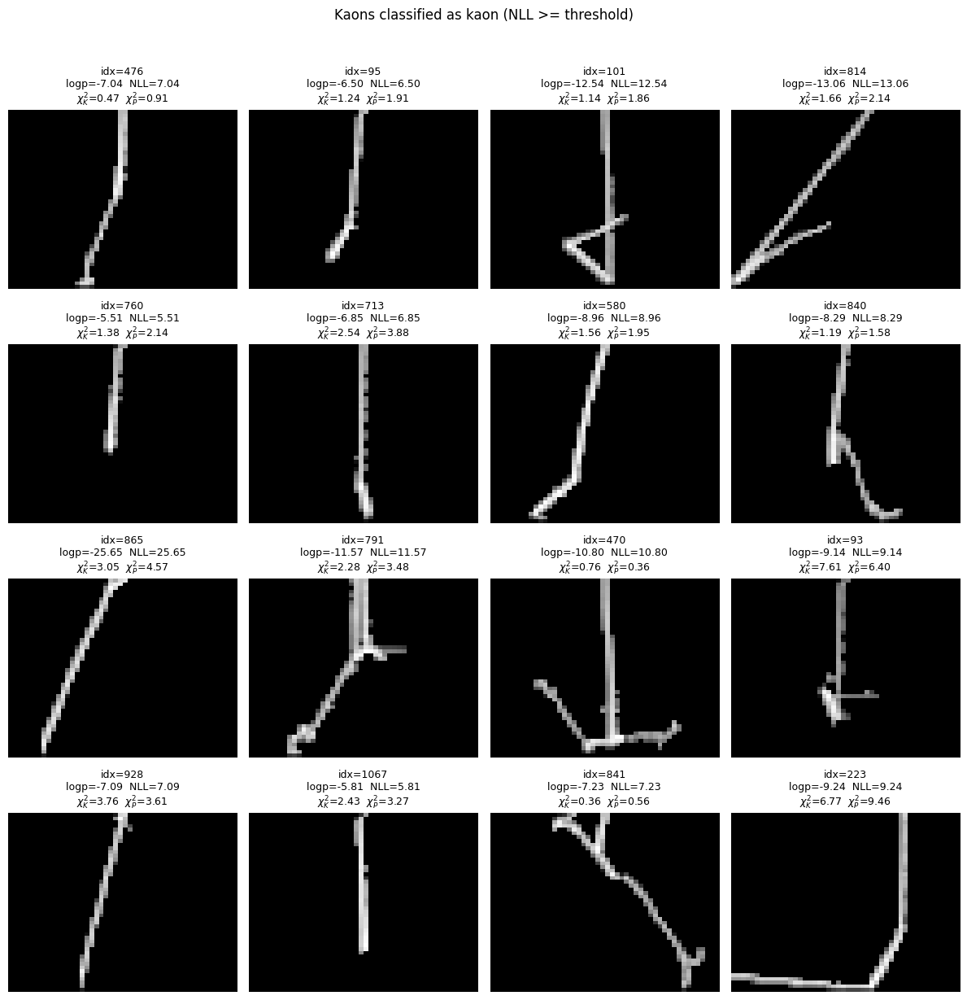

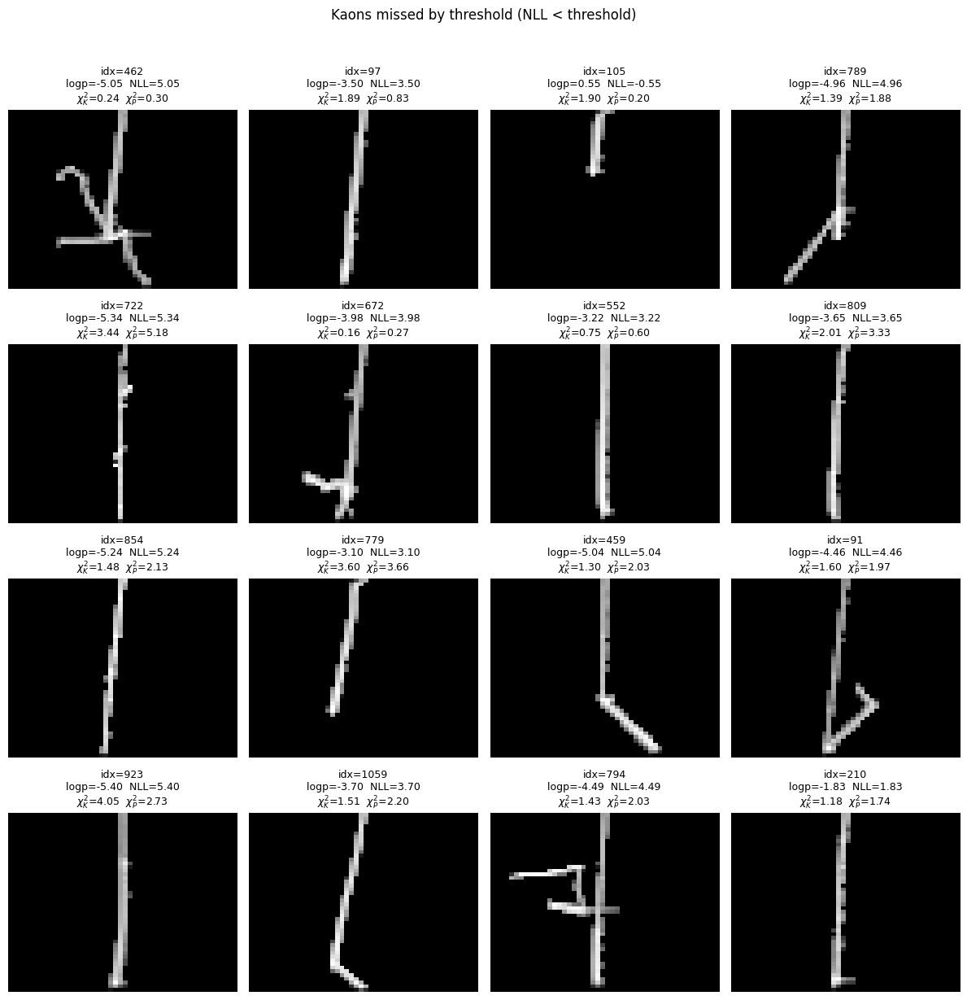

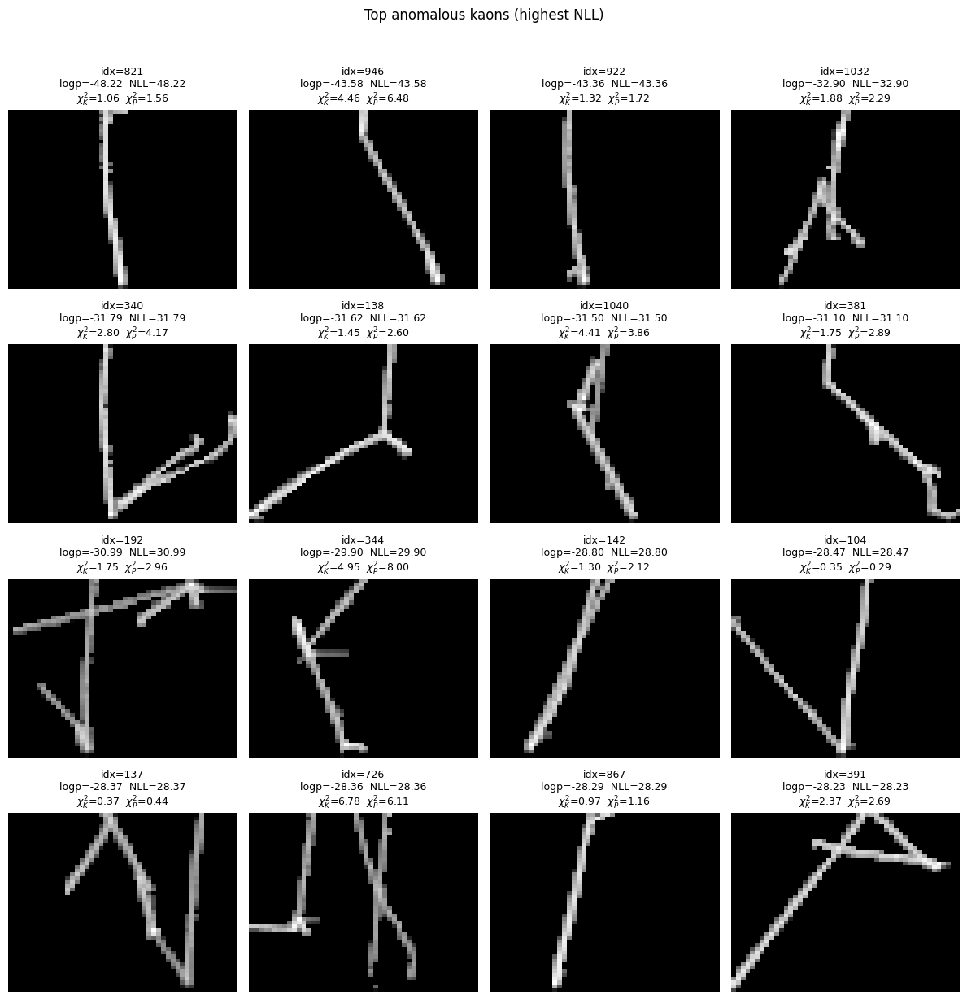

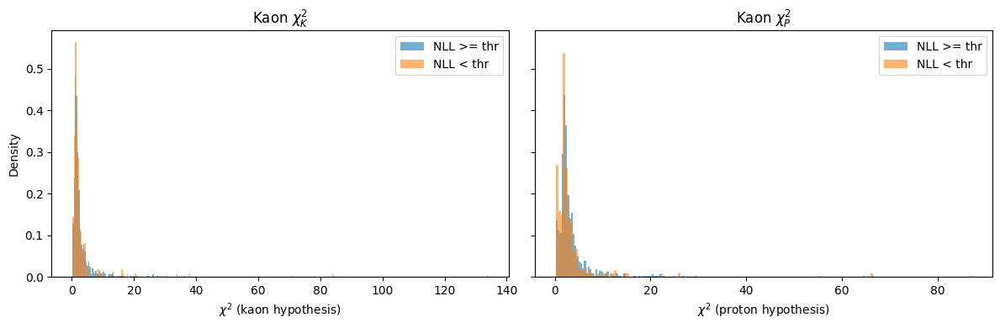

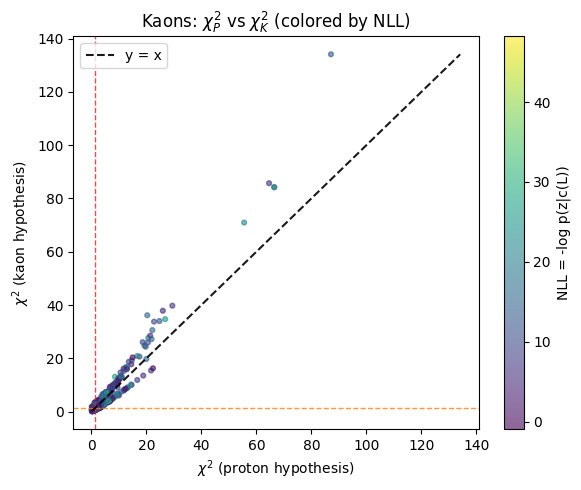

In [ ]:
# Adapted for the new flow method (where kaon_score is already NLL = -log p)

import numpy as np
import matplotlib.pyplot as plt
import torch

# Keep alignment with kaon_score / kaon_logp / k
kaons = kaons.reset_index(drop=True)
chi2_k = kaons["chi_squared_kaon"].to_numpy()
chi2_p = kaons["chi_squared_proton"].to_numpy()
k_np = k.cpu().numpy() if torch.is_tensor(k) else np.asarray(k)

# New-method scores
nll_kaon = np.asarray(kaon_score, dtype=np.float32).reshape(-1)
if "kaon_logp" in globals():
    logp_kaon = np.asarray(kaon_logp, dtype=np.float32).reshape(-1)
else:
    logp_kaon = -nll_kaon

# Threshold from your new threshold cell
if "best_thr_nll" in globals():
    thr_nll = float(best_thr_nll)
elif "best_thr_logp" in globals():
    thr_nll = float(-best_thr_logp)
else:
    # fallback: 95th percentile of proton NLL
    thr_nll = float(np.percentile(np.asarray(proton_score), 95))
    print(f"[warn] No best threshold found, using proton 95th percentile NLL: {thr_nll:.3f}")

idx_above = np.where(nll_kaon >= thr_nll)[0]   # predicted kaon
idx_below = np.where(nll_kaon <  thr_nll)[0]   # missed kaon
top_idx = np.argsort(nll_kaon)[::-1][:16]

print(f"Kaons above threshold: {len(idx_above)} / {len(nll_kaon)}")
print(f"Kaons below threshold: {len(idx_below)} / {len(nll_kaon)}")
print(f"Threshold (NLL): {thr_nll:.4f}")

def show_kaon_grid(indices, title, n_show=16, channel=0, seed=42):
    if len(indices) == 0:
        print(f"No samples for: {title}")
        return

    rng = np.random.default_rng(seed)
    pick = indices if len(indices) <= n_show else rng.choice(indices, size=n_show, replace=False)

    ncols = 4
    nrows = int(np.ceil(len(pick) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
    axes = np.atleast_1d(axes).ravel()

    for ax, idx in zip(axes, pick):
        ax.imshow(k_np[idx, channel], cmap="gray", aspect="auto")
        ax.set_title(
            f"idx={idx}\n"
            f"logp={logp_kaon[idx]:.2f}  NLL={nll_kaon[idx]:.2f}\n"
            f"$\\chi^2_K$={chi2_k[idx]:.2f}  $\\chi^2_P$={chi2_p[idx]:.2f}",
            fontsize=9
        )
        ax.axis("off")

    for ax in axes[len(pick):]:
        ax.axis("off")

    fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()

show_kaon_grid(idx_above, "Kaons classified as kaon (NLL >= threshold)", n_show=16, channel=0)
show_kaon_grid(idx_below, "Kaons missed by threshold (NLL < threshold)", n_show=16, channel=0)
show_kaon_grid(top_idx, "Top anomalous kaons (highest NLL)", n_show=16, channel=0)

# --- Distribution comparison for both chi2 hypotheses ---
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

ax[0].hist(chi2_k[idx_above], bins="auto", alpha=0.6, density=True, label="NLL >= thr")
ax[0].hist(chi2_k[idx_below], bins="auto", alpha=0.6, density=True, label="NLL < thr")
ax[0].set_xlabel(r"$\chi^2$ (kaon hypothesis)")
ax[0].set_ylabel("Density")
ax[0].set_title(r"Kaon $\chi^2_K$")
ax[0].legend()

ax[1].hist(chi2_p[idx_above], bins="auto", alpha=0.6, density=True, label="NLL >= thr")
ax[1].hist(chi2_p[idx_below], bins="auto", alpha=0.6, density=True, label="NLL < thr")
ax[1].set_xlabel(r"$\chi^2$ (proton hypothesis)")
ax[1].set_title(r"Kaon $\chi^2_P$")
ax[1].legend()

plt.tight_layout()
plt.show()

# --- Joint chi2 view (all kaons), colored by spline-flow NLL + y=x line ---
plt.figure(figsize=(6, 5))
sc = plt.scatter(chi2_p, chi2_k, c=nll_kaon, s=12, alpha=0.6, cmap="viridis")
plt.colorbar(sc, label="NLL = -log p(z|c(L))")

plt.axhline(1.3, color="tab:orange", ls="--", lw=1, alpha=0.8)
plt.axvline(1.3, color="tab:red", ls="--", lw=1, alpha=0.8)

# y = x reference line
xy_min = float(min(np.min(chi2_p), np.min(chi2_k)))
xy_max = float(max(np.max(chi2_p), np.max(chi2_k)))
plt.plot([xy_min, xy_max], [xy_min, xy_max], color="black", ls="--", lw=1.5, alpha=0.9, label="y = x")

# plt.xlim(xy_min, xy_max)
# plt.ylim(xy_min, xy_max)

plt.xlabel(r"$\chi^2$ (proton hypothesis)")
plt.ylabel(r"$\chi^2$ (kaon hypothesis)")
plt.title(r"Kaons: $\chi^2_P$ vs $\chi^2_K$ (colored by NLL)")
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()


Selected as kaon:     n=838, mean=99.54, median=101.00
Selected as non-kaon: n=262,  mean=83.40, median=81.00


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_79286/2880232613.py:48: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[1].boxplot([L_sel_kaon, L_sel_non], labels=["Kaon", "Non-kaon"], showfliers=False)


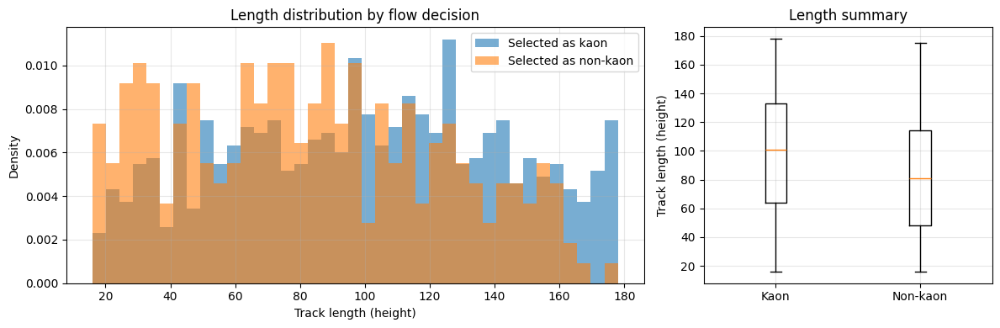

In [ ]:
# Plot kaon-candidate track lengths split by flow decision:
# "selected as kaon" (NLL >= threshold) vs "selected as non-kaon" (NLL < threshold)

import numpy as np
import matplotlib.pyplot as plt

# lengths aligned with kaon_score
if "Ly_raw" in globals():
    kaon_lengths = np.asarray(Ly_raw, dtype=np.float32)
else:
    kaons = kaons.reset_index(drop=True)
    kaon_lengths = kaons["height"].to_numpy(dtype=np.float32)

# indices (reuse if already computed)
if "idx_above" not in globals() or "idx_below" not in globals():
    nll_kaon = np.asarray(kaon_score, dtype=np.float32)
    if "best_thr_nll" in globals():
        thr_nll = float(best_thr_nll)
    elif "best_thr_logp" in globals():
        thr_nll = float(-best_thr_logp)
    else:
        raise ValueError("Need best_thr_nll (or best_thr_logp) to split kaons/non-kaons.")
    idx_above = np.where(nll_kaon >= thr_nll)[0]   # predicted kaon
    idx_below = np.where(nll_kaon <  thr_nll)[0]   # predicted non-kaon

L_sel_kaon = kaon_lengths[idx_above]
L_sel_non  = kaon_lengths[idx_below]

print(f"Selected as kaon:     n={len(L_sel_kaon)}, mean={L_sel_kaon.mean():.2f}, median={np.median(L_sel_kaon):.2f}")
print(f"Selected as non-kaon: n={len(L_sel_non)},  mean={L_sel_non.mean():.2f}, median={np.median(L_sel_non):.2f}")

# Common bins for fair comparison
all_L = np.concatenate([L_sel_kaon, L_sel_non])
bins = np.linspace(all_L.min(), all_L.max(), 40)

fig, ax = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={"width_ratios": [2, 1]})

# Histogram view
ax[0].hist(L_sel_kaon, bins=bins, density=True, alpha=0.6, label="Selected as kaon")
ax[0].hist(L_sel_non,  bins=bins, density=True, alpha=0.6, label="Selected as non-kaon")
ax[0].set_xlabel("Track length (height)")
ax[0].set_ylabel("Density")
ax[0].set_title("Length distribution by flow decision")
ax[0].grid(alpha=0.3)
ax[0].legend()

# Boxplot view
ax[1].boxplot([L_sel_kaon, L_sel_non], labels=["Kaon", "Non-kaon"], showfliers=False)
ax[1].set_ylabel("Track length (height)")
ax[1].set_title("Length summary")
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


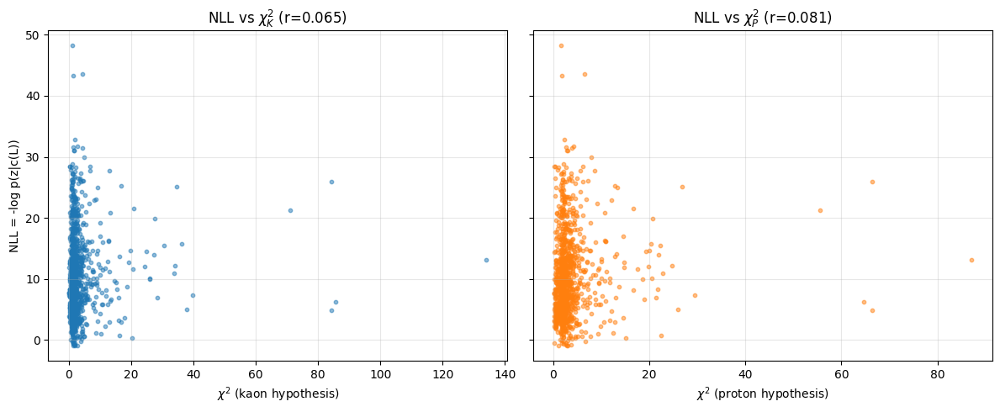

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Aligned arrays
kaons = kaons.reset_index(drop=True)
chi2_k = kaons["chi_squared_kaon"].to_numpy(dtype=np.float32)
chi2_p = kaons["chi_squared_proton"].to_numpy(dtype=np.float32)
nll_kaon = np.asarray(kaon_score, dtype=np.float32).reshape(-1)  # NLL from flow

# Keep only finite values
m = np.isfinite(chi2_k) & np.isfinite(chi2_p) & np.isfinite(nll_kaon)
chi2_k, chi2_p, nll = chi2_k[m], chi2_p[m], nll_kaon[m]

# Correlations (optional)
r_k = np.corrcoef(chi2_k, nll)[0, 1]
r_p = np.corrcoef(chi2_p, nll)[0, 1]

fig, ax = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

ax[0].scatter(chi2_k, nll, s=10, alpha=0.5, c="tab:blue")
ax[0].set_xlabel(r"$\chi^2$ (kaon hypothesis)")
ax[0].set_ylabel("NLL = -log p(z|c(L))")
ax[0].set_title(fr"NLL vs $\chi^2_K$ (r={r_k:.3f})")
ax[0].grid(alpha=0.3)

ax[1].scatter(chi2_p, nll, s=10, alpha=0.5, c="tab:orange")
ax[1].set_xlabel(r"$\chi^2$ (proton hypothesis)")
ax[1].set_title(fr"NLL vs $\chi^2_P$ (r={r_p:.3f})")
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()



[Mean-latent] AUROC (val protons vs kaons): 0.87161
[Mean-latent] Proton efficiency at fixed kaon rejection:
  kaon rej target=90.0% | thr=20.3147 | proton eff=99.71% | kaon eff=10.00%
  kaon rej target=95.0% | thr=23.6372 | proton eff=99.78% | kaon eff=5.00%
  kaon rej target=99.0% | thr=28.4732 | proton eff=99.85% | kaon eff=1.00%
[Mean-latent] Kaon efficiency at 1.0% proton FPR: 17.64% (thr=16.0636)

[MC-latent (16 samples)] AUROC (val protons vs kaons): 0.87356
[MC-latent (16 samples)] Proton efficiency at fixed kaon rejection:
  kaon rej target=90.0% | thr=19.9870 | proton eff=99.71% | kaon eff=10.00%
  kaon rej target=95.0% | thr=23.2368 | proton eff=99.78% | kaon eff=5.00%
  kaon rej target=99.0% | thr=28.6823 | proton eff=99.85% | kaon eff=1.00%
[MC-latent (16 samples)] Kaon efficiency at 1.0% proton FPR: 19.09% (thr=15.1156)

[Mean-latent] Length-stratified AUROC
  bin 0: [16.0, 30.0] nP=393, nK=65, AUROC=0.78242
  bin 1: [30.0, 47.0] nP=396, nK=113, AUROC=0.79376
  bin 2: [4

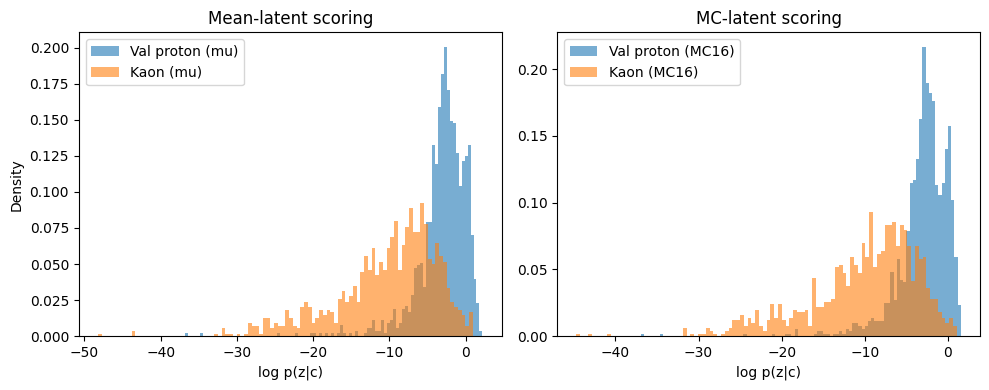


AUROC gain (MC - mean): +0.00195


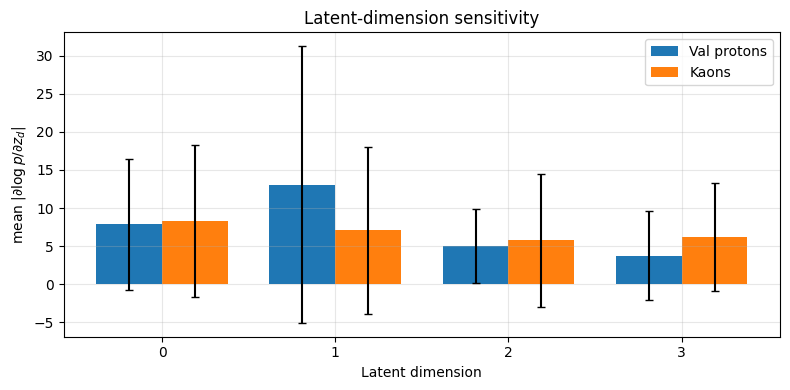

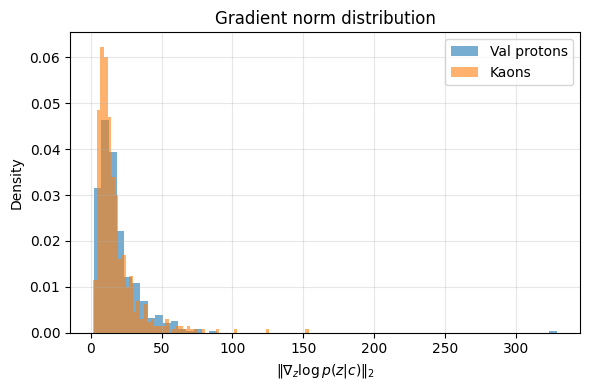


Validation proton tail check (log p < -25.0):
  Mean-latent: 2/1356 (0.147%)
  MC-latent:   2/1356 (0.147%)


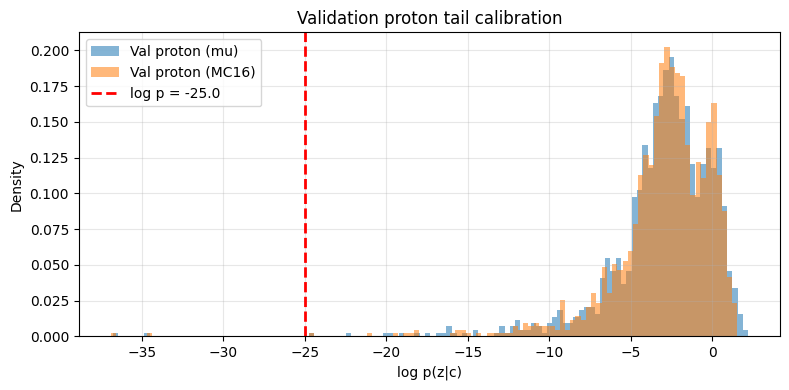

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

# ------------------------------------------------------------------
# Required objects from previous cells:
# flow, model (VAE), make_context, z_mean, z_std, c_mean, c_std, L_mean, L_std,
# Lz_raw (val proton lengths), Ly_raw (kaon lengths),
# and either X_nval/Xk_np or val_subset/k
# ------------------------------------------------------------------

def require(name):
    if name not in globals():
        raise RuntimeError(f"Missing required variable: {name}")

for _n in ["flow", "z_mean", "z_std", "c_mean", "c_std", "L_mean", "L_std", "make_context", "Lz_raw", "Ly_raw"]:
    require(_n)

flow_device = next(flow.parameters()).device

def context_std_from_lengths(L_raw):
    C = make_context(np.asarray(L_raw, dtype=np.float32), L_mean, L_std)
    C = (C - c_mean) / c_std
    return C.astype(np.float32)

def auroc_and_operating_points(proton_scores, kaon_scores, kaon_rej_targets=(0.90, 0.95, 0.99), proton_fpr_target=0.01, label=""):
    # Scores are NLL: larger = more kaon-like
    y = np.concatenate([np.zeros(len(proton_scores), dtype=np.int32), np.ones(len(kaon_scores), dtype=np.int32)])
    s = np.concatenate([proton_scores, kaon_scores])
    auc = roc_auc_score(y, s)
    print(f"\n[{label}] AUROC (val protons vs kaons): {auc:.5f}")

    print(f"[{label}] Proton efficiency at fixed kaon rejection:")
    for r in kaon_rej_targets:
        thr = np.quantile(kaon_scores, r)  # by construction, kaon rejection ~ r
        proton_eff = np.mean(proton_scores < thr)  # kept as proton
        kaon_rej = np.mean(kaon_scores < thr)
        kaon_eff = 1.0 - kaon_rej
        print(f"  kaon rej target={r*100:.1f}% | thr={thr:.4f} | proton eff={proton_eff*100:.2f}% | kaon eff={kaon_eff*100:.2f}%")

    thr_fpr = np.quantile(proton_scores, 1.0 - proton_fpr_target)  # P(score>=thr|proton)=1%
    kaon_eff_at_1pct_fpr = np.mean(kaon_scores >= thr_fpr)
    print(f"[{label}] Kaon efficiency at {proton_fpr_target*100:.1f}% proton FPR: {kaon_eff_at_1pct_fpr*100:.2f}% (thr={thr_fpr:.4f})")

    return auc

def length_stratified_auroc(proton_scores, kaon_scores, Lp, Lk, n_bins=5, min_per_class=25, label=""):
    edges = np.quantile(np.concatenate([Lp, Lk]), np.linspace(0, 1, n_bins + 1))
    edges = np.unique(edges)
    print(f"\n[{label}] Length-stratified AUROC")
    for i in range(len(edges) - 1):
        lo, hi = edges[i], edges[i + 1]
        if i < len(edges) - 2:
            pm = (Lp >= lo) & (Lp < hi)
            km = (Lk >= lo) & (Lk < hi)
        else:
            pm = (Lp >= lo) & (Lp <= hi)
            km = (Lk >= lo) & (Lk <= hi)

        n_p, n_k = int(pm.sum()), int(km.sum())
        if n_p < min_per_class or n_k < min_per_class:
            print(f"  bin {i}: [{lo:.1f}, {hi:.1f}] nP={n_p}, nK={n_k} -> skipped")
            continue

        yb = np.concatenate([np.zeros(n_p, dtype=np.int32), np.ones(n_k, dtype=np.int32)])
        sb = np.concatenate([proton_scores[pm], kaon_scores[km]])
        auc_b = roc_auc_score(yb, sb)
        print(f"  bin {i}: [{lo:.1f}, {hi:.1f}] nP={n_p}, nK={n_k}, AUROC={auc_b:.5f}")

def get_vae_model():
    if "model" in globals() and hasattr(model, "encode"):
        return model
    if "loaded_model" in globals() and hasattr(loaded_model, "encode"):
        return loaded_model
    raise RuntimeError("Could not find VAE model with .encode()")

vae_model = get_vae_model()
vae_device = next(vae_model.parameters()).device

def encode_mu_logvar(images_np, batch_size=256):
    mus, logvars = [], []
    vae_model.eval()
    with torch.no_grad():
        for i in range(0, len(images_np), batch_size):
            xb = torch.from_numpy(images_np[i:i+batch_size].astype(np.float32)).to(vae_device)
            mu_b, logvar_b = vae_model.encode(xb)
            mus.append(mu_b.cpu().numpy())
            logvars.append(logvar_b.cpu().numpy())
    return np.concatenate(mus, axis=0), np.concatenate(logvars, axis=0)

def flow_log_prob_np(z_std_np, c_std_np, batch_size=4096):
    out = []
    flow.eval()
    with torch.no_grad():
        for i in range(0, len(z_std_np), batch_size):
            zt = torch.from_numpy(z_std_np[i:i+batch_size].astype(np.float32)).to(flow_device)
            ct = torch.from_numpy(c_std_np[i:i+batch_size].astype(np.float32)).to(flow_device)
            out.append(flow.log_prob(inputs=zt, context=ct).cpu().numpy())
    return np.concatenate(out, axis=0)

def flow_log_prob_mc(mu_np, logvar_np, c_std_np, n_mc=16, batch_size=128):
    # log p(x|c) approx log(1/S sum_s p(z_s|c)), z_s ~ q(z|x)
    out = []
    flow.eval()

    z_mean_t = torch.from_numpy(np.asarray(z_mean, dtype=np.float32)).to(flow_device)
    z_std_t = torch.from_numpy(np.asarray(z_std, dtype=np.float32)).to(flow_device)

    with torch.no_grad():
        for i in range(0, len(mu_np), batch_size):
            j = min(i + batch_size, len(mu_np))
            mu_t = torch.from_numpy(mu_np[i:j].astype(np.float32)).to(flow_device)              # [B,D]
            lv_t = torch.from_numpy(logvar_np[i:j].astype(np.float32)).to(flow_device)          # [B,D]
            c_t = torch.from_numpy(c_std_np[i:j].astype(np.float32)).to(flow_device)            # [B,C]

            std_t = torch.exp(0.5 * lv_t)
            eps = torch.randn((j - i, n_mc, mu_t.shape[1]), device=flow_device)
            z_s = mu_t[:, None, :] + eps * std_t[:, None, :]                                     # [B,S,D]
            z_s = (z_s - z_mean_t) / z_std_t

            c_rep = c_t[:, None, :].expand(-1, n_mc, -1)                                         # [B,S,C]
            logp_flat = flow.log_prob(
                inputs=z_s.reshape(-1, z_s.shape[-1]),
                context=c_rep.reshape(-1, c_rep.shape[-1])
            )
            logp = logp_flat.view(j - i, n_mc)                                                   # [B,S]
            logp_avg = torch.logsumexp(logp, dim=1) - np.log(n_mc)                               # [B]
            out.append(logp_avg.cpu().numpy())

    return np.concatenate(out, axis=0)

def grad_profile(z_std_np, c_std_np, n_take=512, seed=42):
    rng = np.random.default_rng(seed)
    n_take = min(n_take, len(z_std_np))
    idx = rng.choice(len(z_std_np), size=n_take, replace=False)

    zt = torch.tensor(z_std_np[idx], dtype=torch.float32, device=flow_device, requires_grad=True)
    ct = torch.tensor(c_std_np[idx], dtype=torch.float32, device=flow_device)

    flow.eval()
    flow.zero_grad(set_to_none=True)
    total_logp = flow.log_prob(inputs=zt, context=ct).sum()
    grad = torch.autograd.grad(total_logp, zt)[0].detach().cpu().numpy()                         # [N,D]

    mean_abs = np.mean(np.abs(grad), axis=0)
    std_abs = np.std(np.abs(grad), axis=0)
    norm = np.linalg.norm(grad, axis=1)
    return mean_abs, std_abs, norm

# --------------------------
# Load image arrays for MC scoring
# --------------------------
if "X_nval" in globals():
    X_val_img = np.asarray(X_nval, dtype=np.float32)
else:
    require("val_subset")
    X_val_img = torch.stack([val_subset[i] for i in range(len(val_subset))]).cpu().numpy().astype(np.float32)

if "Xk_np" in globals():
    X_kaon_img = np.asarray(Xk_np, dtype=np.float32)
else:
    require("k")
    X_kaon_img = k.cpu().numpy().astype(np.float32) if torch.is_tensor(k) else np.asarray(k, dtype=np.float32)

L_val = np.asarray(Lz_raw, dtype=np.float32)
L_ka = np.asarray(Ly_raw, dtype=np.float32)

assert len(X_val_img) == len(L_val), f"val mismatch: images={len(X_val_img)} lengths={len(L_val)}"
assert len(X_kaon_img) == len(L_ka), f"kaon mismatch: images={len(X_kaon_img)} lengths={len(L_ka)}"

C_val_std = context_std_from_lengths(L_val)
C_ka_std = context_std_from_lengths(L_ka)

# --------------------------
# Mean-latent scoring and MC-latent scoring
# --------------------------
mu_val, logvar_val = encode_mu_logvar(X_val_img, batch_size=256)
mu_ka, logvar_ka = encode_mu_logvar(X_kaon_img, batch_size=256)

mu_val_std = (mu_val - z_mean) / z_std
mu_ka_std = (mu_ka - z_mean) / z_std

logp_val_mu = flow_log_prob_np(mu_val_std, C_val_std, batch_size=4096)
logp_ka_mu = flow_log_prob_np(mu_ka_std, C_ka_std, batch_size=4096)

logp_val_mc = flow_log_prob_mc(mu_val, logvar_val, C_val_std, n_mc=16, batch_size=128)
logp_ka_mc = flow_log_prob_mc(mu_ka, logvar_ka, C_ka_std, n_mc=16, batch_size=128)

proton_score_mu = -logp_val_mu
kaon_score_mu = -logp_ka_mu
proton_score_mc = -logp_val_mc
kaon_score_mc = -logp_ka_mc

# --------------------------
# A) AUROC + operating points
# --------------------------
auc_mu = auroc_and_operating_points(proton_score_mu, kaon_score_mu, label="Mean-latent")
auc_mc = auroc_and_operating_points(proton_score_mc, kaon_score_mc, label="MC-latent (16 samples)")

# A) Length-stratified AUROC
length_stratified_auroc(proton_score_mu, kaon_score_mu, L_val, L_ka, n_bins=5, label="Mean-latent")
length_stratified_auroc(proton_score_mc, kaon_score_mc, L_val, L_ka, n_bins=5, label="MC-latent")

# --------------------------
# B) MC vs mean distribution comparison
# --------------------------
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(logp_val_mu, bins=100, density=True, alpha=0.6, label="Val proton (mu)")
plt.hist(logp_ka_mu, bins=100, density=True, alpha=0.6, label="Kaon (mu)")
plt.xlabel("log p(z|c)")
plt.ylabel("Density")
plt.title("Mean-latent scoring")
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(logp_val_mc, bins=100, density=True, alpha=0.6, label="Val proton (MC16)")
plt.hist(logp_ka_mc, bins=100, density=True, alpha=0.6, label="Kaon (MC16)")
plt.xlabel("log p(z|c)")
plt.title("MC-latent scoring")
plt.legend()

plt.tight_layout()
plt.show()

print(f"\nAUROC gain (MC - mean): {auc_mc - auc_mu:+.5f}")

# --------------------------
# C) Latent dimension gradient analysis
# --------------------------
gP_mean, gP_std, gP_norm = grad_profile(mu_val_std, C_val_std, n_take=512, seed=42)
gK_mean, gK_std, gK_norm = grad_profile(mu_ka_std, C_ka_std, n_take=512, seed=43)

dims = np.arange(len(gP_mean))
w = 0.38

plt.figure(figsize=(8, 4))
plt.bar(dims - w/2, gP_mean, width=w, yerr=gP_std, capsize=3, label="Val protons")
plt.bar(dims + w/2, gK_mean, width=w, yerr=gK_std, capsize=3, label="Kaons")
plt.xlabel("Latent dimension")
plt.ylabel(r"mean $|\partial \log p / \partial z_d|$")
plt.title("Latent-dimension sensitivity")
plt.xticks(dims)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 4))
plt.hist(gP_norm, bins=60, alpha=0.6, density=True, label="Val protons")
plt.hist(gK_norm, bins=60, alpha=0.6, density=True, label="Kaons")
plt.xlabel(r"$\|\nabla_z \log p(z|c)\|_2$")
plt.ylabel("Density")
plt.title("Gradient norm distribution")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------
# 7) Overconfidence tail check on validation protons
# --------------------------
tail_cut = -25.0
n_tail_mu = int(np.sum(logp_val_mu < tail_cut))
n_tail_mc = int(np.sum(logp_val_mc < tail_cut))
frac_tail_mu = 100.0 * n_tail_mu / len(logp_val_mu)
frac_tail_mc = 100.0 * n_tail_mc / len(logp_val_mc)

print(f"\nValidation proton tail check (log p < {tail_cut}):")
print(f"  Mean-latent: {n_tail_mu}/{len(logp_val_mu)} ({frac_tail_mu:.3f}%)")
print(f"  MC-latent:   {n_tail_mc}/{len(logp_val_mc)} ({frac_tail_mc:.3f}%)")

plt.figure(figsize=(8, 4))
plt.hist(logp_val_mu, bins=120, alpha=0.55, density=True, label="Val proton (mu)")
plt.hist(logp_val_mc, bins=120, alpha=0.55, density=True, label="Val proton (MC16)")
plt.axvline(tail_cut, color="red", ls="--", lw=2, label=f"log p = {tail_cut}")
plt.xlabel("log p(z|c)")
plt.ylabel("Density")
plt.title("Validation proton tail calibration")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


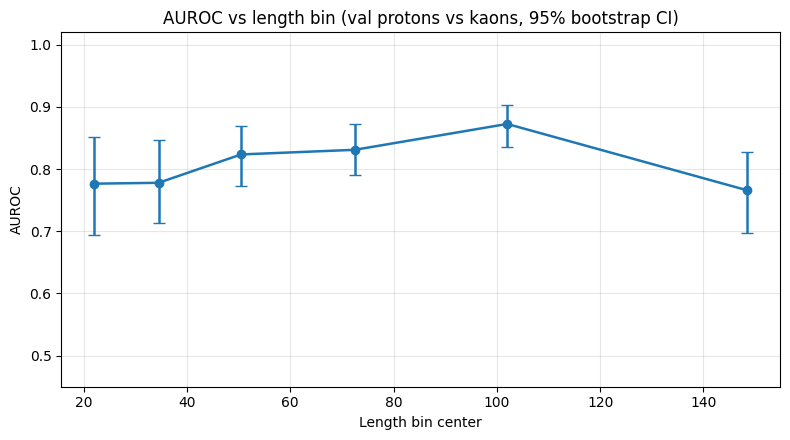

Bin 0 [16.0, 28.0] nP=331, nK=57 | AUROC=0.7766 [0.6936, 0.8518]
Bin 1 [28.0, 41.0] nP=341, nK=76 | AUROC=0.7780 [0.7134, 0.8473]
Bin 2 [41.0, 60.0] nP=290, nK=130 | AUROC=0.8236 [0.7725, 0.8701]
Bin 3 [60.0, 85.0] nP=200, nK=196 | AUROC=0.8310 [0.7901, 0.8728]
Bin 4 [85.0, 119.0] nP=142, nK=280 | AUROC=0.8726 [0.8356, 0.9038]
Bin 5 [119.0, 178.0] nP=52, nK=361 | AUROC=0.7659 [0.6969, 0.8272]


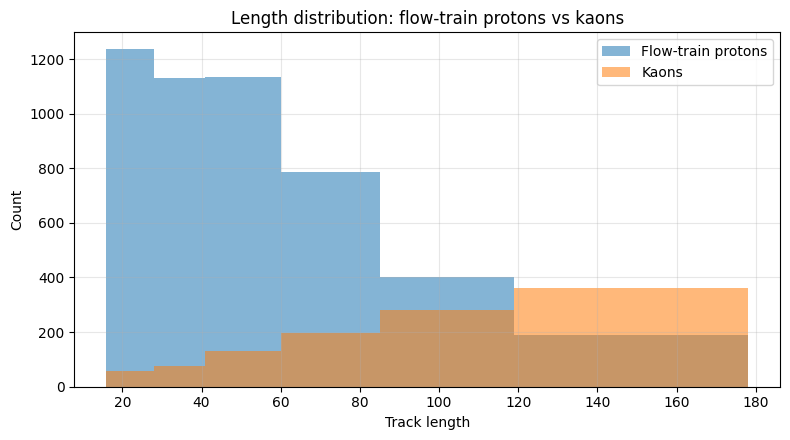

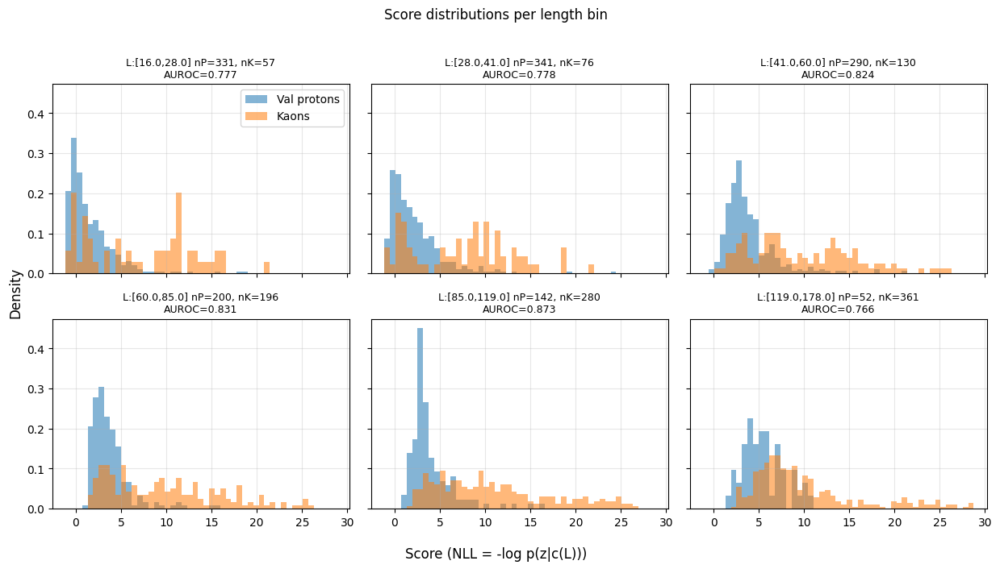

In [ ]:
# A/B/C plots:
# A) AUROC vs length bin with bootstrap error bars
# B) Proton(flow-train) vs kaon length density
# C) Proton vs kaon score distributions per length bin

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import math

# -----------------------------
# Pick score arrays (prefer MC if available)
# -----------------------------
p_scores = np.asarray(proton_score_mc if "proton_score_mc" in globals() else proton_score, dtype=np.float32)  # val protons
k_scores = np.asarray(kaon_score_mc if "kaon_score_mc" in globals() else kaon_score, dtype=np.float32)        # kaons

p_len_eval = np.asarray(Lz_raw, dtype=np.float32)   # val proton lengths (aligned with p_scores)
k_len = np.asarray(Ly_raw, dtype=np.float32)        # kaon lengths (aligned with k_scores)
p_len_train = np.asarray(L_tr_raw, dtype=np.float32)  # flow-train proton lengths (for panel B)

assert len(p_scores) == len(p_len_eval)
assert len(k_scores) == len(k_len)

# -----------------------------
# Binning setup (shared)
# -----------------------------
n_bins = 6
combined_len = np.concatenate([p_len_eval, k_len])
edges = np.quantile(combined_len, np.linspace(0, 1, n_bins + 1))
edges = np.unique(edges)
if len(edges) < 2:
    raise RuntimeError("Not enough unique length edges. Reduce n_bins or inspect length data.")

def bin_mask(x, i, edges):
    lo, hi = edges[i], edges[i + 1]
    if i < len(edges) - 2:
        return (x >= lo) & (x < hi)
    return (x >= lo) & (x <= hi)

def auc_bootstrap(proton_s, kaon_s, n_boot=1000, seed=42):
    # Scores are assumed "higher => more kaon-like" (NLL convention)
    y = np.concatenate([np.zeros(len(proton_s), dtype=np.int32), np.ones(len(kaon_s), dtype=np.int32)])
    s = np.concatenate([proton_s, kaon_s])
    auc = roc_auc_score(y, s)

    rng = np.random.default_rng(seed)
    boot = np.empty(n_boot, dtype=np.float32)
    for b in range(n_boot):
        p_idx = rng.integers(0, len(proton_s), len(proton_s))
        k_idx = rng.integers(0, len(kaon_s), len(kaon_s))
        pb = proton_s[p_idx]
        kb = kaon_s[k_idx]
        yb = np.concatenate([np.zeros(len(pb), dtype=np.int32), np.ones(len(kb), dtype=np.int32)])
        sb = np.concatenate([pb, kb])
        boot[b] = roc_auc_score(yb, sb)

    lo, hi = np.percentile(boot, [2.5, 97.5])
    return auc, lo, hi

# -----------------------------
# (A) AUROC vs length bin + bootstrap CI
# -----------------------------
min_per_class = 20
centers, aucs, yerr_lo, yerr_hi = [], [], [], []
bin_info = []

for i in range(len(edges) - 1):
    pm = bin_mask(p_len_eval, i, edges)
    km = bin_mask(k_len, i, edges)
    nP, nK = int(pm.sum()), int(km.sum())
    lo, hi = edges[i], edges[i + 1]

    if nP < min_per_class or nK < min_per_class:
        print(f"Skip bin {i} [{lo:.1f}, {hi:.1f}] nP={nP}, nK={nK}")
        continue

    auc_i, ci_lo, ci_hi = auc_bootstrap(p_scores[pm], k_scores[km], n_boot=1000, seed=42 + i)
    c = 0.5 * (lo + hi)

    centers.append(c)
    aucs.append(auc_i)
    yerr_lo.append(auc_i - ci_lo)
    yerr_hi.append(ci_hi - auc_i)
    bin_info.append((i, lo, hi, nP, nK, auc_i, ci_lo, ci_hi))

plt.figure(figsize=(8, 4.5))
plt.errorbar(
    centers, aucs,
    yerr=np.vstack([yerr_lo, yerr_hi]),
    fmt="o-", capsize=4, lw=1.8
)
plt.ylim(0.45, 1.02)
plt.xlabel("Length bin center")
plt.ylabel("AUROC")
plt.title("AUROC vs length bin (val protons vs kaons, 95% bootstrap CI)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

for i, lo, hi, nP, nK, auc_i, ci_lo, ci_hi in bin_info:
    print(f"Bin {i} [{lo:.1f}, {hi:.1f}] nP={nP}, nK={nK} | AUROC={auc_i:.4f} [{ci_lo:.4f}, {ci_hi:.4f}]")

# -----------------------------
# (B) Proton density vs length (flow-train) + kaons
# -----------------------------
plt.figure(figsize=(8, 4.5))
plt.hist(p_len_train, bins=edges, alpha=0.55, label="Flow-train protons")
plt.hist(k_len, bins=edges, alpha=0.55, label="Kaons")
plt.xlabel("Track length")
plt.ylabel("Count")
plt.title("Length distribution: flow-train protons vs kaons")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# -----------------------------
# (C) Score distributions per length bin (protons vs kaons)
# -----------------------------
score_all = np.concatenate([p_scores, k_scores])
s_lo, s_hi = np.percentile(score_all, [0.5, 99.5])
score_bins = np.linspace(s_lo, s_hi, 50)

n_panels = len(edges) - 1
ncols = 3
nrows = math.ceil(n_panels / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 3.4 * nrows), sharex=True, sharey=True)
axes = np.atleast_1d(axes).ravel()

for i in range(n_panels):
    ax = axes[i]
    pm = bin_mask(p_len_eval, i, edges)
    km = bin_mask(k_len, i, edges)
    nP, nK = int(pm.sum()), int(km.sum())
    lo, hi = edges[i], edges[i + 1]

    if nP == 0 or nK == 0:
        ax.text(0.5, 0.5, "insufficient data", ha="center", va="center", transform=ax.transAxes)
        ax.set_title(f"[{lo:.1f}, {hi:.1f}]")
        ax.grid(alpha=0.3)
        continue

    ax.hist(p_scores[pm], bins=score_bins, density=True, alpha=0.55, label="Val protons")
    ax.hist(k_scores[km], bins=score_bins, density=True, alpha=0.55, label="Kaons")
    try:
        auc_i = roc_auc_score(
            np.concatenate([np.zeros(nP, dtype=np.int32), np.ones(nK, dtype=np.int32)]),
            np.concatenate([p_scores[pm], k_scores[km]])
        )
        ttl = f"L:[{lo:.1f},{hi:.1f}] nP={nP}, nK={nK}\nAUROC={auc_i:.3f}"
    except Exception:
        ttl = f"L:[{lo:.1f},{hi:.1f}] nP={nP}, nK={nK}"
    ax.set_title(ttl, fontsize=9)
    ax.grid(alpha=0.3)

# hide unused axes
for j in range(n_panels, len(axes)):
    axes[j].axis("off")

axes[0].legend()
fig.supxlabel("Score (NLL = -log p(z|c(L)))")
fig.supylabel("Density")
fig.suptitle("Score distributions per length bin", y=1.02)
plt.tight_layout()
plt.show()


In [ ]:
# Sweep proton training size for the affine conditional flow.
# Keeps the VAE fixed; only the affine nflows model is retrained.

import copy
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_fscore_support, confusion_matrix
from torch import optim
from torch.utils.data import TensorDataset, DataLoader
from nflows import transforms, distributions, flows

# ----------------------------
# Fixed data from earlier cells
# ----------------------------
train_protons = protons.iloc[train_idx].reset_index(drop=True)
val_protons = protons.iloc[val_idx].reset_index(drop=True)
kaons_eval = kaons.reset_index(drop=True)

X_full = np.asarray(latent_vectors, dtype=np.float32)      # proton latents used for flow training sweep
Z_eval = np.asarray(latent_vectors_val, dtype=np.float32)  # validation proton latents
Y_eval = np.asarray(latent_vectors_k, dtype=np.float32)    # kaon latents

L_full = train_protons["height"].to_numpy(dtype=np.float32)
L_val = val_protons["height"].to_numpy(dtype=np.float32)
L_ka = kaons_eval["height"].to_numpy(dtype=np.float32)

RE_val = np.asarray(RE_per_sample_val, dtype=np.float32).reshape(-1)
RE_ka = np.asarray(RE_per_sample_k, dtype=np.float32).reshape(-1)

assert len(X_full) == len(L_full)
assert len(Z_eval) == len(L_val) == len(RE_val) == len(val_protons)
assert len(Y_eval) == len(L_ka) == len(RE_ka) == len(kaons_eval)

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else
    "mps" if torch.backends.mps.is_available() else
    "cpu"
)
print("Device:", DEVICE)

# ----------------------------
# Sweep config
# ----------------------------
subset_sizes = sorted(set([
    x for x in [32, 64, 128, 256, 512, 1024, 2048, 3072, len(X_full)]
    if x <= len(X_full)
]))
n_repeats = 3

inner_val_frac = 0.10
batch_size = 256
max_epochs = 150
patience = 15
min_delta = 1e-4
grad_clip_norm = 5.0
lr = 3e-4
weight_decay = 1e-5

hidden_features = 128
num_transforms = 8

# ----------------------------
# Helpers
# ----------------------------
def make_context(L_raw, L_mean, L_std, eps=1e-3):
    L_raw = np.asarray(L_raw, dtype=np.float32)
    L_scaled = (L_raw - L_mean) / (L_std + 1e-6)
    return np.stack([L_scaled, L_scaled**2, np.log(L_raw + eps)], axis=1).astype(np.float32)

def build_affine_flow(latent_dim, context_dim):
    transform_list = []
    for _ in range(num_transforms):
        transform_list.append(transforms.RandomPermutation(features=latent_dim))
        transform_list.append(
            transforms.autoregressive.MaskedAffineAutoregressiveTransform(
                features=latent_dim,
                hidden_features=hidden_features,
                context_features=context_dim,
            )
        )

    transform = transforms.CompositeTransform(transform_list)
    flow = flows.Flow(transform, distributions.StandardNormal([latent_dim]))
    return flow.float().to(DEVICE)

def score_flow(flow, z_np, c_np, batch_size=4096):
    scores = []
    logps = []
    flow.eval()
    with torch.no_grad():
        for i in range(0, len(z_np), batch_size):
            z_t = torch.from_numpy(z_np[i:i+batch_size].astype(np.float32)).to(DEVICE)
            c_t = torch.from_numpy(c_np[i:i+batch_size].astype(np.float32)).to(DEVICE)
            logp = flow.log_prob(inputs=z_t, context=c_t).cpu().numpy()
            logps.append(logp)
            scores.append(-logp)
    return np.concatenate(scores), np.concatenate(logps)

def safe_mean(x):
    return float(np.mean(x)) if len(x) else np.nan

def safe_std(x):
    return float(np.std(x, ddof=1)) if len(x) > 1 else np.nan

def add_group_stats(out, prefix, df_eval, scores, thr, re_arr):
    mass = df_eval["beamline_mass"].to_numpy(dtype=np.float32)
    chi2_k = df_eval["chi_squared_kaon"].to_numpy(dtype=np.float32)
    chi2_p = df_eval["chi_squared_proton"].to_numpy(dtype=np.float32)

    masks = {
        "below": scores < thr,
        "above": scores >= thr,
    }

    arrays = {
        "mass": mass,
        "chi2_k": chi2_k,
        "chi2_p": chi2_p,
        "RE": re_arr,
    }

    for side, mask in masks.items():
        out[f"{prefix}_{side}_n"] = int(mask.sum())
        for name, arr in arrays.items():
            vals = arr[mask]
            out[f"{prefix}_{side}_{name}_mean"] = safe_mean(vals)
            out[f"{prefix}_{side}_{name}_std"] = safe_std(vals)

def train_one_flow(X_sub_raw, L_sub_raw, seed):
    torch.manual_seed(seed)
    np.random.seed(seed)

    n_sub = len(X_sub_raw)
    n_inner_val = max(8, int(round(inner_val_frac * n_sub)))
    n_inner_val = min(n_inner_val, n_sub - 16)
    if n_inner_val < 8:
        raise ValueError(f"Subset too small after split: n_sub={n_sub}")

    idx = np.arange(n_sub)
    idx_tr, idx_va = train_test_split(
        idx,
        test_size=n_inner_val,
        random_state=seed,
        shuffle=True
    )

    X_tr_raw, X_va_raw = X_sub_raw[idx_tr], X_sub_raw[idx_va]
    L_tr_raw, L_va_raw = L_sub_raw[idx_tr], L_sub_raw[idx_va]

    # Standardize latents using flow-train only
    z_mean = X_tr_raw.mean(axis=0, keepdims=True)
    z_std = X_tr_raw.std(axis=0, keepdims=True) + 1e-6

    X_tr = (X_tr_raw - z_mean) / z_std
    X_va = (X_va_raw - z_mean) / z_std
    Z_sc = (Z_eval - z_mean) / z_std
    Y_sc = (Y_eval - z_mean) / z_std

    # Standardize context using flow-train only
    L_mean = float(L_tr_raw.mean())
    L_std = float(L_tr_raw.std() + 1e-6)

    C_tr = make_context(L_tr_raw, L_mean, L_std)
    C_va = make_context(L_va_raw, L_mean, L_std)
    C_z = make_context(L_val, L_mean, L_std)
    C_y = make_context(L_ka, L_mean, L_std)

    c_mean = C_tr.mean(axis=0, keepdims=True)
    c_std = C_tr.std(axis=0, keepdims=True) + 1e-6

    C_tr = (C_tr - c_mean) / c_std
    C_va = (C_va - c_mean) / c_std
    C_z = (C_z - c_mean) / c_std
    C_y = (C_y - c_mean) / c_std

    flow = build_affine_flow(latent_dim=X_tr.shape[1], context_dim=C_tr.shape[1])

    train_loader = DataLoader(
        TensorDataset(torch.from_numpy(X_tr), torch.from_numpy(C_tr)),
        batch_size=batch_size,
        shuffle=True
    )
    val_loader = DataLoader(
        TensorDataset(torch.from_numpy(X_va), torch.from_numpy(C_va)),
        batch_size=batch_size,
        shuffle=False
    )

    optimizer = optim.Adam(flow.parameters(), lr=lr, weight_decay=weight_decay)

    best_state = None
    best_val_nll = np.inf
    best_epoch = 0
    bad_epochs = 0

    history_train = []
    history_val = []

    for epoch in range(1, max_epochs + 1):
        flow.train()
        train_sum, train_count = 0.0, 0

        for batch_z, batch_c in train_loader:
            batch_z = batch_z.to(DEVICE)
            batch_c = batch_c.to(DEVICE)

            optimizer.zero_grad(set_to_none=True)
            loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(flow.parameters(), max_norm=grad_clip_norm)
            optimizer.step()

            bs = batch_z.size(0)
            train_sum += loss.item() * bs
            train_count += bs

        train_nll = train_sum / max(train_count, 1)

        flow.eval()
        val_sum, val_count = 0.0, 0
        with torch.no_grad():
            for batch_z, batch_c in val_loader:
                batch_z = batch_z.to(DEVICE)
                batch_c = batch_c.to(DEVICE)
                loss = -flow.log_prob(inputs=batch_z, context=batch_c).mean()
                bs = batch_z.size(0)
                val_sum += loss.item() * bs
                val_count += bs

        val_nll = val_sum / max(val_count, 1)
        history_train.append(train_nll)
        history_val.append(val_nll)

        if val_nll < (best_val_nll - min_delta):
            best_val_nll = val_nll
            best_epoch = epoch
            best_state = copy.deepcopy(flow.state_dict())
            bad_epochs = 0
        else:
            bad_epochs += 1
            if bad_epochs >= patience:
                break

    if best_state is not None:
        flow.load_state_dict(best_state)

    proton_score, proton_logp = score_flow(flow, Z_sc, C_z)
    kaon_score, kaon_logp = score_flow(flow, Y_sc, C_y)

    return {
        "flow": flow,
        "best_epoch": best_epoch,
        "best_val_nll": float(best_val_nll),
        "history_train": history_train,
        "history_val": history_val,
        "proton_score": proton_score,
        "proton_logp": proton_logp,
        "kaon_score": kaon_score,
        "kaon_logp": kaon_logp,
    }

def evaluate_scores(proton_score, kaon_score):
    y_true = np.concatenate([
        np.zeros(len(proton_score), dtype=np.int32),
        np.ones(len(kaon_score), dtype=np.int32),
    ])
    nll = np.concatenate([proton_score, kaon_score])

    auc = roc_auc_score(y_true, nll)

    fpr_curve, tpr_curve, thr_curve = roc_curve(y_true, nll, pos_label=1)
    J = tpr_curve - fpr_curve
    best_idx = np.argmax(J[1:]) + 1

    best_thr_nll = float(thr_curve[best_idx])
    y_pred = (nll >= best_thr_nll).astype(np.int32)

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    precision, recall, f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average="binary", zero_division=0
    )

    proton_fpr = fp / (fp + tn)
    proton_eff = tn / (tn + fp)
    kaon_eff = recall
    purity = precision

    thr_1pct = float(np.quantile(proton_score, 0.99))
    kaon_eff_at_1pct_fpr = float(np.mean(kaon_score >= thr_1pct))

    return {
        "auc": float(auc),
        "best_thr_nll": best_thr_nll,
        "precision": float(precision),
        "purity": float(purity),
        "recall": float(recall),
        "kaon_eff": float(kaon_eff),
        "f1": float(f1),
        "proton_fpr": float(proton_fpr),
        "proton_eff": float(proton_eff),
        "kaon_eff_at_1pct_fpr": kaon_eff_at_1pct_fpr,
        "tn": int(tn),
        "fp": int(fp),
        "fn": int(fn),
        "tp": int(tp),
    }

# ----------------------------
# Sweep
# ----------------------------
results = []

for n_train in subset_sizes:
    for rep in range(n_repeats):
        seed = 10000 + 100 * n_train + rep
        rng = np.random.default_rng(seed)

        subset_idx = rng.choice(len(X_full), size=n_train, replace=False)
        X_sub_raw = X_full[subset_idx]
        L_sub_raw = L_full[subset_idx]

        run = train_one_flow(X_sub_raw, L_sub_raw, seed=seed)
        metrics = evaluate_scores(run["proton_score"], run["kaon_score"])

        row = {
            "n_train": int(n_train),
            "repeat": int(rep),
            "best_epoch": int(run["best_epoch"]),
            "best_val_nll": float(run["best_val_nll"]),
        }
        row.update(metrics)

        add_group_stats(
            row,
            prefix="valp",
            df_eval=val_protons,
            scores=run["proton_score"],
            thr=metrics["best_thr_nll"],
            re_arr=RE_val,
        )
        add_group_stats(
            row,
            prefix="kaon",
            df_eval=kaons_eval,
            scores=run["kaon_score"],
            thr=metrics["best_thr_nll"],
            re_arr=RE_ka,
        )

        results.append(row)

        print(
            f"n_train={n_train:4d} rep={rep} | "
            f"AUC={row['auc']:.4f} | purity={row['purity']:.4f} | "
            f"kaon_eff={row['kaon_eff']:.4f} | proton_fpr={row['proton_fpr']:.4f}"
        )

        if DEVICE.type == "mps":
            try:
                torch.mps.empty_cache()
            except Exception:
                pass
        elif DEVICE.type == "cuda":
            torch.cuda.empty_cache()

results_df = pd.DataFrame(results).sort_values(["n_train", "repeat"]).reset_index(drop=True)

agg_df = (
    results_df
    .groupby("n_train", as_index=False)
    .agg(["mean", "std"])
)

agg_df.columns = [
    "n_train" if col[0] == "n_train" else f"{col[0]}_{col[1]}"
    for col in agg_df.columns.to_flat_index()
]
agg_df = agg_df.reset_index(drop=True)

# ----------------------------
# Inspect tables
# ----------------------------
key_cols = [
    "n_train",
    "auc_mean", "auc_std",
    "purity_mean", "purity_std",
    "kaon_eff_mean", "kaon_eff_std",
    "f1_mean", "f1_std",
    "proton_fpr_mean", "proton_fpr_std",
    "kaon_eff_at_1pct_fpr_mean", "kaon_eff_at_1pct_fpr_std",
]

print("\nPer-run results:")
display(results_df)

print("\nAggregated summary:")
display(agg_df[key_cols])

# ----------------------------
# Metric plots
# ----------------------------
fig, axes = plt.subplots(2, 3, figsize=(15, 8), sharex=True)
plot_specs = [
    ("auc", "AUROC"),
    ("purity", "Purity / Precision"),
    ("kaon_eff", "Kaon Efficiency / Recall"),
    ("f1", "F1"),
    ("proton_fpr", "Proton FPR"),
    ("kaon_eff_at_1pct_fpr", "Kaon Eff @ 1% Proton FPR"),
]

for ax, (metric, ylabel) in zip(axes.ravel(), plot_specs):
    y = agg_df[f"{metric}_mean"]
    yerr = agg_df[f"{metric}_std"].fillna(0.0)
    ax.errorbar(agg_df["n_train"], y, yerr=yerr, fmt="o-", capsize=4)
    ax.set_xscale("log", base=2)
    ax.set_xlabel("Proton flow-train subset size")
    ax.set_ylabel(ylabel)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ----------------------------
# Helper for plotting any group-stat trend
# Example:
#   plot_group_stat("kaon_above_RE_mean", "Mean kaon RE above threshold")
#   plot_group_stat("valp_above_mass_mean", "Mean val-proton mass above threshold")
# ----------------------------
def plot_group_stat(metric_col, ylabel=None):
    plt.figure(figsize=(7, 4.5))
    y = agg_df[f"{metric_col}_mean"]
    yerr = agg_df[f"{metric_col}_std"].fillna(0.0)
    plt.errorbar(agg_df["n_train"], y, yerr=yerr, fmt="o-", capsize=4)
    plt.xscale("log", base=2)
    plt.xlabel("Proton flow-train subset size")
    plt.ylabel(ylabel or metric_col)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# Optional: save results
# results_df.to_csv("kaons/affine_flow_sweep_runs.csv", index=False)
# agg_df.to_csv("kaons/affine_flow_sweep_summary.csv", index=False)


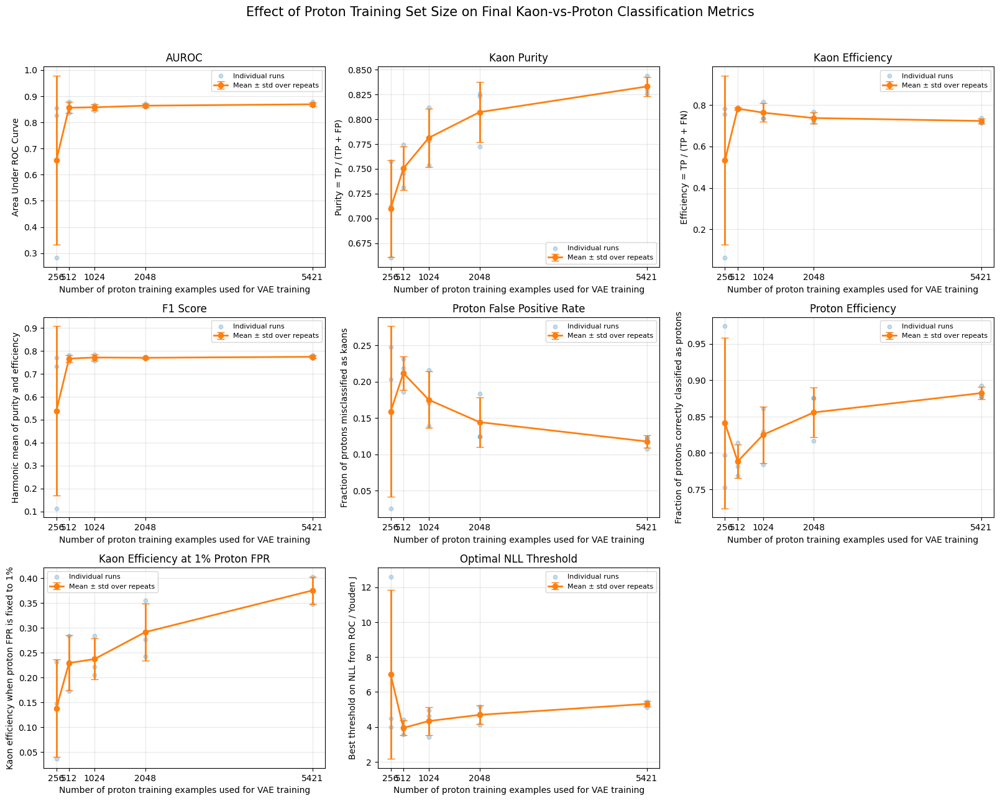

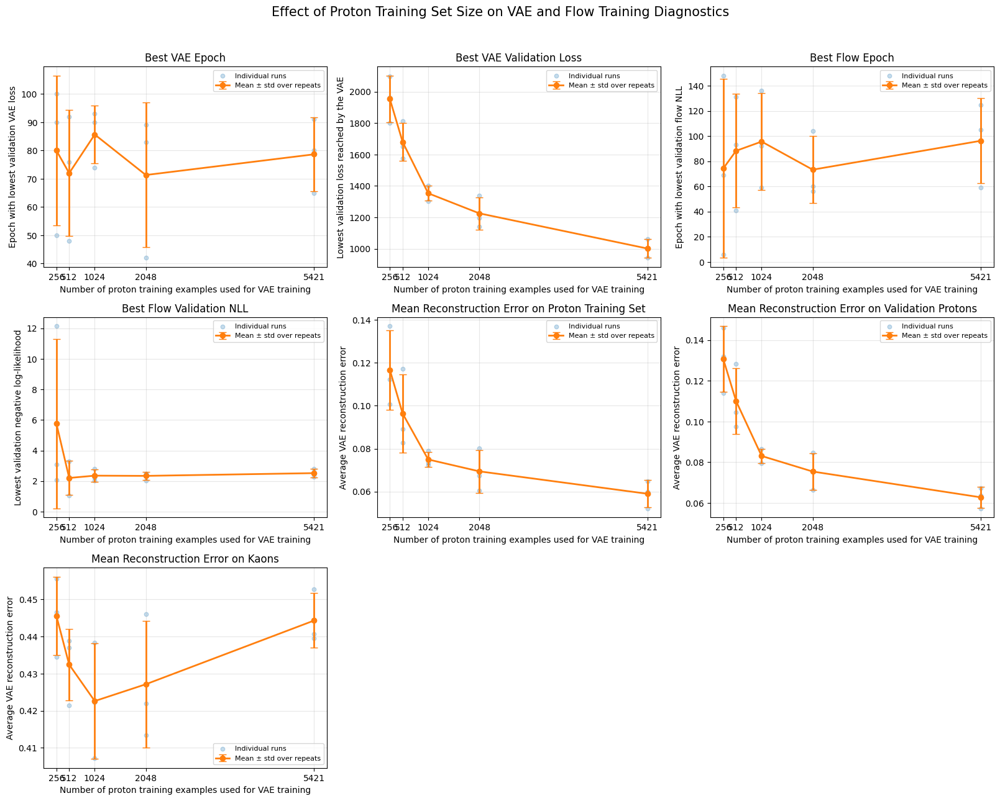

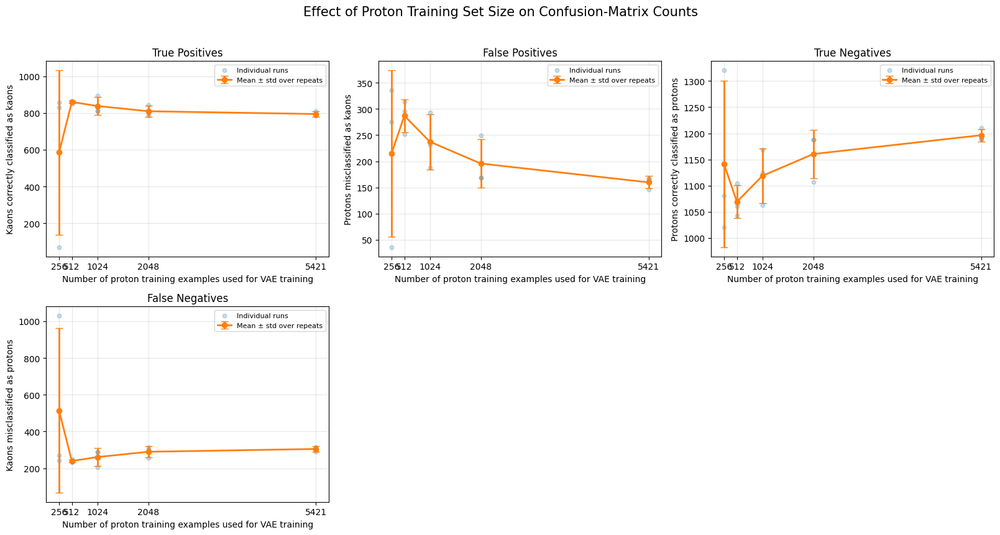

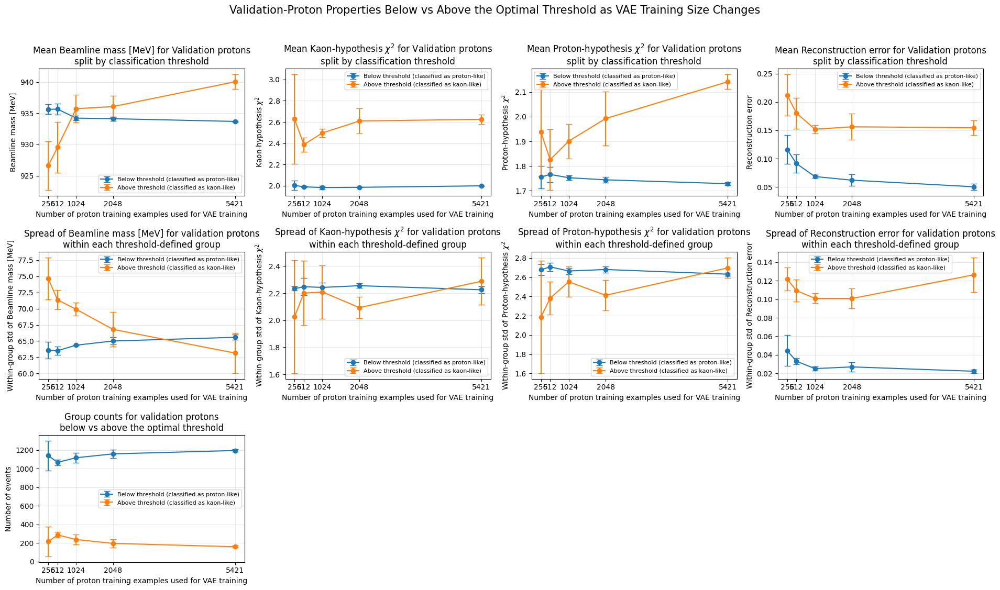

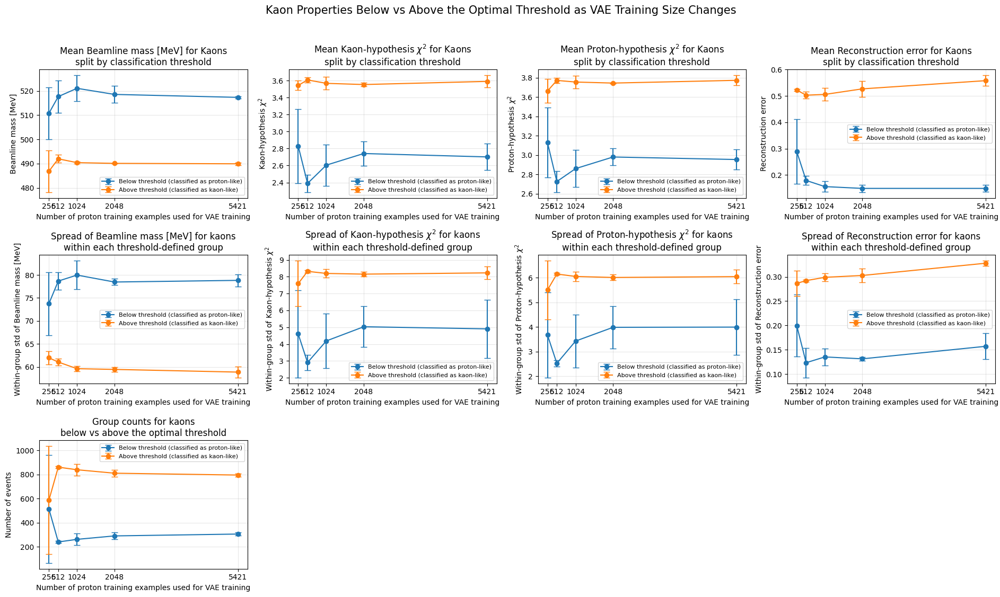

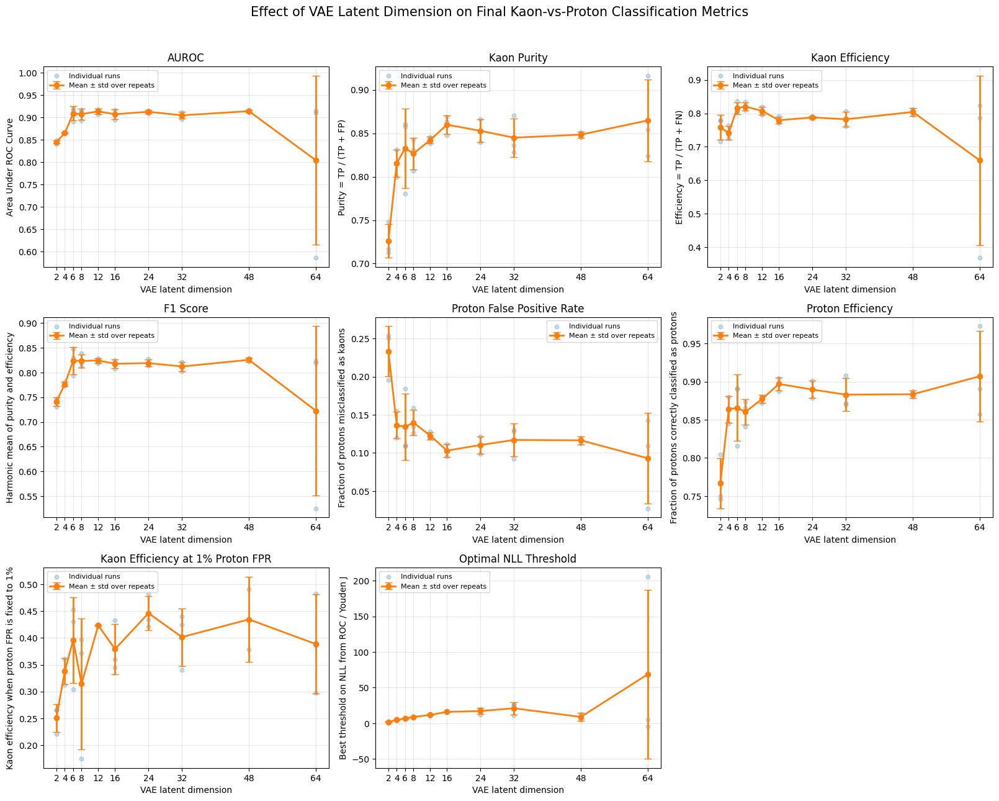

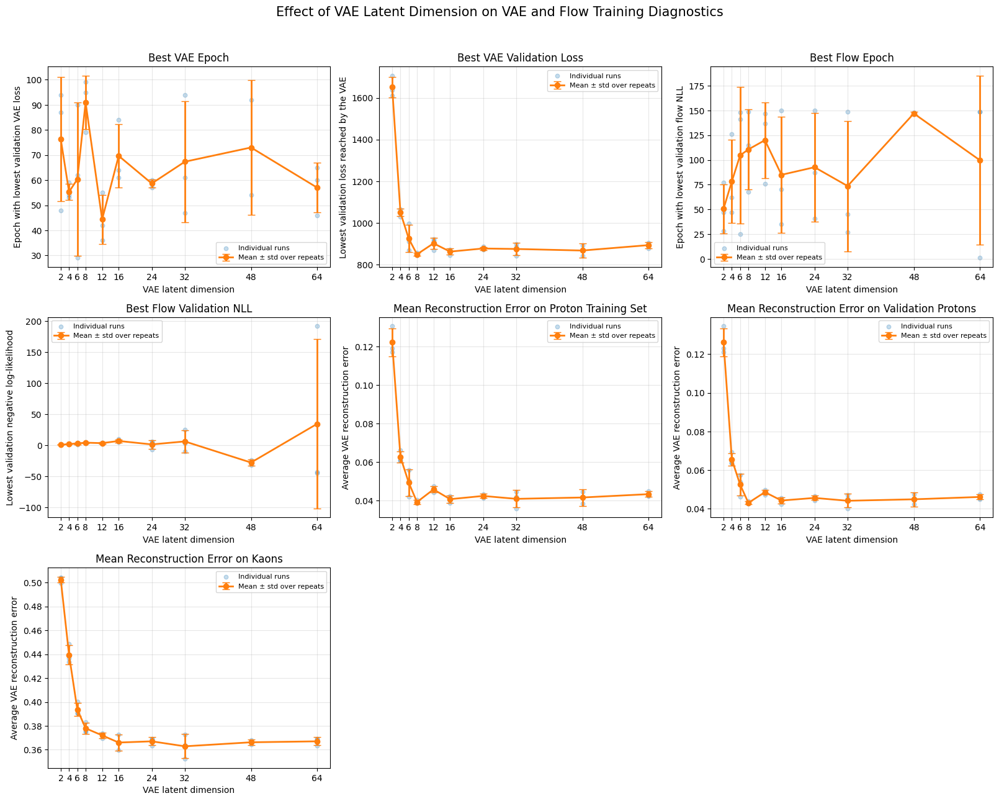

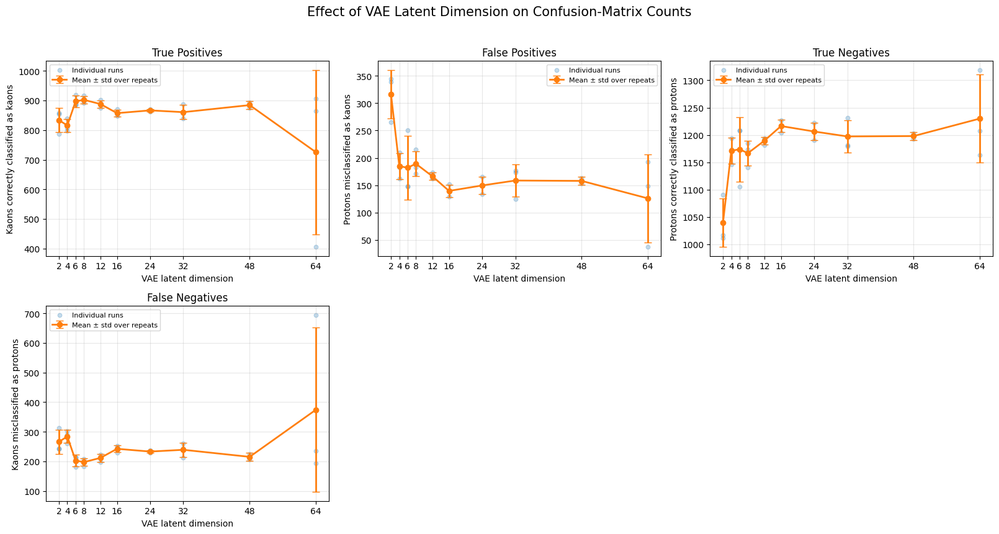

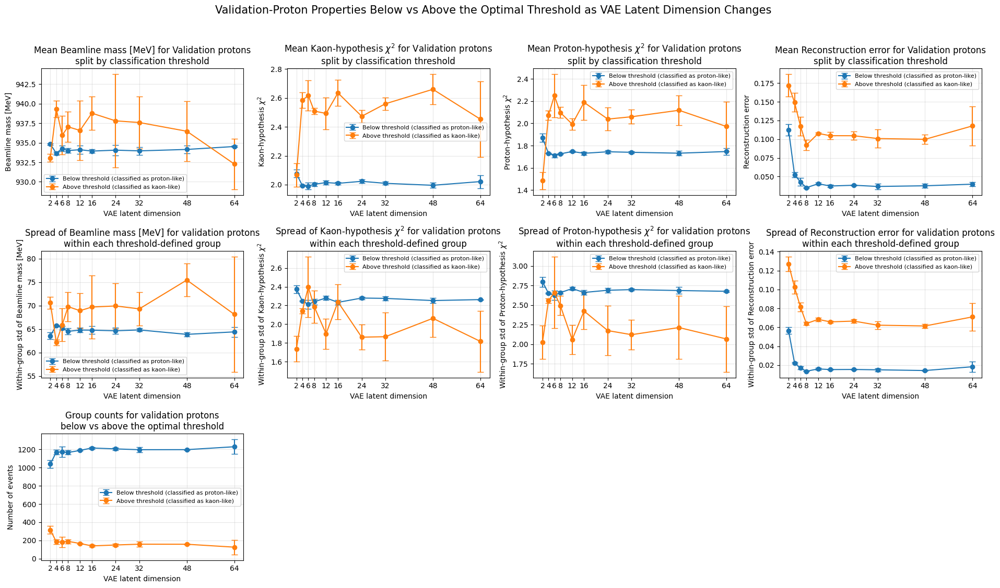

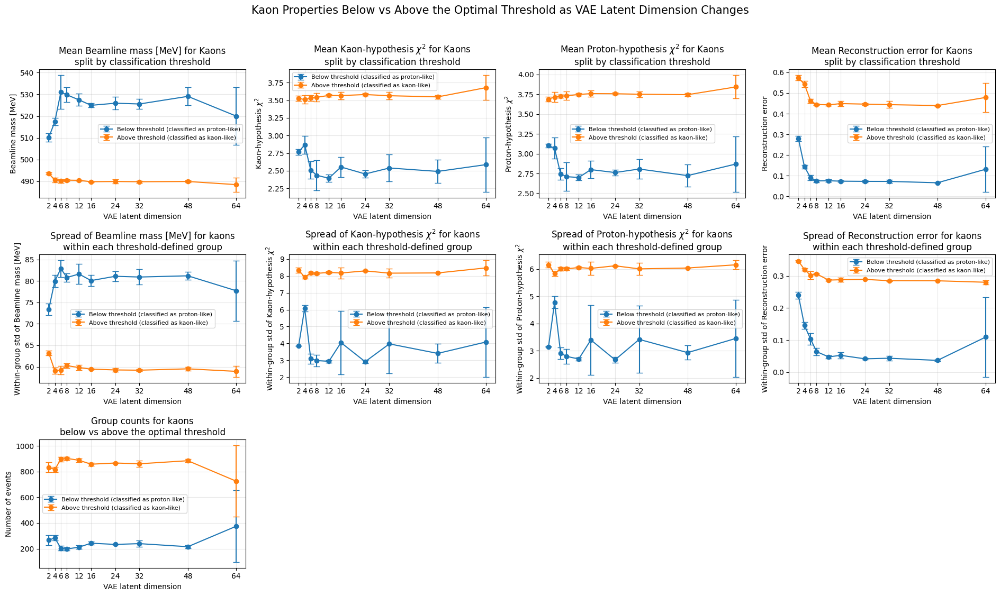

In [ ]:
import math
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

OUT_DIR = Path(".")

size_runs = pd.read_csv(OUT_DIR / "vae_train_size_sweep_runs.csv")
latent_runs = pd.read_csv(OUT_DIR / "vae_latent_dim_sweep_runs.csv")

# ----------------------------
# Clear labels
# ----------------------------
METRIC_LABELS = {
    "auc": ("AUROC", "Area Under ROC Curve"),
    "purity": ("Kaon Purity", "Purity = TP / (TP + FP)"),
    "kaon_eff": ("Kaon Efficiency", "Efficiency = TP / (TP + FN)"),
    "f1": ("F1 Score", "Harmonic mean of purity and efficiency"),
    "proton_fpr": ("Proton False Positive Rate", "Fraction of protons misclassified as kaons"),
    "proton_eff": ("Proton Efficiency", "Fraction of protons correctly classified as protons"),
    "kaon_eff_at_1pct_fpr": ("Kaon Efficiency at 1% Proton FPR", "Kaon efficiency when proton FPR is fixed to 1%"),
    "best_thr_nll": ("Optimal NLL Threshold", "Best threshold on NLL from ROC / Youden J"),
    "vae_best_epoch": ("Best VAE Epoch", "Epoch with lowest validation VAE loss"),
    "vae_best_val_loss": ("Best VAE Validation Loss", "Lowest validation loss reached by the VAE"),
    "flow_best_epoch": ("Best Flow Epoch", "Epoch with lowest validation flow NLL"),
    "flow_best_val_nll": ("Best Flow Validation NLL", "Lowest validation negative log-likelihood"),
    "train_RE_mean": ("Mean Reconstruction Error on Proton Training Set", "Average VAE reconstruction error"),
    "val_RE_mean": ("Mean Reconstruction Error on Validation Protons", "Average VAE reconstruction error"),
    "kaon_RE_mean": ("Mean Reconstruction Error on Kaons", "Average VAE reconstruction error"),
    "tp": ("True Positives", "Kaons correctly classified as kaons"),
    "fp": ("False Positives", "Protons misclassified as kaons"),
    "tn": ("True Negatives", "Protons correctly classified as protons"),
    "fn": ("False Negatives", "Kaons misclassified as protons"),
}

X_LABELS = {
    "n_train": "Number of proton training examples used for VAE training",
    "latent_dim": "VAE latent dimension",
}

PREFIX_LABELS = {
    "valp": "validation protons",
    "kaon": "kaons",
}

QUANTITY_LABELS = {
    "mass": "Beamline mass [MeV]",
    "chi2_k": r"Kaon-hypothesis $\chi^2$",
    "chi2_p": r"Proton-hypothesis $\chi^2$",
    "RE": "Reconstruction error",
}

GROUP_LABELS = {
    "below": "Below threshold (classified as proton-like)",
    "above": "Above threshold (classified as kaon-like)",
}

# ----------------------------
# Helpers
# ----------------------------
def grouped_mean_std(df, xcol, cols):
    g = df.groupby(xcol)[cols].agg(["mean", "std"]).reset_index()
    g.columns = [
        xcol if c[0] == xcol else f"{c[0]}__{c[1]}"
        for c in g.columns.to_flat_index()
    ]
    return g

def metric_title(metric):
    return METRIC_LABELS.get(metric, (metric, metric))[0]

def metric_ylabel(metric):
    return METRIC_LABELS.get(metric, (metric, metric))[1]

def plot_metric_grid(df_runs, xcol, metrics, title, ncols=3, raw_alpha=0.25):
    summary = grouped_mean_std(df_runs, xcol, metrics)
    nrows = math.ceil(len(metrics) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.4 * ncols, 4.2 * nrows), squeeze=False)

    for ax, metric in zip(axes.ravel(), metrics):
        ax.scatter(
            df_runs[xcol],
            df_runs[metric],
            s=22,
            alpha=raw_alpha,
            color="tab:blue",
            label="Individual runs"
        )
        ax.errorbar(
            summary[xcol],
            summary[f"{metric}__mean"],
            yerr=summary[f"{metric}__std"].fillna(0.0),
            fmt="o-",
            capsize=4,
            color="tab:orange",
            lw=2,
            label="Mean ± std over repeats"
        )
        ax.set_xlabel(X_LABELS.get(xcol, xcol))
        ax.set_ylabel(metric_ylabel(metric))
        ax.set_title(metric_title(metric))
        ax.set_xticks(sorted(df_runs[xcol].unique()))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=8)

    for ax in axes.ravel()[len(metrics):]:
        ax.axis("off")

    fig.suptitle(title, y=1.02, fontsize=15)
    plt.tight_layout()
    plt.show()

def plot_threshold_block(df_runs, xcol, prefix, title):
    quantities = ["mass", "chi2_k", "chi2_p", "RE"]

    needed_cols = []
    for q in quantities:
        needed_cols.extend([
            f"{prefix}_below_{q}_mean",
            f"{prefix}_below_{q}_std",
            f"{prefix}_above_{q}_mean",
            f"{prefix}_above_{q}_std",
        ])
    needed_cols.extend([f"{prefix}_below_n", f"{prefix}_above_n"])

    summary = grouped_mean_std(df_runs, xcol, needed_cols)

    fig, axes = plt.subplots(3, 4, figsize=(19, 11), squeeze=False)

    for col_idx, q in enumerate(quantities):
        ax = axes[0, col_idx]
        for side, color in [("below", "tab:blue"), ("above", "tab:orange")]:
            base = f"{prefix}_{side}_{q}_mean"
            ax.errorbar(
                summary[xcol],
                summary[f"{base}__mean"],
                yerr=summary[f"{base}__std"].fillna(0.0),
                fmt="o-",
                capsize=4,
                color=color,
                label=GROUP_LABELS[side],
            )
        ax.set_xlabel(X_LABELS.get(xcol, xcol))
        ax.set_ylabel(QUANTITY_LABELS[q])
        ax.set_title(
            f"Mean {QUANTITY_LABELS[q]} for {PREFIX_LABELS[prefix].capitalize()}\n"
            f"split by classification threshold"
        )
        ax.set_xticks(sorted(df_runs[xcol].unique()))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=8)

    for col_idx, q in enumerate(quantities):
        ax = axes[1, col_idx]
        for side, color in [("below", "tab:blue"), ("above", "tab:orange")]:
            base = f"{prefix}_{side}_{q}_std"
            ax.errorbar(
                summary[xcol],
                summary[f"{base}__mean"],
                yerr=summary[f"{base}__std"].fillna(0.0),
                fmt="o-",
                capsize=4,
                color=color,
                label=GROUP_LABELS[side],
            )
        ax.set_xlabel(X_LABELS.get(xcol, xcol))
        ax.set_ylabel(f"Within-group std of {QUANTITY_LABELS[q]}")
        ax.set_title(
            f"Spread of {QUANTITY_LABELS[q]} for {PREFIX_LABELS[prefix]}\n"
            f"within each threshold-defined group"
        )
        ax.set_xticks(sorted(df_runs[xcol].unique()))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=8)

    ax = axes[2, 0]
    for side, color in [("below", "tab:blue"), ("above", "tab:orange")]:
        base = f"{prefix}_{side}_n"
        ax.errorbar(
            summary[xcol],
            summary[f"{base}__mean"],
            yerr=summary[f"{base}__std"].fillna(0.0),
            fmt="o-",
            capsize=4,
            color=color,
            label=GROUP_LABELS[side],
        )
    ax.set_xlabel(X_LABELS.get(xcol, xcol))
    ax.set_ylabel("Number of events")
    ax.set_title(
        f"Group counts for {PREFIX_LABELS[prefix]}\n"
        f"below vs above the optimal threshold"
    )
    ax.set_xticks(sorted(df_runs[xcol].unique()))
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

    for ax in axes[2, 1:]:
        ax.axis("off")

    fig.suptitle(title, y=1.02, fontsize=15)
    plt.tight_layout()
    plt.show()

# ----------------------------
# What to plot
# ----------------------------
main_metrics = [
    "auc",
    "purity",
    "kaon_eff",
    "f1",
    "proton_fpr",
    "proton_eff",
    "kaon_eff_at_1pct_fpr",
    "best_thr_nll",
]

diagnostics = [
    "vae_best_epoch",
    "vae_best_val_loss",
    "flow_best_epoch",
    "flow_best_val_nll",
    "train_RE_mean",
    "val_RE_mean",
    "kaon_RE_mean",
]

confusion_cols = [
    "tp",
    "fp",
    "tn",
    "fn",
]

# ----------------------------
# Size sweep plots
# ----------------------------
size_runs_plot = size_runs[size_runs["n_train"] >= 256].copy()

plot_metric_grid(
    size_runs_plot,
    "n_train",
    main_metrics,
    "Effect of Proton Training Set Size on Final Kaon-vs-Proton Classification Metrics"
)
plot_metric_grid(
    size_runs_plot,
    "n_train",
    diagnostics,
    "Effect of Proton Training Set Size on VAE and Flow Training Diagnostics"
)
plot_metric_grid(
    size_runs_plot,
    "n_train",
    confusion_cols,
    "Effect of Proton Training Set Size on Confusion-Matrix Counts"
)
plot_threshold_block(
    size_runs_plot,
    "n_train",
    "valp",
    "Validation-Proton Properties Below vs Above the Optimal Threshold as VAE Training Size Changes"
)
plot_threshold_block(
    size_runs_plot,
    "n_train",
    "kaon",
    "Kaon Properties Below vs Above the Optimal Threshold as VAE Training Size Changes"
)

# ----------------------------
# Latent-dim sweep plots
# ----------------------------
plot_metric_grid(
    latent_runs,
    "latent_dim",
    main_metrics,
    "Effect of VAE Latent Dimension on Final Kaon-vs-Proton Classification Metrics"
)
plot_metric_grid(
    latent_runs,
    "latent_dim",
    diagnostics,
    "Effect of VAE Latent Dimension on VAE and Flow Training Diagnostics"
)
plot_metric_grid(
    latent_runs,
    "latent_dim",
    confusion_cols,
    "Effect of VAE Latent Dimension on Confusion-Matrix Counts"
)
plot_threshold_block(
    latent_runs,
    "latent_dim",
    "valp",
    "Validation-Proton Properties Below vs Above the Optimal Threshold as VAE Latent Dimension Changes"
)
plot_threshold_block(
    latent_runs,
    "latent_dim",
    "kaon",
    "Kaon Properties Below vs Above the Optimal Threshold as VAE Latent Dimension Changes"
)
